In [1]:
# define logging and working directory
from ProjectRoot import change_wd_to_project_root
change_wd_to_project_root()
from src.utils.Notebook_imports import *
#from pyforest import *
from src.utils.Tensorflow_helper import choose_gpu_by_id
from tensorflow.keras.utils import plot_model
from tensorflow.python.client import device_lib
import tensorflow as tf
tf.get_logger().setLevel('ERROR')
import cv2
# define GPU id to use
GPU_IDS = '0,1'
GPUS = choose_gpu_by_id(GPU_IDS)
print(GPUS)

# jupyter magic config
%matplotlib inline
%reload_ext autoreload
%autoreload 2

# import helpers
from src.utils.Utils_io import Console_and_file_logger, init_config
from src.visualization.Visualize import show_2D_or_3D
from src.data.Dataset import get_img_msk_files_from_split_dir, load_acdc_files, get_train_data_from_df, get_trainings_files
from src.data.Generators import DataGenerator, get_samples, CycleMotionDataGenerator
from src.utils.KerasCallbacks import get_callbacks
import src.utils.Metrics_own as metr
import src.models.SpatialTransformer as st
from src.models.SpatialTransformer import create_affine_cycle_transformer_model
from src.models.ModelUtils import load_pretrained_model

# path params
ARCHITECTURE = '3D' # 2D
DATASET = 'GCN'  # 'acdc' # or 'gcn'
FOLD = 1 # CV fold 0-3

# Define an experiment name, could have subfolder conventions
EXP_NAME = 'ax_sax/unetwithdownsamplingaugmentation_new_data'

# Uniform path names, separation of concerns
EXPERIMENT = '{}/{}'.format(ARCHITECTURE, EXP_NAME)
timestemp = str(datetime.datetime.now().strftime("%Y-%m-%d_%H_%M"))
#TRAIN_PATH = 'data/raw/{}/{}/train/'.format(DATASET, ARCHITECTURE)
#VAL_PATH = 'data/raw/{}/{}/val/'.format(DATASET, ARCHITECTURE)
#TEST_PATH = 'data/raw/{}/{}/val/'.format(DATASET, ARCHITECTURE)

DATA_PATH = '/mnt/ssd/data/gcn/ax_sax_from_flo/AX_3D/' # for cv
DATA_PATH_AX2SAX = DATA_PATH.replace('AX_3D', 'AX_to_SAX_3D')
DF_PATH = '/mnt/ssd/data/gcn/gcn_05_2020_ax_sax_86/folds.csv'

MODEL_PATH = os.path.join('models', EXPERIMENT, timestemp)
TENSORBOARD_LOG_DIR = os.path.join('reports/tensorboard_logs', EXPERIMENT,timestemp)
CONFIG_PATH = os.path.join('reports/configs/',EXPERIMENT,timestemp)
HISTORY_PATH = os.path.join('reports/history/',EXPERIMENT,timestemp)

# Hyperparameters and experiment definition, to avoid code changes and parameter combinations compareable
DIM = [72, 112, 112] # network input params for spacing of 3, (z,y,x)
DEPTH = 4 # number of down-/upsampling blocks
FILTERS = 16 # initial number of filters, will be doubled after each downsampling block
SPACING = [3,3, 3] # if resample, resample to this spacing, (z,y,x)
M_POOL = [2, 2, 2]# used for downsampling and upsampling
F_SIZE = [3, 3, 3] # conv filter size
IMG_CHANNELS = 1 # Currently our model needs that image channel
MASK_VALUES = [1, 2, 3]  #channel order: Background, RV, MYO, LV
MASK_CLASSES = len(MASK_VALUES) # no of labels
BORDER_MODE = cv2.BORDER_REFLECT_101
IMG_INTERPOLATION = cv2.INTER_LINEAR
MSK_INTERPOLATION = cv2.INTER_NEAREST
AUGMENT = False
SHUFFLE = True
AUGMENT_GRID = False
RESAMPLE = True
SCALER = 'MinMax' # MinMax Standard or Robust

AX_LOSS_WEIGHT = 1.0
WEIGHT_MSE_INPLANE = True
MASK_SMALLER_THAN_THRESHOLD = 0.001

SAX_LOSS_WEIGHT = 1.0
CYCLE_LOSS = True

FOCUS_LOSS_WEIGHT = 1.0
FOCUS_LOSS = True
USE_SAX2AX_PROB = False
MIN_UNET_PROBABILITY = 0.8

# training params
GENERATOR_WORKER = 2 # if not set, use batchsize
SEED = 42 # define a seed for the generator shuffle
BATCHSIZE = 2 # 32, 64, 24, 16, 1 for 3D use: 8
INITIAL_EPOCH = 0 # change this to continue training
EPOCHS = 300 # define a maximum numbers of epochs
EPOCHS_BETWEEN_CHECKPOINTS = 5
MONITOR_FUNCTION = 'val_loss'
MONITOR_MODE = 'min'
SAVE_MODEL_FUNCTION = 'val_loss'
SAVE_MODEL_MODE = 'min'
MODEL_PATIENCE = 20
BN_FIRST = False # decide if BN between Conv and activation or afterwards
BATCH_NORMALISATION = True # apply BN or not
USE_UPSAMPLE = True # otherwise use transpose
PAD = 'same' # padding strategy
KERNEL_INIT = 'he_normal' # conv weight initialisation
OPTIMIZER = 'adam' # Adam, Adagrad, RMSprop, Adadelta,  # https://keras.io/optimizers/
ACTIVATION = 'elu' # tf.keras.layers.LeakyReLU(), relu or any other non linear activation function
LEARNING_RATE = 1e-4 # start with a huge lr to converge fast
DECAY_FACTOR = 0.3 # Define a learning rate decay for the ReduceLROnPlateau callback
MIN_LR = 1e-10 # minimal lr, smaller lr does not improve the model
DROPOUT_min = 0.3 # lower dropout at the shallow layers
DROPOUT_max = 0.5 # higher dropout at the deep layers

metrics = [
    metr.dice_coef_labels,
    metr.dice_coef_myo,
    metr.dice_coef_lv,
    metr.dice_coef_rv
]


LOSS_FUNCTION = metr.bce_dice_loss

Console_and_file_logger(EXPERIMENT, logging.INFO)

# Define a config for param injection,
# save a serialized version, 
# make sure all paths exist
config = init_config(config=locals(), save=True)
print(config)

search for root_dir and set working directory
Working directory set to: /mnt/ssd/git/3d-mri-domain-adaption


2020-12-01 16:37:42,366 INFO -------------------- Start --------------------
2020-12-01 16:37:42,366 INFO Working directory: /mnt/ssd/git/3d-mri-domain-adaption.
2020-12-01 16:37:42,367 INFO Log file: ./logs/3D/ax_sax/unetwithdownsamplingaugmentation_new_data.log
2020-12-01 16:37:42,367 INFO Log level for console: INFO


['/gpu:0', '/gpu:1']
{'GPU_IDS': '0,1', 'GPUS': ['/gpu:0', '/gpu:1'], 'ARCHITECTURE': '3D', 'DATASET': 'GCN', 'FOLD': 1, 'EXP_NAME': 'ax_sax/unetwithdownsamplingaugmentation_new_data', 'EXPERIMENT': '3D/ax_sax/unetwithdownsamplingaugmentation_new_data', 'DATA_PATH': '/mnt/ssd/data/gcn/ax_sax_from_flo/AX_3D/', 'DATA_PATH_AX2SAX': '/mnt/ssd/data/gcn/ax_sax_from_flo/AX_to_SAX_3D/', 'DF_PATH': '/mnt/ssd/data/gcn/gcn_05_2020_ax_sax_86/folds.csv', 'MODEL_PATH': 'models/3D/ax_sax/unetwithdownsamplingaugmentation_new_data/2020-12-01_16_37', 'TENSORBOARD_LOG_DIR': 'reports/tensorboard_logs/3D/ax_sax/unetwithdownsamplingaugmentation_new_data/2020-12-01_16_37', 'CONFIG_PATH': 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation_new_data/2020-12-01_16_37', 'HISTORY_PATH': 'reports/history/3D/ax_sax/unetwithdownsamplingaugmentation_new_data/2020-12-01_16_37', 'DIM': [72, 112, 112], 'DEPTH': 4, 'FILTERS': 16, 'SPACING': [3, 3, 3], 'M_POOL': [2, 2, 2], 'F_SIZE': [3, 3, 3], 'IMG_CHANNELS': 1, '

# Check Tensorflow setup and available GPUs

In [2]:
from tensorflow.keras.mixed_precision import experimental as mixed_precision
logging.info('Is built with tensorflow: {}'.format(tf.test.is_built_with_cuda()))
logging.info('Visible devices:\n{}'.format(tf.config.list_physical_devices()))
logging.info('Local devices: \n {}'.format(device_lib.list_local_devices()))
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_policy(policy)
logging.info('Compute dtype: %s' % policy.compute_dtype)
logging.info('Variable dtype: %s' % policy.variable_dtype)

2020-12-01 16:37:42,641 INFO Is built with tensorflow: True
2020-12-01 16:37:42,710 INFO Visible devices:
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:XLA_CPU:0', device_type='XLA_CPU'), PhysicalDevice(name='/physical_device:XLA_GPU:0', device_type='XLA_GPU'), PhysicalDevice(name='/physical_device:XLA_GPU:1', device_type='XLA_GPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
2020-12-01 16:37:43,330 INFO Local devices: 
 [name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 1597646282438180036
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 1697523107961721316
physical_device_desc: "device: XLA_CPU device"
, name: "/device:XLA_GPU:0"
device_type: "XLA_GPU"
memory_limit: 17179869184
locality {
}
incarnation: 9168422984074766418
physical_device_desc: 

# Load trainings and validation files for the choosen fold

In [3]:
# Load AX volumes
x_train_ax, y_train_ax, x_val_ax, y_val_ax =  get_trainings_files(data_path=DATA_PATH,path_to_folds_df=DF_PATH, fold=FOLD)

logging.info('AX x_train files: {}, AX y_train files: {}'.format(len(x_train_ax), len(y_train_ax)))
logging.info('AX x_val files: {}, AX y_val files: {}'.format(len(x_val_ax), len(y_val_ax)))

# load AX2SAX volumes, they should be in the same directory but with a different suffix --> AX_to_SAX_3D
x_train_sax, y_train_sax, x_val_sax, y_val_sax =  get_trainings_files(data_path=DATA_PATH_AX2SAX,path_to_folds_df=DF_PATH, fold=FOLD)
config = init_config(config)

logging.info('x_train files: {}, y_train files: {}'.format(len(x_train_sax), len(y_train_sax)))
logging.info('x_val files: {}, y_val files: {}'.format(len(x_val_sax), len(y_val_sax)))

2020-12-01 16:37:44,641 INFO Found 162 images/masks in /mnt/ssd/data/gcn/ax_sax_from_flo/AX_3D/
2020-12-01 16:37:44,641 INFO Patients train: 64
2020-12-01 16:37:44,647 INFO Selected 124 of 162 files with 64 of 86 patients for training fold 1
2020-12-01 16:37:44,648 INFO AX x_train files: 124, AX y_train files: 124
2020-12-01 16:37:44,648 INFO AX x_val files: 38, AX y_val files: 38
2020-12-01 16:37:44,653 INFO Found 162 images/masks in /mnt/ssd/data/gcn/ax_sax_from_flo/AX_to_SAX_3D/
2020-12-01 16:37:44,653 INFO Patients train: 64
2020-12-01 16:37:44,659 INFO Selected 124 of 162 files with 64 of 86 patients for training fold 1
2020-12-01 16:37:44,661 INFO x_train files: 124, y_train files: 124
2020-12-01 16:37:44,661 INFO x_val files: 38, y_val files: 38


In [4]:
# filter files by name, debugging purpose
#x_val_ax = [x for x in x_val_ax if '4A4PVCYL_2006' in x]
#x_val_sax = [x for x in x_val_sax if '4A4PVCYL_2006' in x]
#y_val_ax = [x for x in y_val_ax if '4A4PVCYL_2006' in x]
print(len(x_val_ax))
print(len(x_val_sax))
print(len(y_val_ax))

38
38
38


In [5]:
# create two generators, one for the training files, one for the validation files
batch_generator = CycleMotionDataGenerator(x_train_ax, x_train_sax, config)
valid_config = config.copy()
valid_config['AUGMENT_GRID'] = False
valid_config['AUGMENT'] = False
valid_generator = CycleMotionDataGenerator(x_val_ax, x_val_sax, valid_config)

2020-12-01 16:37:46,850 INFO Create DataGenerator
2020-12-01 16:37:46,851 INFO Datagenerator created with: 
 shape: [72, 112, 112]
 spacing: [3, 3, 3]
 batchsize: 2
 Scaler: MinMax
 Images: 124 
 Augment_grid: False 
 Thread workers: 2
2020-12-01 16:37:46,852 INFO No augmentation
2020-12-01 16:37:46,852 INFO Create DataGenerator
2020-12-01 16:37:46,853 INFO Datagenerator created with: 
 shape: [72, 112, 112]
 spacing: [3, 3, 3]
 batchsize: 2
 Scaler: MinMax
 Images: 38 
 Augment_grid: False 
 Thread workers: 2
2020-12-01 16:37:46,853 INFO No augmentation


In [6]:
# Select batch generator output
x = ''
y = ''
@interact
def select_batch(batch = (0,len(valid_generator), 1)):
    global x, y, x2, y2
    input_ , output_ = valid_generator.__getitem__(batch)
    x = input_[0]
    y = output_[0]
    x2 = input_[1]
    y2 = output_[1]
    logging.info('input elements: {}'.format(len(input_)))
    logging.info('output elements: {}'.format(len(output_)))
    logging.info(x.shape)
    logging.info(y.shape)
    logging.info(x2.shape)
    logging.info(y2.shape)

interactive(children=(IntSlider(value=9, description='batch', max=19), Output()), _dom_classes=('widget-intera…

In [7]:
@interact
def select_image_in_batch(im = (0,x.shape[0]- 1, 1),slice_by=(1,6)):
    
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.DEBUG)
    temp_dir = 'reports/figures/temp/'
    ensure_dir(temp_dir)

    logging.info('AX: {}'.format(x[im].shape))
    show_2D_or_3D(x[im][...,0][::slice_by])
    plt.savefig(os.path.join(temp_dir,'ax.pdf'))
    plt.show()
    logging.info('AXtoSAX: {}'.format(y[im].shape))
    show_2D_or_3D(y[im][...,0][::slice_by])
    plt.savefig(os.path.join(temp_dir,'ax2sax.pdf'))
    plt.show()
    logging.info('SAX: {}'.format(x2[im].shape))
    show_2D_or_3D(x2[im][...,0][::slice_by])
    plt.savefig(os.path.join(temp_dir,'sax.pdf'))
    plt.show()
    logging.info('SAXtoAX: {}'.format(y2[im].shape))
    show_2D_or_3D(y2[im][...,0][::slice_by])
    plt.savefig(os.path.join(temp_dir,'sax2ax.pdf'))
    plt.show()
    

interactive(children=(IntSlider(value=0, description='im', max=1), IntSlider(value=3, description='slice_by', …

In [8]:
# load a pretrained 2D unet
"""
load past config for model training 
"""
if 'strategy' not in globals():
    # distribute the training with the mirrored data paradigm across multiple gpus if available, if not use gpu 0
    strategy = tf.distribute.MirroredStrategy(devices=config.get('GPUS', ["/gpu:0"]))
    
if 'config_chooser' in locals():
    config_file  = config_chooser.selected
else:
    #config_file = '/mnt/ssd/git/3d-mri-domain-adaption/reports/configs/2D/gcn_and_acdc_excl_ax/config.json' # config for TMI paper
    config_file = '/mnt/ssd/git/cardio/reports/configs/2D/gcn_05_2020_sax_excl_ax_patients/2020-11-20_17_24/config.json' # retrained with downsampling

# load config with all params into global namespace
with open(config_file, encoding='utf-8') as data_file:
    config_temp = json.loads(data_file.read())
config_temp['LOSS_FUNCTION'] = config['LOSS_FUNCTION']
logging.info('Load model from Experiment: {}'.format(config_temp['EXPERIMENT']))

with strategy.scope():
    globals()['unet'] = load_pretrained_model(config_temp, metrics, comp=False)

2020-12-01 16:38:11,563 INFO Load model from Experiment: 2D/gcn_05_2020_sax_excl_ax_patients
2020-12-01 16:38:11,564 INFO load model with keras api
2020-12-01 16:38:13,917 INFO Unable to restore custom object of type _tf_keras_metric currently. Please make sure that the layer implements `get_config`and `from_config` when saving. In addition, please use the `custom_objects` arg when calling `load_model()`.
2020-12-01 16:38:13,918 INFO Keras API failed, use json repr. load model from: models/2D/gcn_05_2020_sax_excl_ax_patients/2020-11-20_17_24/model.json .
2020-12-01 16:38:13,919 INFO loading model description
2020-12-01 16:38:14,782 INFO loading model weights
2020-12-01 16:38:14,954 INFO model models/2D/gcn_05_2020_sax_excl_ax_patients/2020-11-20_17_24/model.json loaded


In [9]:
if 'strategy' not in globals():
    # distribute the training with the mirrored data paradigm across multiple gpus if available, if not use gpu 0
    strategy = tf.distribute.MirroredStrategy(devices=config.get('GPUS', ["/gpu:0"]))
# inject the pre-trained unet if given, otherwise build the model without the pretrained unet
with strategy.scope():
    model = st.create_affine_cycle_transformer_model(config=config, metrics=metrics, unet=locals().get('unet', None))

2020-12-01 16:38:17,352 INFO unet given, use it to max probability
2020-12-01 16:38:34,774 INFO adding ax2sax MSE loss with a weighting of 1.0
2020-12-01 16:38:34,775 INFO adding cycle loss with a weighting of 1.0
2020-12-01 16:38:34,776 INFO adding focus loss on mask_prob with a weighting of 1.0


In [10]:
model.summary(line_length=150)
#plot_model(model, to_file='reports/figures/temp_graph.pdf',show_shapes=True)

Model: "affine_cycle_transformer"
______________________________________________________________________________________________________________________________________________________
Layer (type)                                     Output Shape                     Param #           Connected to                                      
input_1 (InputLayer)                             [(None, 72, 112, 112, 1)]        0                                                                   
______________________________________________________________________________________________________________________________________________________
conv_encoder (ConvEncoder)                       ((None, 4, 7, 7, 256), [(None, 7 3537424           input_1[0][0]                                     
______________________________________________________________________________________________________________________________________________________
global_average_pooling3d (GlobalAveragePooling3D (None, 256)

In [11]:
@interact
def select_image_in_batch(im = (0,x.shape[0]- 1, 1),mask_smaller_than='0.001', slice_by=(1,6)):
    global m
    import numpy as np
    temp = x[im]
    sax = x2[im]
    temp_ = y[im]
    
    mask = temp_ >float(mask_smaller_than)
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.INFO)
    logging.info('prediction on: {}'.format(temp.shape))
    show_2D_or_3D(temp[::slice_by])
    plt.show()
    pred, inv_pred, ax2sax_mod, prob, ax_msk,m, m_mod = model.predict(x = [np.expand_dims(temp,axis=0),np.expand_dims(sax,axis=0)])                     
    logging.info('rotated by the model: {}'.format(pred[0].shape))
    show_2D_or_3D(pred[0][::slice_by], mask[::slice_by])
    plt.show()
    logging.info('inverse rotation on SAX: {}'.format(inv_pred[0].shape))
    show_2D_or_3D(inv_pred[0][::slice_by])
    plt.show()
    logging.info('predicted mask: {}'.format(inv_pred[0].shape))
    show_2D_or_3D(prob[0][::slice_by])
    plt.show()
    logging.info('predicted mask in ax: {}'.format(ax_msk[0].shape))
    show_2D_or_3D(ax_msk[0][::slice_by])
    plt.show()
    
    # calculate the loss mask from target AX2SAX image
    mask = temp_ >float(mask_smaller_than)
    logging.info('masked by GT: {}'.format(mask.shape))
    masked = pred[0] * mask
    show_2D_or_3D(masked[::slice_by], mask[::slice_by])
    plt.show()
    logging.info('target (AX2SAX): {}'.format(temp_.shape))
    show_2D_or_3D(temp_[::slice_by])
    plt.show()
    logging.info('Created MSE mask by thresholding the target (AX2SAX) with {}: {}'.format(mask_smaller_than,temp_.shape))
    show_2D_or_3D(mask[::slice_by])
    plt.show()

    try:
        from tensorflow.keras.metrics import MSE as mse
        logging.info('MSE: {}'.format(mse(pred[0], temp_).numpy().mean()))
        logging.info('prob loss: {}'.format(metr.max_volume_loss(min_probabillity=0.5)(temp_[tf.newaxis,...],prob).numpy().mean()))
        print(np.reshape(m[0],(3,4)))
        print(np.reshape(m_mod[0],(3,4)))
    except Exception as e:
        pass

interactive(children=(IntSlider(value=0, description='im', max=1), Text(value='0.001', description='mask_small…

In [ ]:
# train one model
initial_epoch = 0
logging.info('Fit model, start trainings process')
# fit model with trainingsgenerator
results = model.fit(
    x=batch_generator,
    validation_data=valid_generator,
    validation_steps=len(valid_generator),
    epochs=200,
    callbacks = get_callbacks(config, valid_generator),
    steps_per_epoch = len(batch_generator),
    initial_epoch=initial_epoch,
    verbose=1)

2020-12-01 16:39:23,720 INFO Fit model, start trainings process


Epoch 1/200
62/62 [==============================] - ETA: 0s - loss: 3.1686 - ax2sax_loss: 1.2151 - sax2ax_loss: 0.9621 - mask_prob_loss: 0.9913
Epoch 00001: val_loss improved from inf to 3.22926, saving model to models/3D/ax_sax/unetwithdownsamplingaugmentation_new_data/2020-12-01_16_37/model.h5
62/62 [==============================] - 153s 2s/step - loss: 3.1686 - ax2sax_loss: 1.2151 - sax2ax_loss: 0.9621 - mask_prob_loss: 0.9913 - val_loss: 3.2293 - val_ax2sax_loss: 1.2432 - val_sax2ax_loss: 0.9937 - val_mask_prob_loss: 0.9924 - lr: 1.0000e-04
Epoch 2/200
62/62 [==============================] - ETA: 0s - loss: 3.1271 - ax2sax_loss: 1.1894 - sax2ax_loss: 0.9458 - mask_prob_loss: 0.9919
Epoch 00002: val_loss improved from 3.22926 to 3.21492, saving model to models/3D/ax_sax/unetwithdownsamplingaugmentation_new_data/2020-12-01_16_37/model.h5
62/62 [==============================] - 112s 2s/step - loss: 3.1271 - ax2sax_loss: 1.1894 - sax2ax_loss: 0.9458 - mask_prob_loss: 0.9919 - val_l

In [ ]:
# if for any reason you want to save the latest model, use this cell
#tf.keras.models.save_model(model,filepath=config['MODEL_PATH'],overwrite=True,include_optimizer=False,save_format='tf')

In [ ]:
config['MODEL_PATH']

In [14]:
# load pre-trained AXtoSAX rotation model

"""
load past config for model training 
"""
if 'strategy' not in locals():
    # distribute the training with the mirrored data paradigm across multiple gpus if available, if not use gpu 0
    strategy = tf.distribute.MirroredStrategy(devices=config.get('GPUS', ["/gpu:0"]))
#config_file  = 'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_inplaneweight_l3_0_2_1weights/2020-07-24_08_29/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_inplaneweight_l3_0_2_1weights/2020-07-24_10_30/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_inplaneweight_l3_0_2_1weights/2020-07-24_11_59/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_inplaneweight_l3_0_2_1weights/2020-07-24_13_34/config.json'

#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_NOinplaneweight_l3_0_2_1weights/2020-07-25_11_04/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_NOinplaneweight_l3_0_2_1weights/2020-07-26_10_24/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_NOinplaneweight_l3_0_2_1weights/2020-07-26_14_59/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_masked_NOinplaneweight_l3_0_2_1weights/2020-07-26_16_27/config.json'

#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_NOmasked_inplaneweight_l3_0_2_1weights/2020-07-26_20_53/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_NOmasked_inplaneweight_l3_0_2_1weights/2020-07-26_22_26/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_NOmasked_inplaneweight_l3_0_2_1weights/2020-07-27_08_08/config.json'
#config_file  =  'reports/configs/3D/ax_sax/paper/enc_gap_m_ax2sax_unetprob_l1_l2_NOmasked_inplaneweight_l3_0_2_1weights/2020-07-27_09_23/config.json'

# Full 4folds
#config_file = 'reports/configs/3D/ax_sax/full/temp/2020-08-04_14_04/config.json'
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet_cycle/2020-08-04_16_45/config.json' # fold0, guter Fold
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet_cycle/2020-08-04_23_22/config.json' # fold2
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet_cycle/2020-08-05_08_42/config.json' # fold1, guter Fold
#config_file = 'reports/configs/3D/ax_sax/full/temp/2020-08-05_17_52/config.json' # fold3 2nd, guter Fold

# baseline_cycle fold 0 - did not converge in most of the folds
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-05_21_30/config.json'
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-05_22_22/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-05_23_06/config.json'

# baseline_cycle
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-06_08_29/config.json' # fold0
# baseline_cycle Fold 1 did not converge, with this modification it learnt very well:  with 96 x 224 x 224 and inplane weighting
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-06_12_48/config.json' # fold 1
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-06_14_54/config.json' # fold 2
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle/2020-08-06_16_17/config.json' # fold 3

# full model with inplane
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-07_00_31/config.json' # fold 0
# fold 1 repeat, looks good 3D/ax_sax/full/baseline_cycle_unet/2020-08-07_16_42/
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-07_07_51/config.json' # fold 1
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-07_11_42/config.json' # fold 3, did not work
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-07_18_28/config.json' # fold 3
# on downsampled images
#config_file = 'reports/configs/3D/ax_sax/full/baseline_cycle_unet/2020-08-08_07_37/config.json' Fold 2
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_16_20/config.json' Fold 0
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_21_15/config.json' Fold 1

# baseline_unet
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_10_20/config.json' # fold 0
#config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_11_34/config.json' # fold 1
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_15_23/config.json' fold 2
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-08_13_02/config.json' # fold 3

# full model, with inplane and 128
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-10_16_24/config.json' # fold 0
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-10_18_38/config.json' #fold 1
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-12_11_53/config.json' # fold 2
# config_file = 'reports/configs/3D/ax_sax/full/baseline_unet/2020-08-12_12_57/config.json'# fold3

# temp
#config_file = 'reports/configs/3D/ax_sax/weighting/1_ax_1_sax_1_unet/2020-09-30_18_31/config.json'
#config_file = 'reports/configs/3D/ax_sax/weighting/mask_prob_1_ax_1_sax_1_unet/2020-10-01_10_13/config.json'
#config_file = 'reports/configs/3D/ax_sax/weighting/mask_prob_2_ax_2_sax_1_mask2ax_unet/2020-10-01_15_05/config.json'
# config_file = 'reports/configs/3D/ax_sax/weighting/1_ax_1_sax_2_mask2ax_unet/2020-10-01_16_17/config.json'

# Repeat full model on all folds with: weighting mask 1, ax 2, sax 2 (cycle, probability and inplane weighting)
# saved as mask2ax 1_ax_2_sax_2_full_post
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax 1_ax_2_sax_2_full/2020-10-13_17_57/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_2_sax_2_full/2020-10-14_09_32/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_2_sax_2_full/2020-10-14_11_24/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_2_sax_2_full/2020-10-14_16_02/config.json' # Fold 3


# Repeat full model on all folds with: weighting mask 1, ax 10, sax 10 (cycle, probability and inplane weighting)
# saved as mask2ax 1_ax_10_sax_10_full_post
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_10_sax_10_full/2020-10-14_23_10/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_10_sax_10_full/2020-10-15_08_48/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_10_sax_10_full/2020-10-15_10_44/config.json' # Fold 2 
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_10_sax_10_full/2020-10-15_09_45/config.json' # Fold 3

#Use the SAX probability for the focus_loss instead of the SAX2AX probability
#config_file = 'reports/configs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_10_37/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_12_37/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_13_15/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/weighting/masksax_1_ax_10_sax_10_ax_loss/2020-10-16_15_27/config.json' # Fold 3


# Basline model with AX MSE as loss and inplane weighting
# saved as mask2ax0_ax1_sax0_baseline_post
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_0_ax_1_sax_0_ax_loss/2020-10-15_14_50/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_0_ax_1_sax_0_ax_loss/2020-10-15_16_39/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_1_sax_0_ax_loss/2020-10-19_09_42/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/weighting/mask2ax_1_ax_1_sax_0_ax_loss/2020-10-19_10_37/config.json' # Fold 3

# Basline model with inplane and bool loss switches
# saved as mask2ax0_ax1_sax0_baseline_post
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_inplane_fold0/2020-10-19_14_47/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_inplane_fold1/2020-10-19_15_18/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_inplane_fold2/2020-10-19_18_14/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_inplane_fold3/2020-10-19_18_49/config.json' # Fold 3 # did not converge, which is ok and a problem of the baseline

# Baseline model without inplane and bool loss switches
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_NOinplane_fold0/2020-10-20_08_55/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_NOinplane_fold1/2020-10-20_09_20/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_NOinplane_fold2/2020-10-20_09_49/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_0focus_NOinplane_fold3/2020-10-20_10_16/config.json' # Fold 3

# Baseline model with inplane and focus loss on sax masks
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_1focus_inplane_fold0/2020-10-20_12_04/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_1focus_inplane_fold1/2020-10-20_13_17/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_1focus_inplane_fold2/2020-10-20_13_44/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_1focus_inplane_fold3/2020-10-20_15_32/config.json' # Fold 3


# new cropping = no square cropping before resampling and crop or pad
# --> 'data/predicted/papernewcrop_baseline_1ax_1sax_01focus_inplane/3D/'
# Baseline model with inplane 1cycle and 0.1focus loss on sax masks 
#/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0/2020-10-21_15_45/
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold0/2020-10-21_15_45/config.json' # Fold 0 # new cropping
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold1/2020-10-21_17_31/config.json' # Fold 1 # new cropping
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold2/2020-10-21_19_04/config.json' # Fold 2 # new cropping
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_1focus_inplane_fold3/2020-10-21_22_48/config.json' # Fold 3 # new cropping


# Baseline model with inplane and cycle loss weighting 1 1 0
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_0focus_inplane_fold0/2020-10-22_07_41/config.json' # Fold 0 # new cropping
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_0focus_inplane_fold1/2020-10-22_08_15/config.json' # Fold 1 # new cropping
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_0focus_inplane_fold2/2020-10-22_09_54/config.json' # Fold 2 # new cropping
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_0focus_inplane_fold3/2020-10-22_10_16/config.json' # Fold 3 # new cropping

# Baseline model with NOinplane and cycle loss weighting 1 1 0
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_0focus_NOinplane_fold0/2020-10-22_12_07/config.json' # Fold 0 # new cropping

# trained on spacing of 3, did not perform better than the full pipeline
#config_file = 'reports/configs/3D/ax_sax/temp/fullresolutionbaseline_1ax_1sax_01focus_inplane_fold0/2020-10-22_12_57/config.json' # Fold 0 
#config_file = 'reports/configs/3D/ax_sax/temp/fullresolutionbaseline_1ax_1sax_01focus_inplane_fold1/2020-10-22_19_50/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/temp/fullresolutionbaseline_1ax_1sax_01focus_inplane_fold2/2020-10-22_22_03/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/temp/fullresolutionbaseline_1ax_1sax_01focus_inplane_fold3/2020-10-23_07_35/config.json' # Fold 4


# Baseline model ax1 sax0 focus0 NoInplane, experiment name is wrong! this experiments are with AX MSE and no inplane!
#config_file = 'reports/configs/3D/ax_sax/paper/aseline_1ax_1sax_01focus_NOinplane_fold0/2020-10-26_12_07/config.json' # Fold 0 
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_01focus_NOinplane_fold1/2020-10-26_12_56/config.json' # Fold 1
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_01focus_NOinplane_fold2/2020-10-26_13_53/config.json' # Fold 2 
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_01focus_NOinplane_fold3/2020-10-26_16_03/config.json' # Fold 3 


# baseline ax1 sax0 focus01 Noinplane
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_01focus_NOinplane_fold0/2020-10-27_08_57/config.json' # Fold 0 
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_01focus_NOinplane_fold1/2020-10-27_10_53/config.json' # Fold 1 
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_01focus_NOinplane_fold2/2020-10-27_11_39/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_0sax_01focus_NOinplane_fold3/2020-10-27_12_48/config.json' # Fold 3



# baseline ax1 sax1 focus01 Noinplane
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_01focus_NOinplane_fold0/2020-10-27_15_09/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_01focus_NOinplane_fold1/2020-10-27_16_11/config.json' # Fold 1 
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_01focus_NOinplane_fold2/2020-10-27_17_02/config.json' # Fold 2 
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_01focus_NOinplane_fold3/2020-10-27_18_11/config.json' # Fold 2 


# baseline ax1 sax1 focus0 Noinplane
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_0focus_NOinplane_fold0/2020-10-27_19_31/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_0focus_NOinplane_fold1/2020-10-27_22_17/config.json' # Fold 1 
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_0focus_NOinplane_fold2/2020-10-27_22_37/config.json' # Fold 2
#config_file = 'reports/configs/3D/ax_sax/paper/baseline_1ax_1sax_0focus_NOinplane_fold3/2020-10-27_22_55/config.json' # Fold 3

# baseline ax1 sax1 focus0 Noinplane - unet with downsampling 64,112,112
#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-16_16_30/config.json' # Fold 0
# baseline ax1 sax1 focus0 Noinplane - unet with downsampling - 32,64,64
#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-17_16_51/config.json' # Fold 0
# baseline ax1 sax1 focus0 Noinplane - unet with downsampling - 32,64,64 spacing 6,6,6
#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-17_18_34/config.json' # Fold 0
# baseline ax1 sax1 focus0 Noinplane - unet with downsampling - 32,56,56 spacing 6,6,6
#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-17_19_37/config.json' # Fold 0
# baseline ax1 sax1 focus0 Noinplane - unet with downsampling - 64,112,112 spacing 3,3,3 20,10,0.1 no inplane
#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-18_09_52/config.json' # Fold 0

# baseline ax1 sax1 focus0 Noinplane - unet with downsampling - 64,112,112 spacing 3,3,3 20,10,0.1 no inplane mit 20,10,1
#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-18_12_45/config.json' # Fold 0
# baseline ax1 sax1 focus0 Noinplane - unet with downsampling - 64,112,112 spacing 3,3,3 20,10,0.1 no inplane mit 20,10,1
#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-18_14_33/config.json' # Fold 2

# center cropping and size of 64 64 64 
# baseline ax1 sax1 focus0 Noinplane - unet with downsampling - 64,112,112 spacing 3,3,3 20,10,0.1 no inplane mit 20,10,1
#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-19_16_13/config.json' # Fold 2

# center cropping and size of 64 112 112 
# baseline ax1 sax1 focus0 Noinplane - unet with downsampling - 64,112,112 spacing 3,3,3 20,10,0.1 no inplane mit 1,1,1
# config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-19_17_08/config.json' # Fold 2
# baseline ax1 sax1 focus0 Noinplane - unet with downsampling - 64,112,112 spacing 3,3,3 20,10,0.1 WITH inplane mit 1,1,1
# config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-19_18_31/config.json' # Fold 2

# baseline ax1 sax1 focus0 Noinplane - unet with downsampling - 64,112,112 spacing 3,3,3 1,1,1 x100, threshold 0.9
#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-19_22_00/config.json' # Fold 2
# baseline ax1 sax1 focus0 Noinplane - unet with downsampling - 64,112,112 spacing 3,3,3 1,1,1 x100, threshold 0.9
#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-20_09_20/config.json' # Fold 0

# baseline ax1 sax1 focus1 inplane - unet with downsampling - 72,112,112 spacing 3,3,3  inplx100, threshold 0.9
#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-20_11_00/config.json' # Fold 0

# baseline ax1 sax1 focus1 on_SAXpred  NOinplane - unet with downsampling - 72,112,112 spacing 3,3,3  inplx100, threshold 0.9
#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-20_12_36/config.json' # Fold 0
#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation/2020-11-20_12_36/config.json' # Fold 0

#config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation_new_data/2020-11-27_18_19/config.json' # Fold 0

# round the crop and pad values instead of ceil
config_file = 'reports/configs/3D/ax_sax/unetwithdownsamplingaugmentation_new_data/2020-12-01_13_46/config.json' # Fold 0



# load a pre-trained ax2sax model, create the graph and load the weights separately, due to own loss functions, this is easier
with open(config_file, encoding='utf-8') as data_file:
    config_temp = json.loads(data_file.read())
config_temp['LOSS_FUNCTION'] = config['LOSS_FUNCTION']
logging.info('Load model from Experiment: {}'.format(config_temp['EXPERIMENT']))

with strategy.scope():
    globals()['model'] = st.create_affine_cycle_transformer_model(config=config_temp, metrics=metrics, unet=locals().get('unet', None))
    model.load_weights(os.path.join(config_temp['MODEL_PATH'],'model.h5'))
    logging.info('loaded model weights as h5 file')

2020-12-01 15:27:17,392 INFO Load model from Experiment: 3D/ax_sax/unetwithdownsamplingaugmentation_new_data
2020-12-01 15:27:18,147 INFO unet given, use it to max probability
2020-12-01 15:27:38,764 INFO adding ax2sax MSE loss with a weighting of 1.0
2020-12-01 15:27:38,765 INFO adding cycle loss with a weighting of 1.0
2020-12-01 15:27:38,766 INFO adding focus loss on mask_prob with a weighting of 1.0
2020-12-01 15:27:39,011 INFO loaded model weights as h5 file


# Fast predictions with all files of the generator

In [15]:
# predict, visualise the transformation of AX train files
import numpy as np
cfg = config.copy()
cfg['BATCHSIZE'] = 10
cfg['AUGMENT_GRID'] = False
valid_generator = CycleMotionDataGenerator(x_train_ax, x_train_sax, cfg)
input_, output_ = valid_generator.__getitem__(0)
x_ = input_[0]
x2_ = input_[1]
y_ = output_[0]
y2_ = output_[1]
@interact
def select_image_in_batch(im = (0,x_.shape[0]- 1, 1), slice_by=(1,6)):
    global m
    temp = x_[im]
    temp_ = y_[im]
    sax = x2_[im]
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.INFO)
    logging.info('prediction on:')
    show_2D_or_3D(temp[::slice_by])
    plt.show()
    pred, inv_pred, ax2sax_mod, pred_mask, ax2sax_msk,m_first, m = model.predict(x=[np.expand_dims(temp,axis=0),np.expand_dims(sax,axis=0)])

    logging.info('rotated by the model')
    show_2D_or_3D(pred[0][::slice_by])
    plt.show()
    logging.info('modified rotation of the model')
    show_2D_or_3D(ax2sax_mod[0][::slice_by])
    plt.show()
    logging.info('predicted mask:')
    show_2D_or_3D(pred_mask[0][::slice_by])
    plt.show()
    logging.info('target (SAX):')
    show_2D_or_3D(temp_[::slice_by])
    plt.show()
    logging.info('inverted rotation on SAX')
    show_2D_or_3D(inv_pred[0][::slice_by])
    plt.show()
    try:
        print(np.reshape(m_first[0],(3,4)))
        print(np.reshape(m[0],(3,4)))
    except Exception as e:
        pass

2020-12-01 15:27:39,035 INFO Create DataGenerator
2020-12-01 15:27:39,036 INFO Datagenerator created with: 
 shape: [72, 112, 112]
 spacing: [3, 3, 3]
 batchsize: 10
 Scaler: MinMax
 Images: 120 
 Augment_grid: False 
 Thread workers: 2
2020-12-01 15:27:39,036 INFO No augmentation


interactive(children=(IntSlider(value=4, description='im', max=9), IntSlider(value=3, description='slice_by', …

# Predictions on the heldout test split

In [17]:
cfg = config.copy()
cfg['BATCHSIZE'] = len(x_val_ax)
v_generator = CycleMotionDataGenerator(x_val_ax, x_val_sax, cfg)
input_, output_ = v_generator.__getitem__(0)
x_ = input_[0]
x2_ = input_[1]
y_ = output_[0]
y2_ = output_[1]
@interact
def select_image_in_batch(im = (0,x_.shape[0]- 1, 1), slice_by=(1,6)):
    global m
    temp = x_[im]
    temp_ = y_[im]
    sax = x2_[im]
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.INFO)
    logging.info('prediction on:')
    show_2D_or_3D(temp[::slice_by])
    plt.show()
    
    pred, inv_pred, ax2sax_mod, pred_mask, ax_mask, m_first, m = model.predict(x=[np.expand_dims(temp,axis=0),np.expand_dims(sax,axis=0)])
    logging.info('rotated by the model')
    show_2D_or_3D(pred[0][::slice_by])
    plt.show()
    logging.info('modified rotation')
    show_2D_or_3D(ax2sax_mod[0][::slice_by])
    plt.show()
    logging.info('predicted mask')
    show_2D_or_3D(pred_mask[0][::slice_by])
    plt.show()
    logging.info('predicted in AX')
    show_2D_or_3D(ax_mask[0][::slice_by])
    plt.show()
    logging.info('target (SAX):')
    show_2D_or_3D(temp_[::slice_by])
    plt.show()
    logging.info('inverted rotation on SAX')
    show_2D_or_3D(inv_pred[0][::slice_by])
    plt.show()
    print('MSE: {}'.format(mse(pred[0], temp_).numpy().mean()))
    try:
        print(np.reshape(m_first[0],(3,4)))
        print(np.reshape(m[0],(3,4)))
    except Exception as e:
        pass

2020-11-30 17:03:17,001 INFO Create DataGenerator
2020-11-30 17:03:17,002 INFO Datagenerator created with: 
 shape: [72, 112, 112]
 spacing: [3, 3, 3]
 batchsize: 42
 Scaler: MinMax
 Images: 42 
 Augment_grid: False 
 Thread workers: 2
2020-11-30 17:03:17,003 INFO No augmentation


interactive(children=(IntSlider(value=20, description='im', max=41), IntSlider(value=3, description='slice_by'…

## 1. AX and SAX volumes 

Create a MotionDatagenerator from the heldout test split without shuffle and batchsize == len(files)

## 2. AX images and AX masks

Create a Datagenerator from AX image and mask files, both will be used in the next cell for the prediction pipeline

In [16]:
# create a motion generator from the val files without shuffle for sorted predictions
from src.models.SpatialTransformer import create_affine_transformer_fixed
from src.data.Preprocess import from_channel_to_flat, transform_to_binary_mask
from src.data.Postprocess import clean_3d_prediction_3d_cc
import shutil
from src.data.Dataset import copy_meta_and_save
# unetwrapper
from src.models.KerasLayers import UnetWrapper
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input


cfg = config.copy()
cfg['BATCHSIZE'] = len(x_val_ax)
cfg['SHUFFLE'] = False
v_generator = CycleMotionDataGenerator(x_val_ax, x_val_sax, cfg)
input_, output_ = v_generator.__getitem__(0)
x_ = input_[0]
x2_ = input_[1]
y_ = output_[0]
y2_ = output_[1]
msk_cfg = cfg.copy()
msk_cfg['IMG_CHANNELS'] = 1
msk_cfg['DIM'] = [144,224,224]
msk_cfg['SPACING'] = [1.5,1.5,1.5]
msk_cfg['RESAMPLE'] = True
v_msk_generator = DataGenerator(x_val_ax, y_val_ax, msk_cfg)
ax_full, ax_msk_ = v_msk_generator.__getitem__(0)


inp = Input(msk_cfg['DIM'] + [1]) # one 3d volume in full resolution
out = UnetWrapper(unet=unet, resize=True)(inp)
unet_model = Model(inputs=[inp], outputs=[out])


2020-12-01 15:27:39,830 INFO Create DataGenerator
2020-12-01 15:27:39,830 INFO Datagenerator created with: 
 shape: [72, 112, 112]
 spacing: [3, 3, 3]
 batchsize: 42
 Scaler: MinMax
 Images: 42 
 Augment_grid: False 
 Thread workers: 2
2020-12-01 15:27:39,831 INFO No augmentation
2020-12-01 15:27:41,659 INFO Create DataGenerator
2020-12-01 15:27:41,660 INFO Datagenerator created with: 
 shape: [144, 224, 224]
 spacing: [1.5, 1.5, 1.5]
 batchsize: 42
 Scaler: MinMax
 Images: 42 
 Augment_grid: False 
 Thread workers: 2
2020-12-01 15:27:41,660 INFO No augmentation


## Predict AXtoSAX rotation, predict SAX Segmentation, rotate the mask reverse (SAXtoAX) by the predicted inverse
Complete pipeline of the following cell:
1. Select on AX_isotrop volume the slicing distance, an export path and the other parameters
2. The Motion-generator resamples the input to an unique spacing, followed by center pad, crop, quantile clipping and min/max normalisation
3. The Spatial-Transformer transforms the downsampled AX volume into the SAX domain and provides the required transformation matrix m (transformation around the center)
4. This transformation m is than applied to the AX volume in full resolution to receive the AX2SAX volume
5. We reuse the U-Net model, which was injected into the AX2SAX model and create a 3D U-Net wrapper (unet_model)
6. The 3D U-Net wrapper is than used to predict the masks on our transformed AX2SAX volumes in full resolution
7. Connected Component filtering & binarizing with a threshold of 0.5 is applied to the predicted masks, still in SAX domain
6. Label-wise back-transformation of the mask into the AX domain (with linear interpolation and the inverted matrix from 3.).
7. Connected Component filtering is applied to avoid disconnected mask segments, does not happen with the current U-Net model, just in case :)
8. Undo the generator steps, first pad_and_crop to intermediate size (which is the result after resampling the volume to the same spacing)
9. Resample the SAX2AX_pred, AX2SAX2AX_GT and the AX2SAX2AX_cmr into the original spacing of the AX cmr
10. Copy the dicom metadata, direction and origin from the original AX cccmr to the predicted mask, the input AX image, and the AX GT mask, save them to disk

In [17]:
#### 1st try to reconstruct the original physical size
import numpy as np
@interact_manual
def select_image_in_batch_(im=(0, ax_full.shape[0] - 1, 1), 
                          slice_n=(1, 10), 
                          export_path='data/predicted/temp/',
                          debug=False,
                          save=False,
                          postprocess=False,
                          use_mod_translation=False,
                          combine=False,
                          dual_model=False,
                          save_plots=False):
    """
    Use the spatial transformer to rotate, predict segmentations, reverse the rotation on the masks and save the nrrd files (image, gt and pred)
    :param im: slider to select another image from the generator
    :param slice_n: The show_2D_3D method slices to a maximum of 20 slices in z, this parameter allows to further slice the visualisations
    :param export_path: path to save the img, gt and prediction volumes as nrrd file, the file names will be the same as in x_ax_val...
    :param debug: bool to enable plotting of the intermediate steps
    :param save: bool to save the final AX_gt, AX-pred_AX_img files to the disk
    :param postprocess: bool enable the postprocessing such as connected component filtering
    :param use_mod: bool use the second transformation matrix/use_mod (which is optimized by the focus loss), or the first transformation
    :param combine: bool to make a prediction on ax2sax and ax volumes and combine both
    :param dual_model: bool to use multiple Unet models and combine their predictins on the AX2SAX volume
    :return: void
    """
    global m
    from src.data.Preprocess import normalise_image
    from src.data.Postprocess import undo_generator_steps
    from src.data.Dataset import get_reference_nrrd
    tf.get_logger().setLevel('ERROR')
    

    figure_export = 'reports/figures/temp'
    ensure_dir(figure_export)

    full_file_name = y_val_ax[im]
    filename = os.path.basename(full_file_name)
    logging.info(filename)
    ax_small = x_[im]
    ax2sax_small_gt_ = y_[im]
    ax_full_ = ax_full[im]
    ax_msk_full_gt = ax_msk_[im]
    
    # define a different logging level and plot the generator steps
    logging.info('Prediction on AX volume:')
    if debug: show_2D_or_3D(ax_full_[::slice_n*3], save=save_plots,file_name=os.path.join(figure_export, 'ax'))
    plt.show()

    # Predict rotation of AX_small and get transformation matrix
    pred, inv, pred_mod, prob, inv_msk, m, m_mod = model.predict(x=[np.expand_dims(ax_small, axis=0),np.expand_dims(ax_small,axis=0)])
    logging.info('AX --> SAX rotated by the model')
    if debug: show_2D_or_3D(pred[0][::slice_n])
    plt.show()
    logging.info('AX --> SAX with modified m rotated by the model')
    if debug: show_2D_or_3D(pred_mod[0][::slice_n])
    plt.show()
    inv_msk = inv_msk >= 0.5
        
    # scale the translation parameter of the affine matrix from spacing 5 to 1.5
    # Theese lines change m
    transformer_spacing = cfg['SPACING'][0]
    full_spacing = msk_cfg['SPACING'][0]
    
    m_temp = m.copy()
    m_mod_temp = m_mod.copy()
    if use_mod_translation:
        m_scaled = np.reshape(m_mod, (3,4))
    else:
        m_scaled = np.reshape(m, (3,4))
    m_t = m_scaled[:,3] # slice translation
    m_t = m_t *(transformer_spacing/full_spacing) # scale translation
    m_scaled[:,3] = m_t # slice scaled translation back into m
    m_scaled_flatten = m_scaled.flatten()
    
    # show the target AXtoSAX volume
    logging.info('Target (AX2SAX):')
    if debug: show_2D_or_3D(ax2sax_small_gt_[::slice_n])
    plt.show()
    
    # Repeat the transformation on ax with full resolution
    logging.info('Repeat the transformation on the full resolution')
    transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='linear')
    ax2sax_full, m_ = transformer.predict(x=[np.expand_dims(ax_full_, axis=0), np.expand_dims(m_scaled_flatten,axis=0)])
    if debug: show_2D_or_3D(ax2sax_full[0][::slice_n*3])
    plt.show()

    # create a square ident matrix slice m into it
    m_matrix = np.identity(4)
    # slice m (3,4) into identity (4,4)
    m_matrix[:3, :] = m_scaled # this m is already scaled
    # calc inverse, flatten the matrix and cut off the last row to fit the spatial transformer input shape
    m_matrix_inverse = np.linalg.inv(m_matrix)
    m_matrix_inverse_flatten = m_matrix_inverse.flatten()[:-4]
    
    ax2sax_full = normalise_image(ax2sax_full)
    msk = unet_model.predict(x=[ax2sax_full])
    msk_binary = msk>=0.5
    
    # second prediction on the transformed SAX image with a second unet
    if dual_model:
        msk2 = unet_model2.predict(x=[ax2sax_full])
        # merge
        msk[...,-3:] = msk[...,-3:] + msk2[...,-3:]
    
    logging.info('Predicted mask')
    if debug: show_2D_or_3D(ax2sax_full[0][::slice_n*3], msk_binary[0][::slice_n*3], save=save_plots,file_name=os.path.join(figure_export, 'ax2sax'))
    plt.show()

    # apply inverse to our msk and plot it together with the inverse AXtoSAX
    m_transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='linear')
    inv_msk = list()
    
    # compatible with three-channels in the unet - without background channel
    if msk.shape[-1] == 3:
        zero = np.zeros_like(msk[...,0])
        inv_msk.append(zero)
        
    for c in range(msk.shape[-1]):
        inv_m, _ = m_transformer.predict(
            x=[msk[..., c], np.expand_dims(m_matrix_inverse_flatten, axis=0)])
        inv_msk.append(inv_m[..., 0] >= 0.5)
    inv_msk = np.stack(inv_msk, axis=-1)
    
    # postprocessing
    logging.info('Predicted mask rotated to AX on original AX image - before postprocessing')
    if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[0][::slice_n*3])
    plt.show()
    
    if combine:
        msk_ax = unet_model.predict([np.expand_dims(ax_full_, axis=0)])
        # compatible with three-channeled unet without background channel
        if msk_ax.shape[-1] == 3:
            zero = np.zeros_like(msk_ax[...,0:1])
            msk_ax = np.concatenate((zero, msk_ax), axis=-1)
        inv_msk = (inv_msk + msk_ax) >=0.9
        logging.info('Predicted mask rotated to AX combined with ax mask on original AX image - before postprocessing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[0][::slice_n*3])
        plt.show()

    inv_msk = from_channel_to_flat(inv_msk[0])
    
    logging.info('DICE LV: {}'.format(metr.dice_coef_lv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE RV: {}'.format(metr.dice_coef_rv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE MYO: {}'.format(metr.dice_coef_myo(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))

    if postprocess:
        kernel = np.ones((5,5),np.uint8)
        kernel_small = np.ones((3,3),np.uint8)
        
        # close small holes
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after closing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        # make it thinner
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=1) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after opening')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()

    # Finally keep only one CC per label
    inv_msk = clean_3d_prediction_3d_cc(inv_msk)

    logging.info('Predicted mask rotated to AX on original AX image')
    show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3], save=save_plots,file_name=os.path.join(figure_export, 'ax2sax2ax'))
    plt.show()

    # get the AX target segmentation, processed by the generator to have it in the same shape
    msk_gt_flatten = from_channel_to_flat(ax_msk_full_gt,start_c=1) 
    logging.info('GT on AX')
    show_2D_or_3D(ax_full_[::slice_n*3], msk_gt_flatten[::slice_n*3], save=save_plots,file_name=os.path.join(figure_export, 'ax_gt'))
    plt.show()

    ax_full_ = ax_full_[...,0]
    #if debug: globals().update(locals())
    
    p = os.path.basename(full_file_name)
    
    reference_sitk = get_reference_nrrd(p, '/mnt/ssd/data/gcn/ax_sax_from_flo/ax3d/')
    
    sitk_pred = undo_generator_steps(ndarray=inv_msk, cfg=msk_cfg, interpol=sitk.sitkNearestNeighbor, orig_sitk=reference_sitk)
    sitk_ax_img = undo_generator_steps(ndarray=ax_full_,cfg=msk_cfg, interpol=sitk.sitkLinear, orig_sitk=reference_sitk)
    sitk_ax_msk = undo_generator_steps(ndarray=msk_gt_flatten, cfg=msk_cfg, interpol=sitk.sitkNearestNeighbor, orig_sitk=reference_sitk)
    
    nda_ax = sitk.GetArrayFromImage(sitk_ax_img).astype(np.float32)
    nda_pred = transform_to_binary_mask(sitk.GetArrayFromImage(sitk_pred)).astype(np.float32)
    nda_gt = transform_to_binary_mask(sitk.GetArrayFromImage(sitk_ax_msk)).astype(np.float32)
    
    show_2D_or_3D(nda_ax,nda_pred)
    
    ensure_dir(os.path.join(export_path, 'pred'))
    ensure_dir(os.path.join(export_path, 'image'))
    ensure_dir(os.path.join(export_path, 'gt'))

    if save:
        copy_meta_and_save(sitk_pred, reference_sitk, os.path.join(export_path, 'pred', filename))
        copy_meta_and_save(sitk_ax_img, reference_sitk,os.path.join(export_path, 'image', filename.replace('msk', 'img')))
        copy_meta_and_save(sitk_ax_msk, reference_sitk, os.path.join(export_path, 'gt', filename))
        

    logging.info('inv mask shape: {}, gt mask shape: {}'.format(nda_pred.shape, nda_gt.shape))
    logging.info('DICE LV: {}'.format(metr.dice_coef_lv(nda_gt, nda_pred).numpy()))
    logging.info('DICE RV: {}'.format(metr.dice_coef_rv(nda_gt, nda_pred).numpy()))
    logging.info('DICE MYO: {}'.format(metr.dice_coef_myo(nda_gt, nda_pred).numpy()))
    globals()['gt'] = ax_msk_full_gt.astype(np.float32)
    globals()['pred'] = transform_to_binary_mask(inv_msk).astype(np.float32)
    try:
        logging.info('m: {}'.format(np.reshape(m_temp[0], (3, 4))))
        logging.info('m_mod: {}'.format(np.reshape(m_mod_temp[0], (3, 4))))
        logging.info('m_scaled: {}'.format(np.reshape(m_scaled, (3, 4))))
    except Exception as e:
        logging.error(str(e))
        pass


interactive(children=(IntSlider(value=20, description='im', max=41), IntSlider(value=5, description='slice_n',…

# This version was used for the TMI paper !!!

In [30]:
#### NEW VERSIoN WITH full resolution ####
import numpy as np
@interact_manual
def select_image_in_batch_(im=(0, ax_full.shape[0] - 1, 1), 
                          slice_n=(1, 10), 
                          export_path='data/predicted/temp/',
                          debug=False,
                          save=False,
                          postprocess=False,
                          use_mod_translation=False,
                          combine=False,
                          dual_model=False,
                          save_plots=False):
    """
    Use the spatial transformer to rotate, predict segmentations, reverse the rotation on the masks and save the nrrd files (image, gt and pred)
    :param im: slider to select another image from the generator
    :param slice_n: The show_2D_3D method slices to a maximum of 20 slices in z, this parameter allows to further slice the visualisations
    :param export_path: path to save the img, gt and prediction volumes as nrrd file, the file names will be the same as in x_ax_val...
    :param debug: bool to enable plotting of the intermediate steps
    :param save: bool to enable plotting of the intermediate steps
    :param postprocess: bool to enable plotting of the intermediate steps
    :param use_mod: bool to enable plotting of the intermediate steps
    :param combine: bool to make a prediction on ax2sax and ax volumes and combine both
    :param dual_model: bool to predict with two models on the ax2sax volues
    :return: void
    """
    global m
    from src.data.Preprocess import normalise_image
    tf.get_logger().setLevel('ERROR')
    

    figure_export = 'reports/figures/temp'
    ensure_dir(figure_export)

    full_file_name = y_val_ax[im]
    filename = os.path.basename(full_file_name)
    logging.info(filename)
    ax_small = x_[im]
    ax2sax_small_gt_ = y_[im]
    ax_full_ = ax_full[im]
    ax_msk_full_gt = ax_msk_[im]
    
    # define a different logging level and plot the generator steps
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Prediction on AX volume:')
    if debug: show_2D_or_3D(ax_full_[::slice_n*3], save=save_plots,file_name=os.path.join(figure_export, 'ax'))
    plt.show()
    
    # TODO: change m and m_ if we modify the translation parameters
    # Predict rotation of AX_small and get transformation matrix
    pred, inv, pred_mod, prob, inv_msk, m, m_mod = model.predict(x=[np.expand_dims(ax_small, axis=0),np.expand_dims(ax_small,axis=0)])
    logging.info('AX --> SAX rotated by the model')
    if debug: show_2D_or_3D(pred[0][::slice_n])
    plt.show()
    logging.info('AX --> SAX with modified m rotated by the model')
    if debug: show_2D_or_3D(pred_mod[0][::slice_n])
    plt.show()
    inv_msk = inv_msk >= 0.5
        
    # scale the translation parameter of the affine matrix from spacing 5 to 1.5
    # Theese lines change m
    transformer_spacing = cfg['SPACING'][0]
    full_spacing = msk_cfg['SPACING'][0]
    
    m_temp = m.copy()
    m_mod_temp = m_mod.copy()
    if use_mod_translation:
        m_scaled = np.reshape(m_mod, (3,4))
    else:
        m_scaled = np.reshape(m, (3,4))
    m_t = m_scaled[:,3] # slice translation
    m_t = m_t *(transformer_spacing/full_spacing) # scale translation
    m_scaled[:,3] = m_t # slice scaled translation back into m
    m_scaled_flatten = m_scaled.flatten()
    
    # show the target AXtoSAX volume
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Target (AX2SAX):')
    if debug: show_2D_or_3D(ax2sax_small_gt_[::slice_n])
    plt.show()
    
    # Repeat the transformation on ax with full resolution
    logging.info('Repeat the transformation on the full resolution')
    logging.getLogger().setLevel(logging.ERROR)
    transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='linear')
    ax2sax_full, m_ = transformer.predict(x=[np.expand_dims(ax_full_, axis=0), np.expand_dims(m_scaled_flatten,axis=0)])
    if debug: show_2D_or_3D(ax2sax_full[0][::slice_n*3])
    plt.show()

    # create a square ident matrix slice m into it
    m_matrix = np.identity(4)
    # slice m (3,4) into identity (4,4)
    m_matrix[:3, :] = m_scaled # this m is already scaled
    # calc inverse, flatten the matrix and cut off the last row to fit the spatial transformer input shape
    m_matrix_inverse = np.linalg.inv(m_matrix)
    m_matrix_inverse_flatten = m_matrix_inverse.flatten()[:-4]
    
    ax2sax_full = normalise_image(ax2sax_full)
    
    msk = unet_model.predict(x=[ax2sax_full])
    msk_binary = msk>=0.5
    
    # second prediction on the transformed SAX image with a second unet
    if dual_model:
        msk2 = unet_model2.predict(x=[ax2sax_full])
        # merge
        msk[...,-3:] = msk[...,-3:] + msk2[...,-3:]
    
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Predicted mask')
    if debug: show_2D_or_3D(ax2sax_full[0][::slice_n*3], msk_binary[0][::slice_n*3], save=save_plots,file_name=os.path.join(figure_export, 'ax2sax'))
    plt.show()

    # apply inverse to our msk and plot it together with the inverse AXtoSAX
    logging.getLogger().setLevel(logging.ERROR)
    m_transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='linear')
    inv_msk = list()
    
    # compatible with three-channels in the unet - without background channel
    if msk.shape[-1] == 3:
        zero = np.zeros_like(msk[...,0])
        inv_msk.append(zero)
        
    for c in range(msk.shape[-1]):
        inv_m, _ = m_transformer.predict(
            x=[msk[..., c], np.expand_dims(m_matrix_inverse_flatten, axis=0)])
        inv_msk.append(inv_m[..., 0] >= 0.5)
    inv_msk = np.stack(inv_msk, axis=-1)
    
    # postprocessing
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Predicted mask rotated to AX on original AX image - before postprocessing')
    if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[0][::slice_n*3])
    plt.show()
    
    if combine:
        msk_ax = unet_model.predict([np.expand_dims(ax_full_, axis=0)])
        # compatible with three-channeled unet without background channel
        if msk_ax.shape[-1] == 3:
            zero = np.zeros_like(msk_ax[...,0:1])
            msk_ax = np.concatenate((zero, msk_ax), axis=-1)
        inv_msk = (inv_msk + msk_ax) >=0.9
        logging.info('Predicted mask rotated to AX combined with ax mask on original AX image - before postprocessing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[0][::slice_n*3])
        plt.show()

    inv_msk = from_channel_to_flat(inv_msk[0])
    
    logging.info('DICE LV: {}'.format(metr.dice_coef_lv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE RV: {}'.format(metr.dice_coef_rv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE MYO: {}'.format(metr.dice_coef_myo(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))

    if postprocess:
        kernel = np.ones((5,5),np.uint8)
        kernel_small = np.ones((3,3),np.uint8)
        # maybe use a bigger kernel to close missed slices
        
        # close small holes
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after closing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        # make it thinner
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=1) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after opening')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()

    # Finally keep only one CC per label
    inv_msk = clean_3d_prediction_3d_cc(inv_msk)

    logging.info('Predicted mask rotated to AX on original AX image')
    show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3], save=save_plots,file_name=os.path.join(figure_export, 'ax2sax2ax'))
    plt.show()

    # get the AX target segmentation, processed by the generator to have it in the same shape
    msk_gt_flatten = from_channel_to_flat(ax_msk_full_gt,start_c=1) 
    logging.info('GT on AX')
    show_2D_or_3D(ax_full_[::slice_n*3], msk_gt_flatten[::slice_n*3], save=save_plots,file_name=os.path.join(figure_export, 'ax_gt'))
    plt.show()

    # create a nrrd file for the gt, pred and image volume
    sitk_pred = sitk.GetImageFromArray(inv_msk)
    sitk_ax_img = sitk.GetImageFromArray(ax_full_)
    sitk_ax_msk = sitk.GetImageFromArray(msk_gt_flatten)

    ensure_dir(os.path.join(export_path, 'pred'))
    ensure_dir(os.path.join(export_path, 'image'))
    ensure_dir(os.path.join(export_path, 'gt'))

    # load a reference nrrd file, copy all metadata and save the volumes
    reference_sitk = sitk.ReadImage(full_file_name)
    if save:
        copy_meta_and_save(sitk_pred, reference_sitk, os.path.join(export_path, 'pred', filename))
        copy_meta_and_save(sitk_ax_img, reference_sitk,os.path.join(export_path, 'image', filename.replace('msk', 'img')))
        copy_meta_and_save(sitk_ax_msk, reference_sitk, os.path.join(export_path, 'gt', filename))

    logging.info('inv mask shape: {}, gt mask shape: {}'.format(transform_to_binary_mask(inv_msk).shape, ax_msk_full_gt.shape))
    logging.info('DICE LV: {}'.format(metr.dice_coef_lv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE RV: {}'.format(metr.dice_coef_rv(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    logging.info('DICE MYO: {}'.format(metr.dice_coef_myo(ax_msk_full_gt.astype(np.float32), transform_to_binary_mask(inv_msk).astype(np.float32)).numpy()))
    globals()['gt'] = ax_msk_full_gt.astype(np.float32)
    globals()['pred'] = transform_to_binary_mask(inv_msk).astype(np.float32)
    try:
        logging.info('m: {}'.format(np.reshape(m_temp[0], (3, 4))))
        logging.info('m_mod: {}'.format(np.reshape(m_mod_temp[0], (3, 4))))
        logging.info('m_scaled: {}'.format(np.reshape(m_scaled, (3, 4))))
    except Exception as e:
        logging.error(str(e))
        pass


interactive(children=(IntSlider(value=20, description='im', max=41), IntSlider(value=5, description='slice_n',…

# Make multiple predictions and save the predicted mask, the gt mask and the image to a given experiment identifier for further evaluation and comparison

2020-12-01 15:48:55,131 INFO use modified translation to scale: True
2020-12-01 15:48:55,132 INFO 0000-0HQQW4ZN_2007-05-23_ED_msk.nrrd
2020-12-01 15:48:55,133 INFO Prediction on AX volume:
2020-12-01 15:48:55,776 INFO AX --> SAX rotated by the model
2020-12-01 15:48:55,778 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:48:55,822 INFO Target (AX2SAX):
2020-12-01 15:48:55,823 INFO Repeat the transformation on the full resolution
2020-12-01 15:48:58,446 INFO Predicted mask
2020-12-01 15:49:00,097 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:49:00,218 INFO DICE LV: 0.8998754024505615
2020-12-01 15:49:00,301 INFO DICE RV: 0.8611814379692078
2020-12-01 15:49:00,390 INFO DICE MYO: 0.6017251014709473
2020-12-01 15:49:00,396 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:49:00,402 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:49:00,913 INFO Predicted m

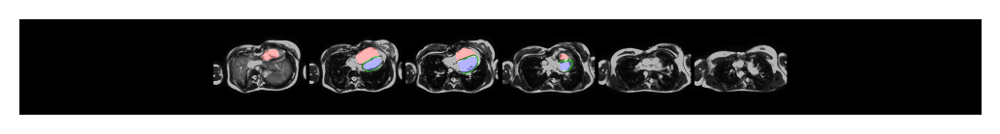

2020-12-01 15:49:01,332 INFO GT on AX


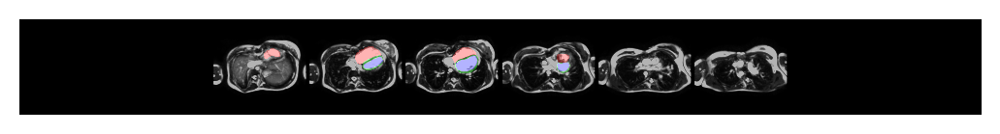

2020-12-01 15:49:02,150 INFO inv mask shape: (24, 256, 256, 4), gt mask shape: (24, 256, 256, 4)
2020-12-01 15:49:02,160 INFO DICE LV: 0.9033759832382202
2020-12-01 15:49:02,170 INFO DICE RV: 0.868172824382782
2020-12-01 15:49:02,183 INFO DICE MYO: 0.5963770151138306
2020-12-01 15:49:02,244 INFO m: [[ 0.4883  -0.871    0.04248 -0.9907 ]
 [ 0.3594   0.2455   0.9     -0.9834 ]
 [-0.795   -0.4243   0.433   10.17   ]]
2020-12-01 15:49:02,244 INFO m_mod: [[ 0.4883  -0.871    0.04248 -0.2686 ]
 [ 0.3594   0.2455   0.9      0.7183 ]
 [-0.795   -0.4243   0.433    0.912  ]]
2020-12-01 15:49:02,245 INFO m_scaled: [[ 0.4883  -0.871    0.04248 -0.537  ]
 [ 0.3594   0.2455   0.9      1.437  ]
 [-0.795   -0.4243   0.433    1.824  ]]
2020-12-01 15:49:02,246 INFO 0000-0HQQW4ZN_2007-05-23_ES_msk.nrrd
2020-12-01 15:49:02,246 INFO Prediction on AX volume:


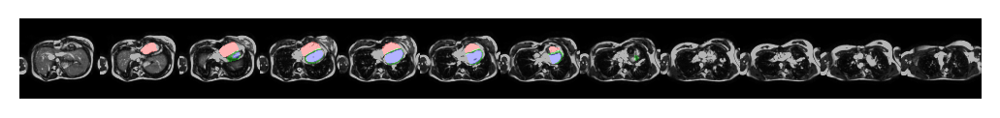

2020-12-01 15:49:03,022 INFO AX --> SAX rotated by the model
2020-12-01 15:49:03,022 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:49:03,044 INFO Target (AX2SAX):
2020-12-01 15:49:03,044 INFO Repeat the transformation on the full resolution
2020-12-01 15:49:05,687 INFO Predicted mask
2020-12-01 15:49:08,360 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:49:08,484 INFO DICE LV: 0.832313597202301
2020-12-01 15:49:08,568 INFO DICE RV: 0.822819709777832
2020-12-01 15:49:08,651 INFO DICE MYO: 0.6869463920593262
2020-12-01 15:49:08,656 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:49:08,662 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:49:09,158 INFO Predicted mask rotated to AX on original AX image


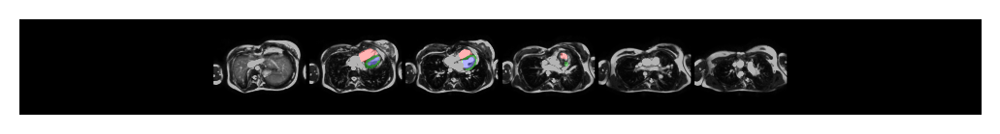

2020-12-01 15:49:09,558 INFO GT on AX


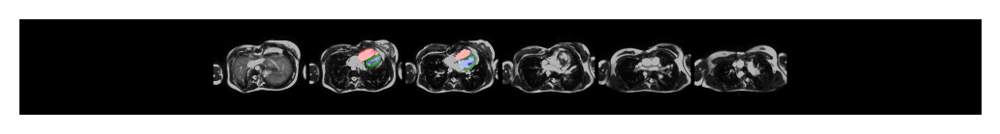

2020-12-01 15:49:10,364 INFO inv mask shape: (24, 256, 256, 4), gt mask shape: (24, 256, 256, 4)
2020-12-01 15:49:10,372 INFO DICE LV: 0.8434560298919678
2020-12-01 15:49:10,382 INFO DICE RV: 0.8215566873550415
2020-12-01 15:49:10,391 INFO DICE MYO: 0.6825471520423889
2020-12-01 15:49:10,453 INFO m: [[ 0.4915  -0.869    0.05212 -0.99   ]
 [ 0.359    0.2563   0.8975  -0.9824 ]
 [-0.794   -0.422    0.438   10.07   ]]
2020-12-01 15:49:10,453 INFO m_mod: [[ 0.4915  -0.869    0.05212 -0.266  ]
 [ 0.359    0.2563   0.8975   0.711  ]
 [-0.794   -0.422    0.438    0.903  ]]
2020-12-01 15:49:10,454 INFO m_scaled: [[ 0.4915  -0.869    0.05212 -0.532  ]
 [ 0.359    0.2563   0.8975   1.422  ]
 [-0.794   -0.422    0.438    1.806  ]]
2020-12-01 15:49:10,455 INFO 0000-13JLP3HN_2007-05-22_ED_msk.nrrd
2020-12-01 15:49:10,455 INFO Prediction on AX volume:


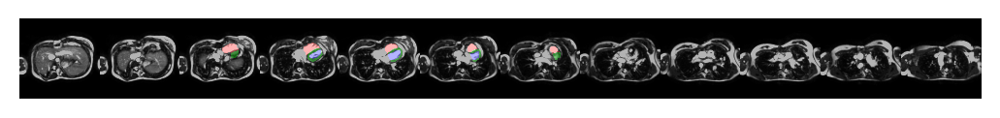

2020-12-01 15:49:11,231 INFO AX --> SAX rotated by the model
2020-12-01 15:49:11,232 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:49:11,253 INFO Target (AX2SAX):
2020-12-01 15:49:11,253 INFO Repeat the transformation on the full resolution
2020-12-01 15:49:13,741 INFO Predicted mask
2020-12-01 15:49:15,321 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:49:15,443 INFO DICE LV: 0.9294635057449341
2020-12-01 15:49:15,527 INFO DICE RV: 0.8529939651489258
2020-12-01 15:49:15,610 INFO DICE MYO: 0.7444136142730713
2020-12-01 15:49:15,615 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:49:15,620 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:49:16,123 INFO Predicted mask rotated to AX on original AX image


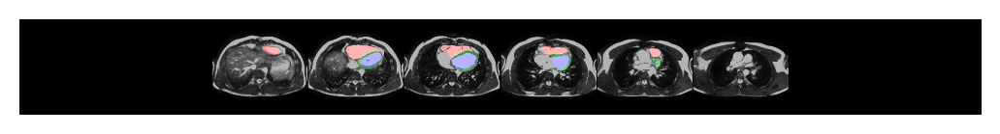

2020-12-01 15:49:16,534 INFO GT on AX


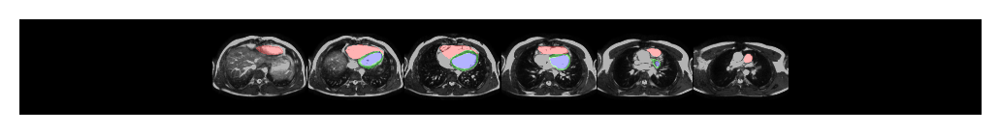

2020-12-01 15:49:17,808 INFO inv mask shape: (22, 352, 352, 4), gt mask shape: (22, 352, 352, 4)
2020-12-01 15:49:17,818 INFO DICE LV: 0.9290207028388977
2020-12-01 15:49:17,830 INFO DICE RV: 0.8610656261444092
2020-12-01 15:49:17,841 INFO DICE MYO: 0.7333786487579346
2020-12-01 15:49:17,903 INFO m: [[ 0.484   -0.8745   0.02693 -0.991  ]
 [ 0.3613   0.2281   0.9043  -0.9844 ]
 [-0.797   -0.428    0.4265  10.35   ]]
2020-12-01 15:49:17,903 INFO m_mod: [[ 0.484   -0.8745   0.02693 -0.2725 ]
 [ 0.3613   0.2281   0.9043   0.7305 ]
 [-0.797   -0.428    0.4265   0.9277 ]]
2020-12-01 15:49:17,904 INFO m_scaled: [[ 0.484   -0.8745   0.02693 -0.545  ]
 [ 0.3613   0.2281   0.9043   1.461  ]
 [-0.797   -0.428    0.4265   1.855  ]]
2020-12-01 15:49:17,907 INFO 0000-13JLP3HN_2007-05-22_ES_msk.nrrd
2020-12-01 15:49:17,907 INFO Prediction on AX volume:


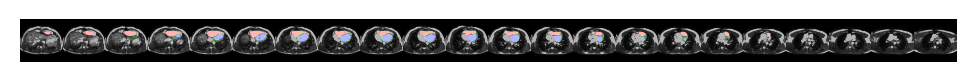

2020-12-01 15:49:18,895 INFO AX --> SAX rotated by the model
2020-12-01 15:49:18,896 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:49:18,916 INFO Target (AX2SAX):
2020-12-01 15:49:18,916 INFO Repeat the transformation on the full resolution
2020-12-01 15:49:21,382 INFO Predicted mask
2020-12-01 15:49:22,962 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:49:23,078 INFO DICE LV: 0.8676331639289856
2020-12-01 15:49:23,163 INFO DICE RV: 0.7092676758766174
2020-12-01 15:49:23,250 INFO DICE MYO: 0.7437813878059387
2020-12-01 15:49:23,257 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:49:23,262 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:49:23,773 INFO Predicted mask rotated to AX on original AX image


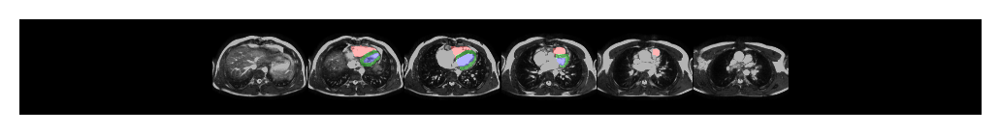

2020-12-01 15:49:24,165 INFO GT on AX


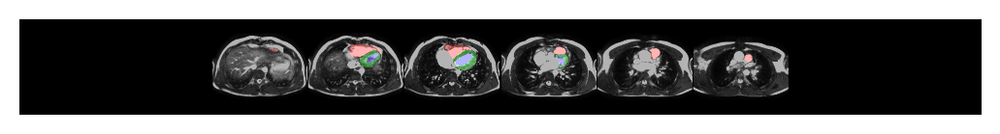

2020-12-01 15:49:25,385 INFO inv mask shape: (22, 352, 352, 4), gt mask shape: (22, 352, 352, 4)
2020-12-01 15:49:25,398 INFO DICE LV: 0.8660866022109985
2020-12-01 15:49:25,411 INFO DICE RV: 0.7071220278739929
2020-12-01 15:49:25,422 INFO DICE MYO: 0.7477811574935913
2020-12-01 15:49:25,478 INFO m: [[ 0.4844  -0.874    0.02785 -0.991  ]
 [ 0.361    0.229    0.904   -0.9844 ]
 [-0.797   -0.4277   0.4265  10.34   ]]
2020-12-01 15:49:25,478 INFO m_mod: [[ 0.4844  -0.874    0.02785 -0.272  ]
 [ 0.361    0.229    0.904    0.7305 ]
 [-0.797   -0.4277   0.4265   0.9272 ]]
2020-12-01 15:49:25,479 INFO m_scaled: [[ 0.4844  -0.874    0.02785 -0.544  ]
 [ 0.361    0.229    0.904    1.461  ]
 [-0.797   -0.4277   0.4265   1.8545 ]]
2020-12-01 15:49:25,481 INFO 0000-24YLF77L_2007-11-19_ED_msk.nrrd
2020-12-01 15:49:25,482 INFO Prediction on AX volume:


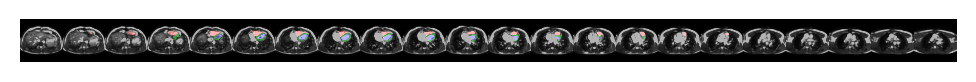

2020-12-01 15:49:26,422 INFO AX --> SAX rotated by the model
2020-12-01 15:49:26,423 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:49:26,470 INFO Target (AX2SAX):
2020-12-01 15:49:26,470 INFO Repeat the transformation on the full resolution
2020-12-01 15:49:28,945 INFO Predicted mask
2020-12-01 15:49:30,499 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:49:30,623 INFO DICE LV: 0.9004640579223633
2020-12-01 15:49:30,702 INFO DICE RV: 0.8550308346748352
2020-12-01 15:49:30,789 INFO DICE MYO: 0.6748871803283691
2020-12-01 15:49:30,794 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:49:30,799 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:49:31,301 INFO Predicted mask rotated to AX on original AX image


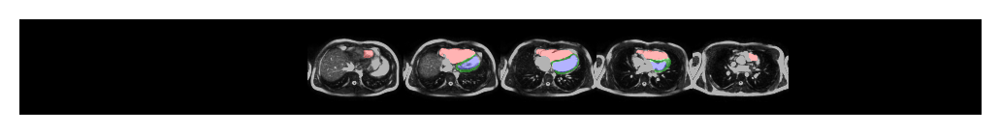

2020-12-01 15:49:31,690 INFO GT on AX


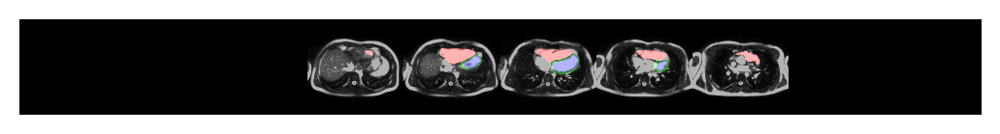

2020-12-01 15:49:32,683 INFO inv mask shape: (19, 256, 256, 4), gt mask shape: (19, 256, 256, 4)
2020-12-01 15:49:32,690 INFO DICE LV: 0.9018809795379639
2020-12-01 15:49:32,696 INFO DICE RV: 0.8720349669456482
2020-12-01 15:49:32,702 INFO DICE MYO: 0.676315188407898
2020-12-01 15:49:32,757 INFO m: [[ 0.4802 -0.877   0.0122 -0.9917]
 [ 0.3625  0.2112  0.908  -0.9854]
 [-0.799  -0.4314  0.4192 10.49  ]]
2020-12-01 15:49:32,758 INFO m_mod: [[ 0.4802 -0.877   0.0122 -0.2754]
 [ 0.3625  0.2112  0.908   0.7407]
 [-0.799  -0.4314  0.4192  0.9404]]
2020-12-01 15:49:32,758 INFO m_scaled: [[ 0.4802 -0.877   0.0122 -0.551 ]
 [ 0.3625  0.2112  0.908   1.481 ]
 [-0.799  -0.4314  0.4192  1.881 ]]
2020-12-01 15:49:32,759 INFO 0000-24YLF77L_2007-11-19_ES_msk.nrrd
2020-12-01 15:49:32,760 INFO Prediction on AX volume:


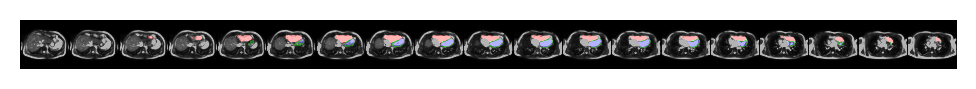

2020-12-01 15:49:33,578 INFO AX --> SAX rotated by the model
2020-12-01 15:49:33,579 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:49:33,601 INFO Target (AX2SAX):
2020-12-01 15:49:33,602 INFO Repeat the transformation on the full resolution
2020-12-01 15:49:36,051 INFO Predicted mask
2020-12-01 15:49:37,620 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:49:37,738 INFO DICE LV: 0.8438861966133118
2020-12-01 15:49:37,823 INFO DICE RV: 0.8259416222572327
2020-12-01 15:49:37,902 INFO DICE MYO: 0.7365009188652039
2020-12-01 15:49:37,907 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:49:37,912 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:49:38,397 INFO Predicted mask rotated to AX on original AX image


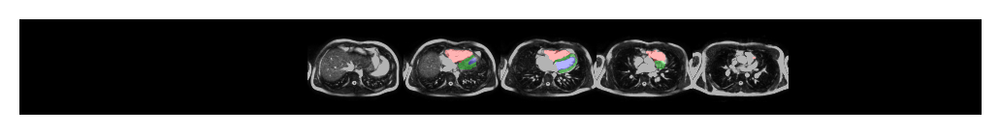

2020-12-01 15:49:38,796 INFO GT on AX


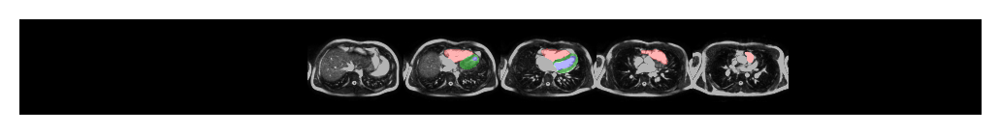

2020-12-01 15:49:39,837 INFO inv mask shape: (19, 256, 256, 4), gt mask shape: (19, 256, 256, 4)
2020-12-01 15:49:39,844 INFO DICE LV: 0.8532305955886841
2020-12-01 15:49:39,850 INFO DICE RV: 0.8310333490371704
2020-12-01 15:49:39,857 INFO DICE MYO: 0.7245851159095764
2020-12-01 15:49:39,914 INFO m: [[ 4.7827e-01 -8.7842e-01  4.0359e-03 -9.9219e-01]
 [ 3.6304e-01  2.0178e-01  9.0967e-01 -9.8584e-01]
 [-7.9980e-01 -4.3384e-01  4.1553e-01  1.0586e+01]]
2020-12-01 15:49:39,914 INFO m_mod: [[ 0.4783   -0.8784    0.004036 -0.2778  ]
 [ 0.363     0.2018    0.9097    0.7476  ]
 [-0.8      -0.4338    0.4155    0.9487  ]]
2020-12-01 15:49:39,915 INFO m_scaled: [[ 0.4783   -0.8784    0.004036 -0.5557  ]
 [ 0.363     0.2018    0.9097    1.495   ]
 [-0.8      -0.4338    0.4155    1.897   ]]
2020-12-01 15:49:39,916 INFO 0000-2CVUG1C5_2006-09-06_ED_msk.nrrd
2020-12-01 15:49:39,916 INFO Prediction on AX volume:


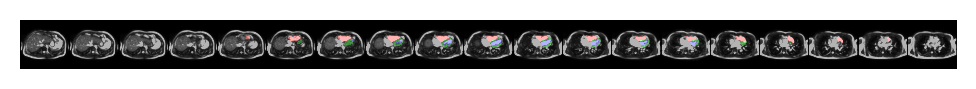

2020-12-01 15:49:40,783 INFO AX --> SAX rotated by the model
2020-12-01 15:49:40,785 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:49:40,829 INFO Target (AX2SAX):
2020-12-01 15:49:40,829 INFO Repeat the transformation on the full resolution
2020-12-01 15:49:43,295 INFO Predicted mask
2020-12-01 15:49:44,871 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:49:44,989 INFO DICE LV: 0.40470749139785767
2020-12-01 15:49:45,075 INFO DICE RV: 0.3388485014438629
2020-12-01 15:49:45,155 INFO DICE MYO: 0.30067846179008484
2020-12-01 15:49:45,160 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:49:45,166 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:49:45,662 INFO Predicted mask rotated to AX on original AX image


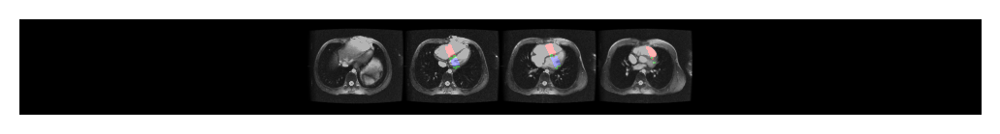

2020-12-01 15:49:46,062 INFO GT on AX


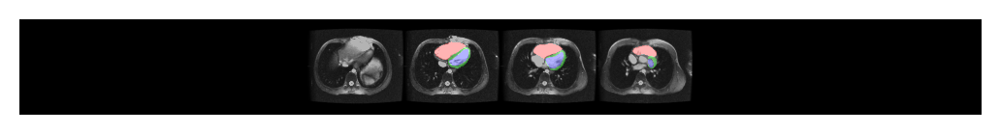

2020-12-01 15:49:47,063 INFO inv mask shape: (14, 512, 512, 4), gt mask shape: (14, 512, 512, 4)
2020-12-01 15:49:47,079 INFO DICE LV: 0.4218856692314148
2020-12-01 15:49:47,097 INFO DICE RV: 0.3971346914768219
2020-12-01 15:49:47,113 INFO DICE MYO: 0.30335235595703125
2020-12-01 15:49:47,170 INFO m: [[ 0.498  -0.864   0.0756 -0.989 ]
 [ 0.3564  0.2832  0.8906 -0.9805]
 [-0.7905 -0.4165  0.4487  9.805 ]]
2020-12-01 15:49:47,170 INFO m_mod: [[ 0.498  -0.864   0.0756 -0.2598]
 [ 0.3564  0.2832  0.8906  0.6924]
 [-0.7905 -0.4165  0.4487  0.879 ]]
2020-12-01 15:49:47,171 INFO m_scaled: [[ 0.498  -0.864   0.0756 -0.5195]
 [ 0.3564  0.2832  0.8906  1.385 ]
 [-0.7905 -0.4165  0.4487  1.758 ]]
2020-12-01 15:49:47,175 INFO 0000-2CVUG1C5_2006-09-06_ES_msk.nrrd
2020-12-01 15:49:47,175 INFO Prediction on AX volume:


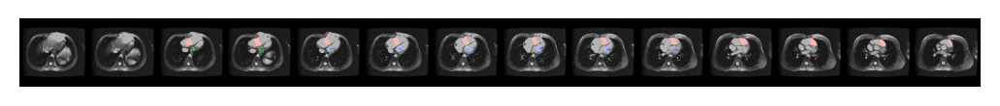

2020-12-01 15:49:48,145 INFO AX --> SAX rotated by the model
2020-12-01 15:49:48,147 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:49:48,207 INFO Target (AX2SAX):
2020-12-01 15:49:48,208 INFO Repeat the transformation on the full resolution
2020-12-01 15:49:50,649 INFO Predicted mask
2020-12-01 15:49:52,180 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:49:52,303 INFO DICE LV: 0.06110173091292381
2020-12-01 15:49:52,389 INFO DICE RV: 0.01193317398428917
2020-12-01 15:49:52,468 INFO DICE MYO: 0.034119829535484314
2020-12-01 15:49:52,474 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:49:52,479 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:49:52,588 INFO Predicted mask rotated to AX on original AX image


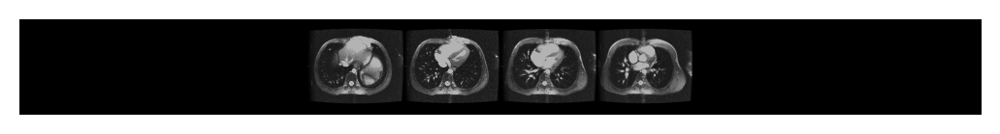

2020-12-01 15:49:52,980 INFO GT on AX


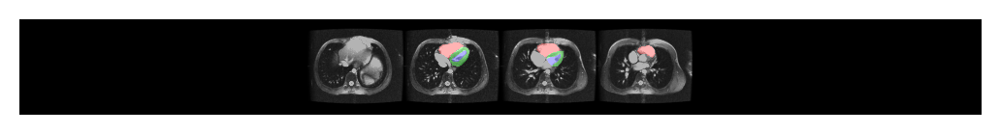

2020-12-01 15:49:53,966 INFO inv mask shape: (14, 512, 512, 4), gt mask shape: (14, 512, 512, 4)
2020-12-01 15:49:53,983 INFO DICE LV: 9.551098628435284e-05
2020-12-01 15:49:53,998 INFO DICE RV: 1.83546853804728e-05
2020-12-01 15:49:54,013 INFO DICE MYO: 3.8884783862158656e-05
2020-12-01 15:49:54,068 INFO m: [[ 0.4968 -0.8647  0.0702 -0.9893]
 [ 0.357   0.2773  0.892  -0.981 ]
 [-0.791  -0.4182  0.4465  9.86  ]]
2020-12-01 15:49:54,068 INFO m_mod: [[ 0.4968 -0.8647  0.0702 -0.2612]
 [ 0.357   0.2773  0.892   0.6963]
 [-0.791  -0.4182  0.4465  0.884 ]]
2020-12-01 15:49:54,069 INFO m_scaled: [[ 0.4968 -0.8647  0.0702 -0.5225]
 [ 0.357   0.2773  0.892   1.393 ]
 [-0.791  -0.4182  0.4465  1.768 ]]
2020-12-01 15:49:54,072 INFO 0000-2CW0G1A5_2006-04-06_ED_msk.nrrd
2020-12-01 15:49:54,072 INFO Prediction on AX volume:


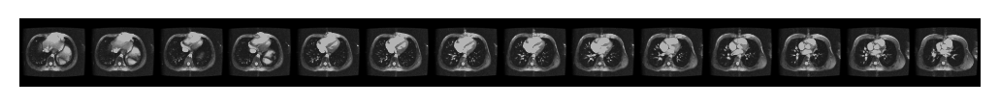

2020-12-01 15:49:55,056 INFO AX --> SAX rotated by the model
2020-12-01 15:49:55,057 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:49:55,082 INFO Target (AX2SAX):
2020-12-01 15:49:55,082 INFO Repeat the transformation on the full resolution
2020-12-01 15:49:57,534 INFO Predicted mask
2020-12-01 15:49:59,091 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:49:59,208 INFO DICE LV: 0.8773369193077087
2020-12-01 15:49:59,288 INFO DICE RV: 0.8574383854866028
2020-12-01 15:49:59,367 INFO DICE MYO: 0.6455010175704956
2020-12-01 15:49:59,373 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:49:59,378 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:49:59,869 INFO Predicted mask rotated to AX on original AX image


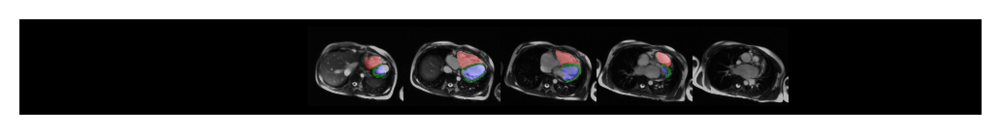

2020-12-01 15:50:00,272 INFO GT on AX


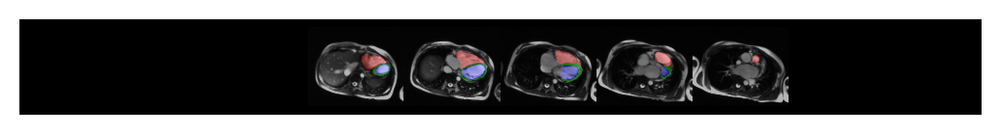

2020-12-01 15:50:01,230 INFO inv mask shape: (18, 156, 192, 4), gt mask shape: (18, 156, 192, 4)
2020-12-01 15:50:01,235 INFO DICE LV: 0.8857460618019104
2020-12-01 15:50:01,238 INFO DICE RV: 0.8547519445419312
2020-12-01 15:50:01,242 INFO DICE MYO: 0.6393190622329712
2020-12-01 15:50:01,300 INFO m: [[ 0.483   -0.8755   0.02333 -0.9917 ]
 [ 0.3613   0.2231   0.9053  -0.985  ]
 [-0.798   -0.4287   0.424   10.39   ]]
2020-12-01 15:50:01,300 INFO m_mod: [[ 0.483   -0.8755   0.02333 -0.273  ]
 [ 0.3613   0.2231   0.9053   0.7334 ]
 [-0.798   -0.4287   0.424    0.931  ]]
2020-12-01 15:50:01,301 INFO m_scaled: [[ 0.483   -0.8755   0.02333 -0.546  ]
 [ 0.3613   0.2231   0.9053   1.467  ]
 [-0.798   -0.4287   0.424    1.862  ]]
2020-12-01 15:50:01,302 INFO 0000-2CW0G1A5_2006-04-06_ES_msk.nrrd
2020-12-01 15:50:01,302 INFO Prediction on AX volume:


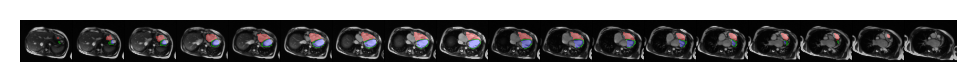

2020-12-01 15:50:02,114 INFO AX --> SAX rotated by the model
2020-12-01 15:50:02,116 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:50:02,161 INFO Target (AX2SAX):
2020-12-01 15:50:02,162 INFO Repeat the transformation on the full resolution
2020-12-01 15:50:04,609 INFO Predicted mask
2020-12-01 15:50:07,165 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:50:07,291 INFO DICE LV: 0.8442214131355286
2020-12-01 15:50:07,376 INFO DICE RV: 0.8081551790237427
2020-12-01 15:50:07,456 INFO DICE MYO: 0.7120308876037598
2020-12-01 15:50:07,461 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:50:07,466 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:50:07,952 INFO Predicted mask rotated to AX on original AX image


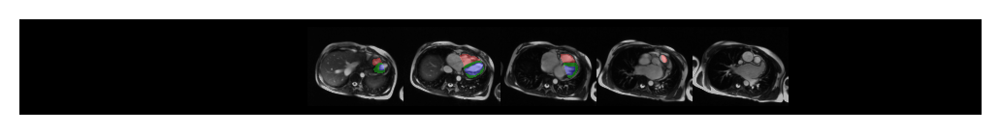

2020-12-01 15:50:08,347 INFO GT on AX


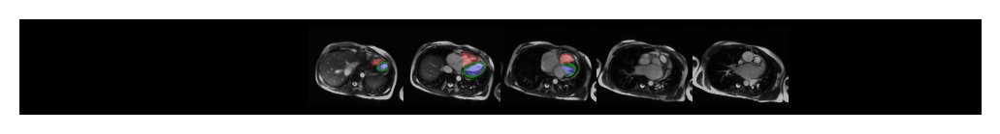

2020-12-01 15:50:09,257 INFO inv mask shape: (18, 156, 192, 4), gt mask shape: (18, 156, 192, 4)
2020-12-01 15:50:09,266 INFO DICE LV: 0.8395107984542847
2020-12-01 15:50:09,271 INFO DICE RV: 0.8125306367874146
2020-12-01 15:50:09,274 INFO DICE MYO: 0.6967180967330933
2020-12-01 15:50:09,329 INFO m: [[ 0.4836 -0.8755  0.0256 -0.991 ]
 [ 0.3613  0.2262  0.905  -0.9844]
 [-0.7974 -0.4282  0.4255 10.36  ]]
2020-12-01 15:50:09,330 INFO m_mod: [[ 0.4836 -0.8755  0.0256 -0.2725]
 [ 0.3613  0.2262  0.905   0.7314]
 [-0.7974 -0.4282  0.4255  0.9287]]
2020-12-01 15:50:09,331 INFO m_scaled: [[ 0.4836 -0.8755  0.0256 -0.545 ]
 [ 0.3613  0.2262  0.905   1.463 ]
 [-0.7974 -0.4282  0.4255  1.857 ]]
2020-12-01 15:50:09,332 INFO 0000-2XRR719Z_2005-05-02_ED_msk.nrrd
2020-12-01 15:50:09,332 INFO Prediction on AX volume:


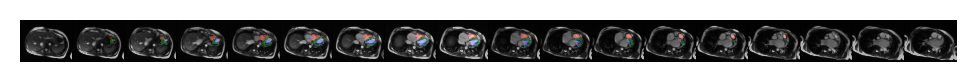

2020-12-01 15:50:10,105 INFO AX --> SAX rotated by the model
2020-12-01 15:50:10,105 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:50:10,134 INFO Target (AX2SAX):
2020-12-01 15:50:10,134 INFO Repeat the transformation on the full resolution
2020-12-01 15:50:12,587 INFO Predicted mask
2020-12-01 15:50:15,134 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:50:15,250 INFO DICE LV: 0.9119729995727539
2020-12-01 15:50:15,328 INFO DICE RV: 0.8618146777153015
2020-12-01 15:50:15,406 INFO DICE MYO: 0.645875871181488
2020-12-01 15:50:15,412 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:50:15,417 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:50:15,901 INFO Predicted mask rotated to AX on original AX image


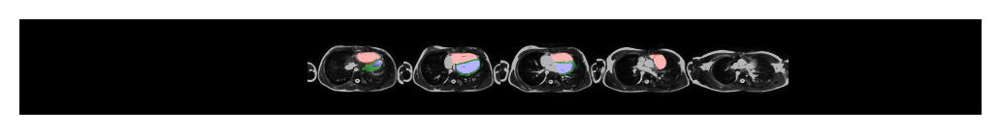

2020-12-01 15:50:16,287 INFO GT on AX


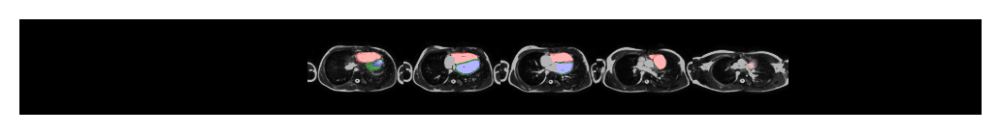

2020-12-01 15:50:17,253 INFO inv mask shape: (18, 256, 256, 4), gt mask shape: (18, 256, 256, 4)
2020-12-01 15:50:17,259 INFO DICE LV: 0.930507481098175
2020-12-01 15:50:17,264 INFO DICE RV: 0.8603472113609314
2020-12-01 15:50:17,270 INFO DICE MYO: 0.6624602675437927
2020-12-01 15:50:17,328 INFO m: [[ 0.4836  -0.875    0.02425 -0.991  ]
 [ 0.3613   0.2247   0.9053  -0.9844 ]
 [-0.7974  -0.4287   0.4246  10.37   ]]
2020-12-01 15:50:17,329 INFO m_mod: [[ 0.4836  -0.875    0.02425 -0.2725 ]
 [ 0.3613   0.2247   0.9053   0.732  ]
 [-0.7974  -0.4287   0.4246   0.929  ]]
2020-12-01 15:50:17,329 INFO m_scaled: [[ 0.4836  -0.875    0.02425 -0.545  ]
 [ 0.3613   0.2247   0.9053   1.464  ]
 [-0.7974  -0.4287   0.4246   1.858  ]]
2020-12-01 15:50:17,330 INFO 0000-2XRR719Z_2005-05-02_ES_msk.nrrd
2020-12-01 15:50:17,330 INFO Prediction on AX volume:


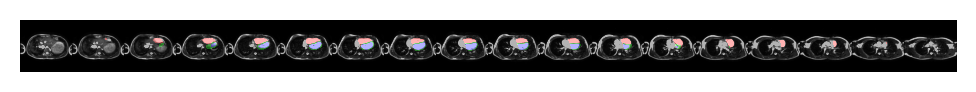

2020-12-01 15:50:18,138 INFO AX --> SAX rotated by the model
2020-12-01 15:50:18,139 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:50:18,158 INFO Target (AX2SAX):
2020-12-01 15:50:18,159 INFO Repeat the transformation on the full resolution
2020-12-01 15:50:20,581 INFO Predicted mask
2020-12-01 15:50:22,108 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:50:22,225 INFO DICE LV: 0.8465465307235718
2020-12-01 15:50:22,304 INFO DICE RV: 0.7819573879241943
2020-12-01 15:50:22,383 INFO DICE MYO: 0.7089832425117493
2020-12-01 15:50:22,388 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:50:22,393 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:50:22,875 INFO Predicted mask rotated to AX on original AX image


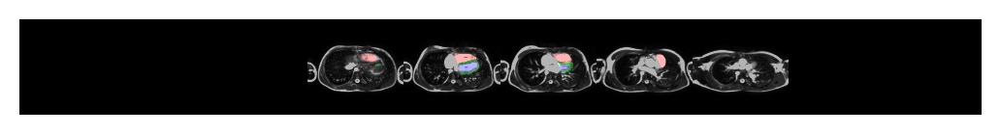

2020-12-01 15:50:23,264 INFO GT on AX


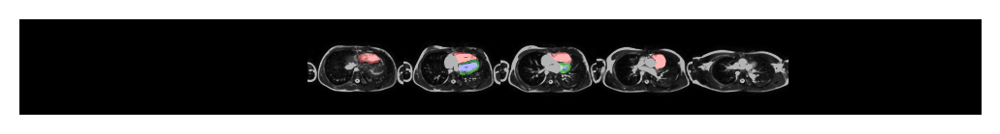

2020-12-01 15:50:24,227 INFO inv mask shape: (18, 256, 256, 4), gt mask shape: (18, 256, 256, 4)
2020-12-01 15:50:24,234 INFO DICE LV: 0.8706091046333313
2020-12-01 15:50:24,240 INFO DICE RV: 0.7753302454948425
2020-12-01 15:50:24,245 INFO DICE MYO: 0.7448082566261292
2020-12-01 15:50:24,302 INFO m: [[ 0.4849  -0.8745   0.02988 -0.991  ]
 [ 0.3606   0.2307   0.904   -0.9844 ]
 [-0.797   -0.4277   0.4275  10.31   ]]
2020-12-01 15:50:24,302 INFO m_mod: [[ 0.4849  -0.8745   0.02988 -0.2715 ]
 [ 0.3606   0.2307   0.904    0.728  ]
 [-0.797   -0.4277   0.4275   0.9243 ]]
2020-12-01 15:50:24,303 INFO m_scaled: [[ 0.4849  -0.8745   0.02988 -0.543  ]
 [ 0.3606   0.2307   0.904    1.456  ]
 [-0.797   -0.4277   0.4275   1.849  ]]
2020-12-01 15:50:24,304 INFO 0000-3EX293QC_2006-06-19_ED_msk.nrrd
2020-12-01 15:50:24,304 INFO Prediction on AX volume:


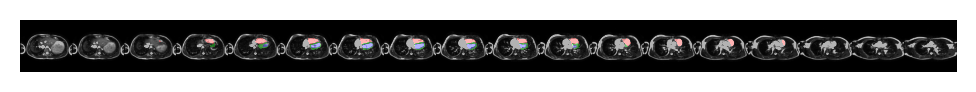

2020-12-01 15:50:25,126 INFO AX --> SAX rotated by the model
2020-12-01 15:50:25,128 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:50:25,176 INFO Target (AX2SAX):
2020-12-01 15:50:25,176 INFO Repeat the transformation on the full resolution
2020-12-01 15:50:27,610 INFO Predicted mask
2020-12-01 15:50:29,143 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:50:29,260 INFO DICE LV: 0.9259803891181946
2020-12-01 15:50:29,347 INFO DICE RV: 0.8912949562072754
2020-12-01 15:50:29,433 INFO DICE MYO: 0.7395066618919373
2020-12-01 15:50:29,440 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:50:29,445 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:50:29,945 INFO Predicted mask rotated to AX on original AX image


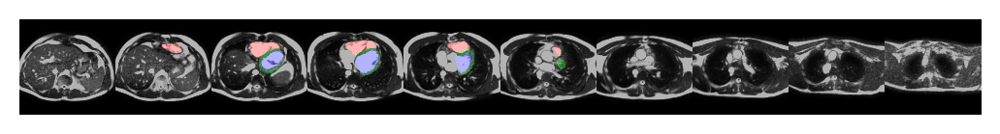

2020-12-01 15:50:30,346 INFO GT on AX


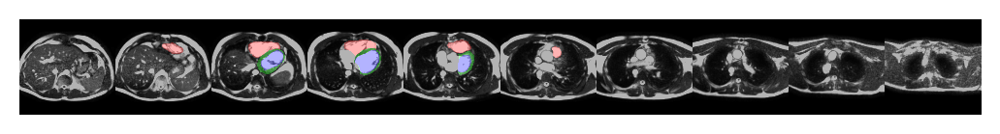

2020-12-01 15:50:31,330 INFO inv mask shape: (38, 256, 256, 4), gt mask shape: (38, 256, 256, 4)
2020-12-01 15:50:31,349 INFO DICE LV: 0.931418240070343
2020-12-01 15:50:31,364 INFO DICE RV: 0.8928794264793396
2020-12-01 15:50:31,376 INFO DICE MYO: 0.7410006523132324
2020-12-01 15:50:31,433 INFO m: [[ 0.47    -0.882   -0.02684 -0.9937 ]
 [ 0.3657   0.1669   0.9155  -0.988  ]
 [-0.803   -0.4404   0.4011  10.94   ]]
2020-12-01 15:50:31,433 INFO m_mod: [[ 0.47    -0.882   -0.02684 -0.2852 ]
 [ 0.3657   0.1669   0.9155   0.772  ]
 [-0.803   -0.4404   0.4011   0.9805 ]]
2020-12-01 15:50:31,434 INFO m_scaled: [[ 0.47    -0.882   -0.02684 -0.5703 ]
 [ 0.3657   0.1669   0.9155   1.544  ]
 [-0.803   -0.4404   0.4011   1.961  ]]
2020-12-01 15:50:31,435 INFO 0000-3EX293QC_2006-06-19_ES_msk.nrrd
2020-12-01 15:50:31,435 INFO Prediction on AX volume:


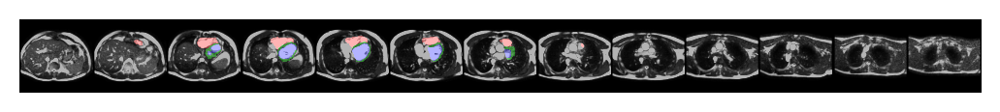

2020-12-01 15:50:32,204 INFO AX --> SAX rotated by the model
2020-12-01 15:50:32,204 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:50:32,224 INFO Target (AX2SAX):
2020-12-01 15:50:32,225 INFO Repeat the transformation on the full resolution
2020-12-01 15:50:35,688 INFO Predicted mask
2020-12-01 15:50:37,219 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:50:37,337 INFO DICE LV: 0.8673892617225647
2020-12-01 15:50:37,417 INFO DICE RV: 0.801196277141571
2020-12-01 15:50:37,496 INFO DICE MYO: 0.6752223968505859
2020-12-01 15:50:37,502 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:50:37,509 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:50:38,005 INFO Predicted mask rotated to AX on original AX image


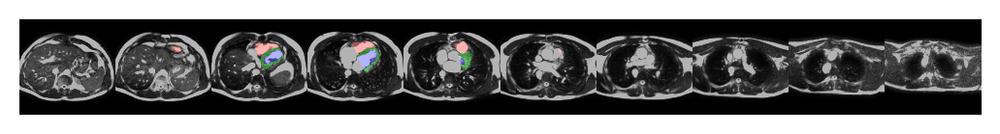

2020-12-01 15:50:38,416 INFO GT on AX


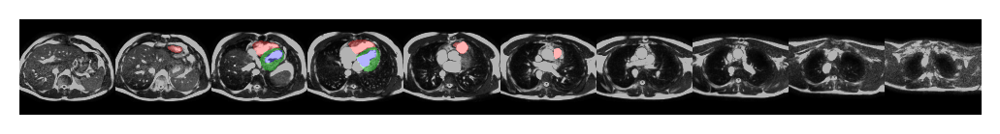

2020-12-01 15:50:39,397 INFO inv mask shape: (38, 256, 256, 4), gt mask shape: (38, 256, 256, 4)
2020-12-01 15:50:39,407 INFO DICE LV: 0.8704400658607483
2020-12-01 15:50:39,416 INFO DICE RV: 0.7986460328102112
2020-12-01 15:50:39,426 INFO DICE MYO: 0.6972886323928833
2020-12-01 15:50:39,483 INFO m: [[ 0.4688  -0.883   -0.03186 -0.9937 ]
 [ 0.3662   0.1616   0.9165  -0.988  ]
 [-0.8037  -0.4412   0.399   10.98   ]]
2020-12-01 15:50:39,484 INFO m_mod: [[ 0.4688  -0.883   -0.03186 -0.2861 ]
 [ 0.3662   0.1616   0.9165   0.775  ]
 [-0.8037  -0.4412   0.399    0.9844 ]]
2020-12-01 15:50:39,484 INFO m_scaled: [[ 0.4688  -0.883   -0.03186 -0.5723 ]
 [ 0.3662   0.1616   0.9165   1.55   ]
 [-0.8037  -0.4412   0.399    1.969  ]]
2020-12-01 15:50:39,485 INFO 0000-5RMHZGWP_2006-08-03_ED_msk.nrrd
2020-12-01 15:50:39,486 INFO Prediction on AX volume:


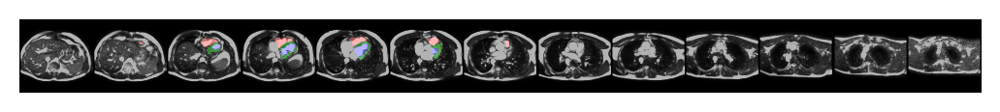

2020-12-01 15:50:40,269 INFO AX --> SAX rotated by the model
2020-12-01 15:50:40,271 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:50:40,328 INFO Target (AX2SAX):
2020-12-01 15:50:40,329 INFO Repeat the transformation on the full resolution
2020-12-01 15:50:42,786 INFO Predicted mask
2020-12-01 15:50:44,313 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:50:44,438 INFO DICE LV: 0.890674889087677
2020-12-01 15:50:44,525 INFO DICE RV: 0.7000422477722168
2020-12-01 15:50:44,611 INFO DICE MYO: 0.6252087354660034
2020-12-01 15:50:44,618 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:50:44,624 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:50:45,124 INFO Predicted mask rotated to AX on original AX image


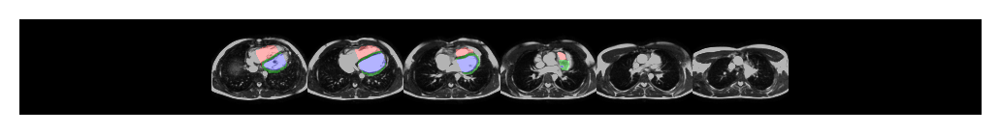

2020-12-01 15:50:45,531 INFO GT on AX


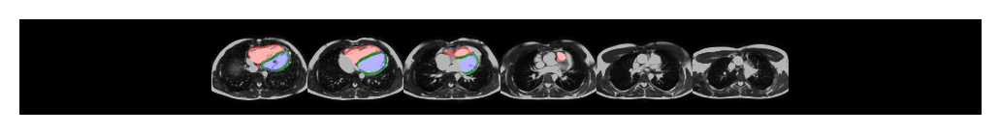

2020-12-01 15:50:46,411 INFO inv mask shape: (24, 256, 256, 4), gt mask shape: (24, 256, 256, 4)
2020-12-01 15:50:46,419 INFO DICE LV: 0.8967255353927612
2020-12-01 15:50:46,427 INFO DICE RV: 0.6798681020736694
2020-12-01 15:50:46,435 INFO DICE MYO: 0.6414350867271423
2020-12-01 15:50:46,491 INFO m: [[ 0.4907 -0.87    0.0502 -0.99  ]
 [ 0.3591  0.2546  0.898  -0.983 ]
 [-0.794  -0.4224  0.4373 10.09  ]]
2020-12-01 15:50:46,491 INFO m_mod: [[ 0.4907 -0.87    0.0502 -0.2666]
 [ 0.3591  0.2546  0.898   0.7124]
 [-0.794  -0.4224  0.4373  0.905 ]]
2020-12-01 15:50:46,492 INFO m_scaled: [[ 0.4907 -0.87    0.0502 -0.533 ]
 [ 0.3591  0.2546  0.898   1.425 ]
 [-0.794  -0.4224  0.4373  1.81  ]]
2020-12-01 15:50:46,493 INFO 0000-5RMHZGWP_2006-08-03_ES_msk.nrrd
2020-12-01 15:50:46,494 INFO Prediction on AX volume:


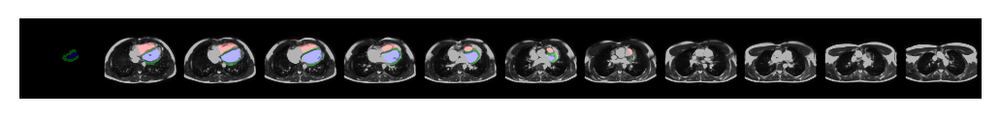

2020-12-01 15:50:47,268 INFO AX --> SAX rotated by the model
2020-12-01 15:50:47,269 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:50:47,289 INFO Target (AX2SAX):
2020-12-01 15:50:47,289 INFO Repeat the transformation on the full resolution
2020-12-01 15:50:49,757 INFO Predicted mask
2020-12-01 15:50:51,361 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:50:51,486 INFO DICE LV: 0.8295271992683411
2020-12-01 15:50:51,566 INFO DICE RV: 0.6461454629898071
2020-12-01 15:50:51,651 INFO DICE MYO: 0.6420244574546814
2020-12-01 15:50:51,657 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:50:51,664 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:50:52,171 INFO Predicted mask rotated to AX on original AX image


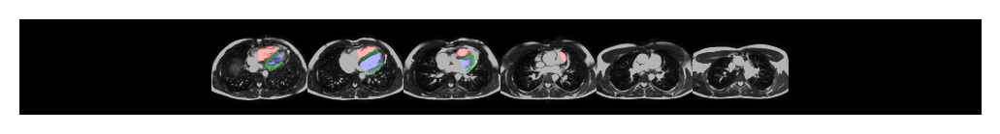

2020-12-01 15:50:52,576 INFO GT on AX


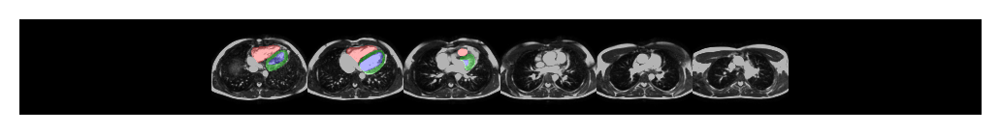

2020-12-01 15:50:53,426 INFO inv mask shape: (24, 256, 256, 4), gt mask shape: (24, 256, 256, 4)
2020-12-01 15:50:53,436 INFO DICE LV: 0.8266029357910156
2020-12-01 15:50:53,445 INFO DICE RV: 0.6524025201797485
2020-12-01 15:50:53,452 INFO DICE MYO: 0.6299378275871277
2020-12-01 15:50:53,510 INFO m: [[ 0.4917  -0.8687   0.05582 -0.99   ]
 [ 0.3582   0.2605   0.8965  -0.9824 ]
 [-0.7935  -0.421    0.4395  10.04   ]]
2020-12-01 15:50:53,511 INFO m_mod: [[ 0.4917  -0.8687   0.05582 -0.2651 ]
 [ 0.3582   0.2605   0.8965   0.709  ]
 [-0.7935  -0.421    0.4395   0.9    ]]
2020-12-01 15:50:53,511 INFO m_scaled: [[ 0.4917  -0.8687   0.05582 -0.5303 ]
 [ 0.3582   0.2605   0.8965   1.418  ]
 [-0.7935  -0.421    0.4395   1.8    ]]
2020-12-01 15:50:53,514 INFO 0000-5W8RFCJD_2005-04-18_ED_msk.nrrd
2020-12-01 15:50:53,514 INFO Prediction on AX volume:


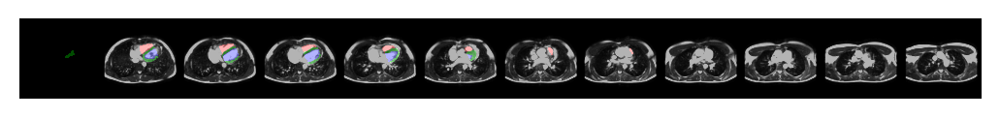

2020-12-01 15:50:54,312 INFO AX --> SAX rotated by the model
2020-12-01 15:50:54,315 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:50:54,370 INFO Target (AX2SAX):
2020-12-01 15:50:54,370 INFO Repeat the transformation on the full resolution
2020-12-01 15:50:56,925 INFO Predicted mask
2020-12-01 15:50:58,484 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:50:58,603 INFO DICE LV: 0.6800362467765808
2020-12-01 15:50:58,690 INFO DICE RV: 0.6452144384384155
2020-12-01 15:50:58,777 INFO DICE MYO: 0.4131070673465729
2020-12-01 15:50:58,784 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:50:58,789 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:50:59,317 INFO Predicted mask rotated to AX on original AX image


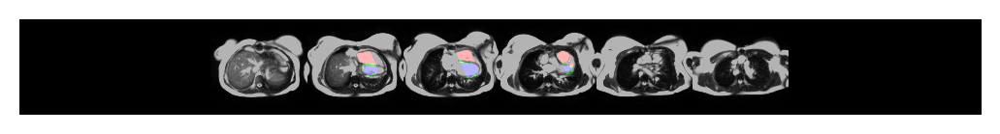

2020-12-01 15:50:59,725 INFO GT on AX


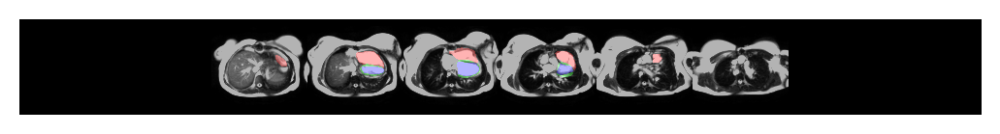

2020-12-01 15:51:03,330 INFO inv mask shape: (16, 256, 256, 4), gt mask shape: (16, 256, 256, 4)
2020-12-01 15:51:03,337 INFO DICE LV: 0.6938043832778931
2020-12-01 15:51:03,343 INFO DICE RV: 0.6484677791595459
2020-12-01 15:51:03,349 INFO DICE MYO: 0.43395915627479553
2020-12-01 15:51:03,400 INFO m: [[ 0.4668  -0.8833  -0.03906 -0.9937 ]
 [ 0.3667   0.153    0.9175  -0.9883 ]
 [-0.8047  -0.4426   0.3955  11.07   ]]
2020-12-01 15:51:03,401 INFO m_mod: [[ 0.4668  -0.8833  -0.03906 -0.288  ]
 [ 0.3667   0.153    0.9175   0.7817 ]
 [-0.8047  -0.4426   0.3955   0.9927 ]]
2020-12-01 15:51:03,401 INFO m_scaled: [[ 0.4668  -0.8833  -0.03906 -0.576  ]
 [ 0.3667   0.153    0.9175   1.563  ]
 [-0.8047  -0.4426   0.3955   1.985  ]]
2020-12-01 15:51:03,402 INFO 0000-5W8RFCJD_2005-04-18_ES_msk.nrrd
2020-12-01 15:51:03,403 INFO Prediction on AX volume:


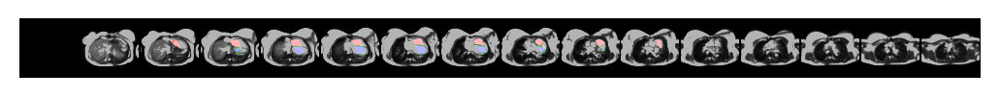

2020-12-01 15:51:04,236 INFO AX --> SAX rotated by the model
2020-12-01 15:51:04,241 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:51:04,283 INFO Target (AX2SAX):
2020-12-01 15:51:04,283 INFO Repeat the transformation on the full resolution
2020-12-01 15:51:06,954 INFO Predicted mask
2020-12-01 15:51:08,608 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:51:08,719 INFO DICE LV: 0.6748251914978027
2020-12-01 15:51:08,792 INFO DICE RV: 0.5272570848464966
2020-12-01 15:51:08,865 INFO DICE MYO: 0.42457425594329834
2020-12-01 15:51:08,871 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:51:08,877 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:51:09,358 INFO Predicted mask rotated to AX on original AX image


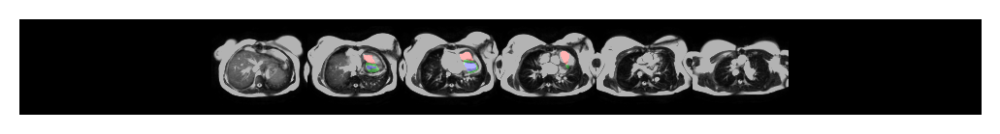

2020-12-01 15:51:09,761 INFO GT on AX


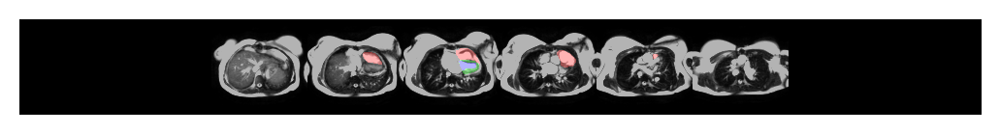

2020-12-01 15:51:10,691 INFO inv mask shape: (16, 256, 256, 4), gt mask shape: (16, 256, 256, 4)
2020-12-01 15:51:10,704 INFO DICE LV: 0.6957173347473145
2020-12-01 15:51:10,711 INFO DICE RV: 0.5232237577438354
2020-12-01 15:51:10,718 INFO DICE MYO: 0.41937968134880066
2020-12-01 15:51:10,769 INFO m: [[ 0.466   -0.8833  -0.04282 -0.9937 ]
 [ 0.367    0.1495   0.918   -0.9883 ]
 [-0.8047  -0.4436   0.394   11.1    ]]
2020-12-01 15:51:10,769 INFO m_mod: [[ 0.466   -0.8833  -0.04282 -0.2886 ]
 [ 0.367    0.1495   0.918    0.7837 ]
 [-0.8047  -0.4436   0.394    0.995  ]]
2020-12-01 15:51:10,770 INFO m_scaled: [[ 0.466   -0.8833  -0.04282 -0.577  ]
 [ 0.367    0.1495   0.918    1.567  ]
 [-0.8047  -0.4436   0.394    1.99   ]]
2020-12-01 15:51:10,771 INFO 0000-DLTVKE94_2006-07-18_ED_msk.nrrd
2020-12-01 15:51:10,771 INFO Prediction on AX volume:


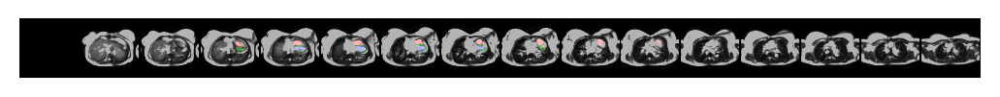

2020-12-01 15:51:11,606 INFO AX --> SAX rotated by the model
2020-12-01 15:51:11,608 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:51:11,644 INFO Target (AX2SAX):
2020-12-01 15:51:11,645 INFO Repeat the transformation on the full resolution
2020-12-01 15:51:14,233 INFO Predicted mask
2020-12-01 15:51:15,849 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:51:15,974 INFO DICE LV: 0.9143611788749695
2020-12-01 15:51:16,054 INFO DICE RV: 0.8516778945922852
2020-12-01 15:51:16,129 INFO DICE MYO: 0.6484845280647278
2020-12-01 15:51:16,135 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:51:16,141 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:51:16,608 INFO Predicted mask rotated to AX on original AX image


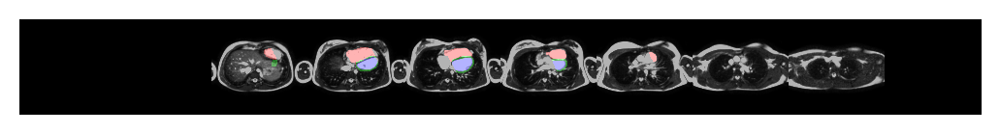

2020-12-01 15:51:17,001 INFO GT on AX


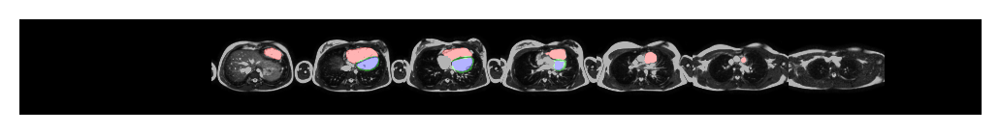

2020-12-01 15:51:17,880 INFO inv mask shape: (28, 256, 256, 4), gt mask shape: (28, 256, 256, 4)
2020-12-01 15:51:17,889 INFO DICE LV: 0.9190166592597961
2020-12-01 15:51:17,897 INFO DICE RV: 0.8497977256774902
2020-12-01 15:51:17,904 INFO DICE MYO: 0.6563989520072937
2020-12-01 15:51:17,954 INFO m: [[ 0.4934 -0.867   0.0592 -0.9897]
 [ 0.3582  0.265   0.895  -0.982 ]
 [-0.7925 -0.4204  0.4417  9.98  ]]
2020-12-01 15:51:17,954 INFO m_mod: [[ 0.4934 -0.867   0.0592 -0.2637]
 [ 0.3582  0.265   0.895   0.704 ]
 [-0.7925 -0.4204  0.4417  0.894 ]]
2020-12-01 15:51:17,955 INFO m_scaled: [[ 0.4934 -0.867   0.0592 -0.5273]
 [ 0.3582  0.265   0.895   1.408 ]
 [-0.7925 -0.4204  0.4417  1.788 ]]
2020-12-01 15:51:17,956 INFO 0000-DLTVKE94_2006-07-18_ES_msk.nrrd
2020-12-01 15:51:17,956 INFO Prediction on AX volume:


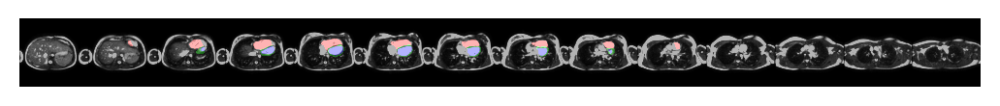

2020-12-01 15:51:18,784 INFO AX --> SAX rotated by the model
2020-12-01 15:51:18,785 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:51:18,805 INFO Target (AX2SAX):
2020-12-01 15:51:18,806 INFO Repeat the transformation on the full resolution
2020-12-01 15:51:21,318 INFO Predicted mask
2020-12-01 15:51:22,934 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:51:23,043 INFO DICE LV: 0.8023263216018677
2020-12-01 15:51:23,111 INFO DICE RV: 0.7108345031738281
2020-12-01 15:51:23,180 INFO DICE MYO: 0.6926969289779663
2020-12-01 15:51:23,187 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:51:23,193 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:51:23,682 INFO Predicted mask rotated to AX on original AX image


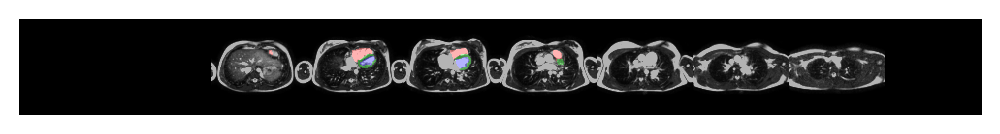

2020-12-01 15:51:24,085 INFO GT on AX


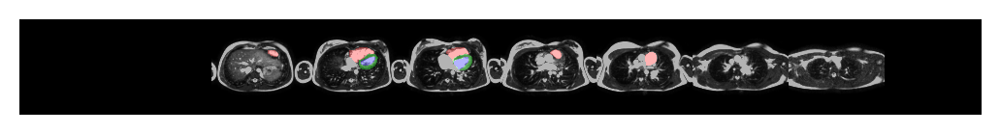

2020-12-01 15:51:24,980 INFO inv mask shape: (28, 256, 256, 4), gt mask shape: (28, 256, 256, 4)
2020-12-01 15:51:24,987 INFO DICE LV: 0.8097479939460754
2020-12-01 15:51:24,995 INFO DICE RV: 0.7035751342773438
2020-12-01 15:51:25,003 INFO DICE MYO: 0.7111338973045349
2020-12-01 15:51:25,052 INFO m: [[ 0.4973  -0.865    0.07043 -0.9893 ]
 [ 0.3572   0.2778   0.8916  -0.981  ]
 [-0.791   -0.4182   0.4473   9.85   ]]
2020-12-01 15:51:25,053 INFO m_mod: [[ 0.4973  -0.865    0.07043 -0.2612 ]
 [ 0.3572   0.2778   0.8916   0.6953 ]
 [-0.791   -0.4182   0.4473   0.883  ]]
2020-12-01 15:51:25,053 INFO m_scaled: [[ 0.4973  -0.865    0.07043 -0.5225 ]
 [ 0.3572   0.2778   0.8916   1.391  ]
 [-0.791   -0.4182   0.4473   1.766  ]]
2020-12-01 15:51:25,054 INFO 0000-E0RJZQQM_2005-09-30_ED_msk.nrrd
2020-12-01 15:51:25,054 INFO Prediction on AX volume:


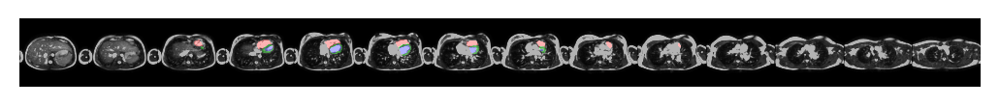

2020-12-01 15:51:25,869 INFO AX --> SAX rotated by the model
2020-12-01 15:51:25,870 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:51:25,903 INFO Target (AX2SAX):
2020-12-01 15:51:25,903 INFO Repeat the transformation on the full resolution
2020-12-01 15:51:28,440 INFO Predicted mask
2020-12-01 15:51:30,050 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:51:30,164 INFO DICE LV: 0.9098107814788818
2020-12-01 15:51:30,242 INFO DICE RV: 0.8031842708587646
2020-12-01 15:51:30,322 INFO DICE MYO: 0.640686571598053
2020-12-01 15:51:30,328 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:51:30,334 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:51:30,823 INFO Predicted mask rotated to AX on original AX image


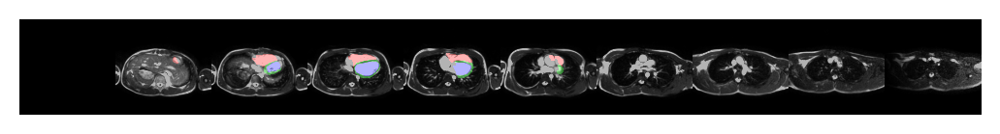

2020-12-01 15:51:31,241 INFO GT on AX


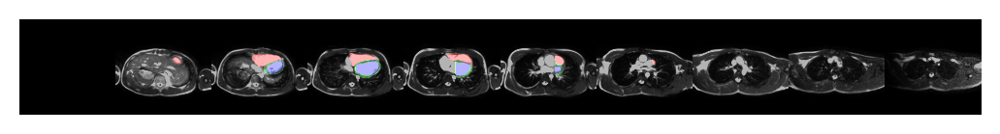

2020-12-01 15:51:32,373 INFO inv mask shape: (22, 256, 256, 4), gt mask shape: (22, 256, 256, 4)
2020-12-01 15:51:32,381 INFO DICE LV: 0.9177805185317993
2020-12-01 15:51:32,387 INFO DICE RV: 0.8044463992118835
2020-12-01 15:51:32,394 INFO DICE MYO: 0.6566662788391113
2020-12-01 15:51:32,443 INFO m: [[ 4.780e-01 -8.784e-01  4.036e-03 -9.922e-01]
 [ 3.628e-01  2.018e-01  9.097e-01 -9.858e-01]
 [-7.998e-01 -4.333e-01  4.153e-01  1.060e+01]]
2020-12-01 15:51:32,444 INFO m_mod: [[ 0.478    -0.8784    0.004036 -0.2778  ]
 [ 0.3628    0.2018    0.9097    0.7485  ]
 [-0.8      -0.4333    0.4153    0.95    ]]
2020-12-01 15:51:32,444 INFO m_scaled: [[ 0.478    -0.8784    0.004036 -0.5557  ]
 [ 0.3628    0.2018    0.9097    1.497   ]
 [-0.8      -0.4333    0.4153    1.9     ]]
2020-12-01 15:51:32,445 INFO 0000-E0RJZQQM_2005-09-30_ES_msk.nrrd
2020-12-01 15:51:32,445 INFO Prediction on AX volume:


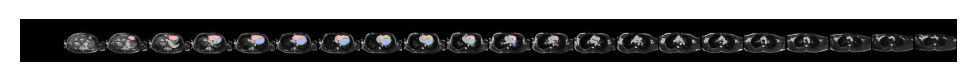

2020-12-01 15:51:33,338 INFO AX --> SAX rotated by the model
2020-12-01 15:51:33,339 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:51:33,359 INFO Target (AX2SAX):
2020-12-01 15:51:33,359 INFO Repeat the transformation on the full resolution
2020-12-01 15:51:35,909 INFO Predicted mask
2020-12-01 15:51:37,462 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:51:37,575 INFO DICE LV: 0.8506232500076294
2020-12-01 15:51:37,648 INFO DICE RV: 0.6173943877220154
2020-12-01 15:51:37,723 INFO DICE MYO: 0.6457428336143494
2020-12-01 15:51:37,728 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:51:37,734 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:51:38,194 INFO Predicted mask rotated to AX on original AX image


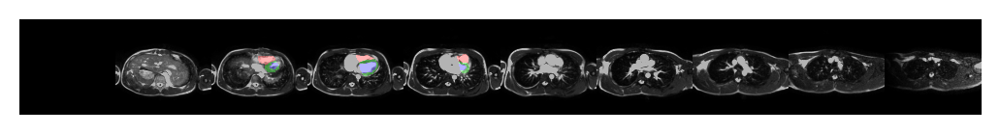

2020-12-01 15:51:38,602 INFO GT on AX


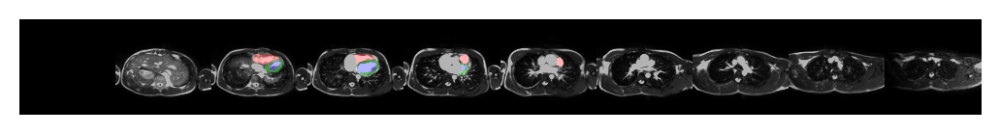

2020-12-01 15:51:39,744 INFO inv mask shape: (22, 256, 256, 4), gt mask shape: (22, 256, 256, 4)
2020-12-01 15:51:39,752 INFO DICE LV: 0.8529823422431946
2020-12-01 15:51:39,759 INFO DICE RV: 0.6281108856201172
2020-12-01 15:51:39,767 INFO DICE MYO: 0.6386328935623169
2020-12-01 15:51:39,816 INFO m: [[ 0.4802  -0.8774   0.01288 -0.992  ]
 [ 0.3625   0.2115   0.9077  -0.9854 ]
 [-0.799   -0.4312   0.4194  10.49   ]]
2020-12-01 15:51:39,816 INFO m_mod: [[ 0.4802  -0.8774   0.01288 -0.2754 ]
 [ 0.3625   0.2115   0.9077   0.741  ]
 [-0.799   -0.4312   0.4194   0.941  ]]
2020-12-01 15:51:39,817 INFO m_scaled: [[ 0.4802  -0.8774   0.01288 -0.551  ]
 [ 0.3625   0.2115   0.9077   1.482  ]
 [-0.799   -0.4312   0.4194   1.882  ]]
2020-12-01 15:51:39,818 INFO 0000-E24LRCWD_2006-11-23_ED_msk.nrrd
2020-12-01 15:51:39,818 INFO Prediction on AX volume:


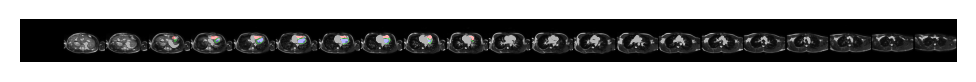

2020-12-01 15:51:40,676 INFO AX --> SAX rotated by the model
2020-12-01 15:51:40,677 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:51:40,697 INFO Target (AX2SAX):
2020-12-01 15:51:40,697 INFO Repeat the transformation on the full resolution
2020-12-01 15:51:43,138 INFO Predicted mask
2020-12-01 15:51:44,670 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:51:44,781 INFO DICE LV: 0.8457431793212891
2020-12-01 15:51:44,856 INFO DICE RV: 0.7355083227157593
2020-12-01 15:51:44,929 INFO DICE MYO: 0.6250544190406799
2020-12-01 15:51:44,935 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:51:44,941 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:51:45,414 INFO Predicted mask rotated to AX on original AX image


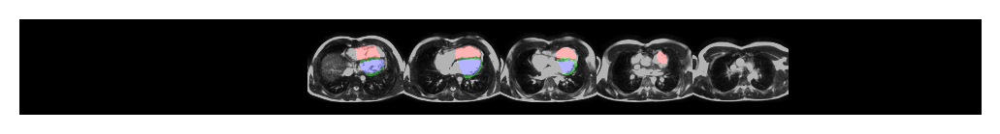

2020-12-01 15:51:45,816 INFO GT on AX


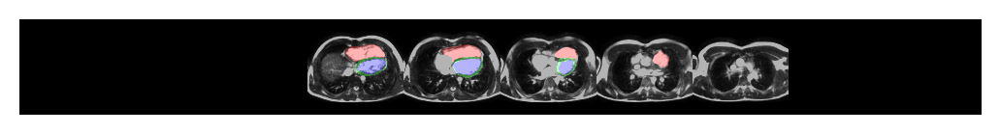

2020-12-01 15:51:46,862 INFO inv mask shape: (20, 256, 256, 4), gt mask shape: (20, 256, 256, 4)
2020-12-01 15:51:46,868 INFO DICE LV: 0.8650660514831543
2020-12-01 15:51:46,874 INFO DICE RV: 0.7402929067611694
2020-12-01 15:51:46,881 INFO DICE MYO: 0.6599448919296265
2020-12-01 15:51:46,929 INFO m: [[ 0.482   -0.876    0.01974 -0.9917 ]
 [ 0.3616   0.2195   0.906   -0.985  ]
 [-0.798   -0.4294   0.4224  10.414  ]]
2020-12-01 15:51:46,930 INFO m_mod: [[ 0.482   -0.876    0.01974 -0.274  ]
 [ 0.3616   0.2195   0.906    0.735  ]
 [-0.798   -0.4294   0.4224   0.933  ]]
2020-12-01 15:51:46,930 INFO m_scaled: [[ 0.482   -0.876    0.01974 -0.548  ]
 [ 0.3616   0.2195   0.906    1.47   ]
 [-0.798   -0.4294   0.4224   1.866  ]]
2020-12-01 15:51:46,931 INFO 0000-E24LRCWD_2006-11-23_ES_msk.nrrd
2020-12-01 15:51:46,931 INFO Prediction on AX volume:


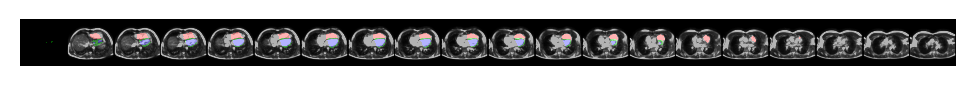

2020-12-01 15:51:47,779 INFO AX --> SAX rotated by the model
2020-12-01 15:51:47,780 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:51:47,800 INFO Target (AX2SAX):
2020-12-01 15:51:47,800 INFO Repeat the transformation on the full resolution
2020-12-01 15:51:50,215 INFO Predicted mask
2020-12-01 15:51:51,730 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:51:51,844 INFO DICE LV: 0.8236443400382996
2020-12-01 15:51:51,917 INFO DICE RV: 0.737646758556366
2020-12-01 15:51:51,991 INFO DICE MYO: 0.60060054063797
2020-12-01 15:51:51,997 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:51:52,002 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:51:52,481 INFO Predicted mask rotated to AX on original AX image


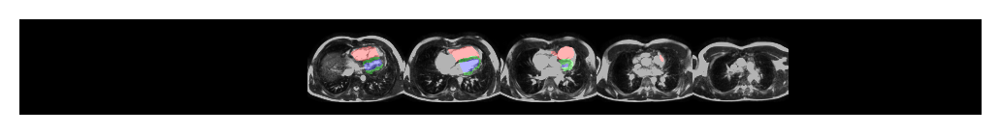

2020-12-01 15:51:52,879 INFO GT on AX


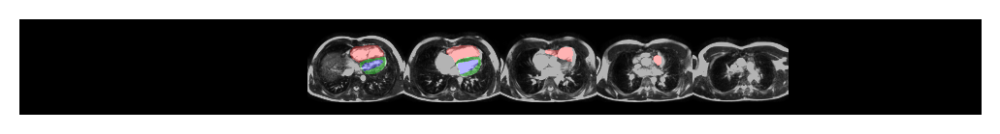

2020-12-01 15:51:53,890 INFO inv mask shape: (20, 256, 256, 4), gt mask shape: (20, 256, 256, 4)
2020-12-01 15:51:53,898 INFO DICE LV: 0.8587594032287598
2020-12-01 15:51:53,904 INFO DICE RV: 0.7820963263511658
2020-12-01 15:51:53,911 INFO DICE MYO: 0.6108263731002808
2020-12-01 15:51:53,960 INFO m: [[ 4.795e-01 -8.779e-01  9.911e-03 -9.922e-01]
 [ 3.625e-01  2.083e-01  9.087e-01 -9.854e-01]
 [-7.993e-01 -4.321e-01  4.180e-01  1.052e+01]]
2020-12-01 15:51:53,961 INFO m_mod: [[ 0.4795  -0.878    0.00991 -0.276  ]
 [ 0.3625   0.2083   0.9087   0.7427 ]
 [-0.7993  -0.4321   0.418    0.943  ]]
2020-12-01 15:51:53,961 INFO m_scaled: [[ 0.4795  -0.878    0.00991 -0.552  ]
 [ 0.3625   0.2083   0.9087   1.485  ]
 [-0.7993  -0.4321   0.418    1.886  ]]
2020-12-01 15:51:53,962 INFO 0000-FANDNZ55_2007-02-19_ED_msk.nrrd
2020-12-01 15:51:53,962 INFO Prediction on AX volume:


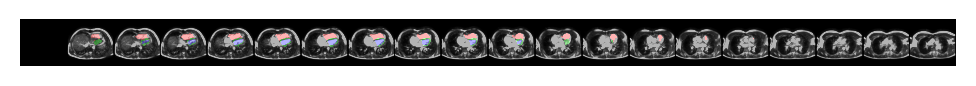

2020-12-01 15:51:54,813 INFO AX --> SAX rotated by the model
2020-12-01 15:51:54,815 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:51:54,857 INFO Target (AX2SAX):
2020-12-01 15:51:54,858 INFO Repeat the transformation on the full resolution
2020-12-01 15:51:57,294 INFO Predicted mask
2020-12-01 15:51:58,812 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:51:58,923 INFO DICE LV: 0.9393904209136963
2020-12-01 15:51:58,996 INFO DICE RV: 0.8807646632194519
2020-12-01 15:51:59,070 INFO DICE MYO: 0.7219323515892029
2020-12-01 15:51:59,075 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:51:59,081 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:51:59,552 INFO Predicted mask rotated to AX on original AX image


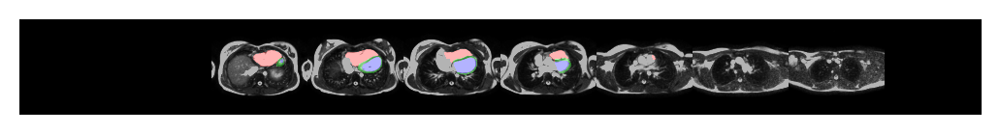

2020-12-01 15:51:59,948 INFO GT on AX


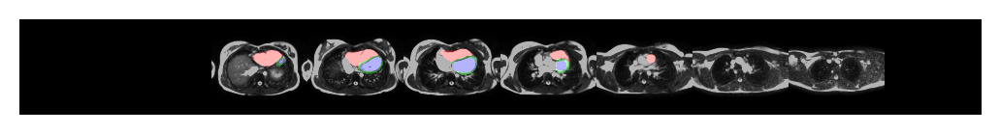

2020-12-01 15:52:00,859 INFO inv mask shape: (30, 256, 256, 4), gt mask shape: (30, 256, 256, 4)
2020-12-01 15:52:00,873 INFO DICE LV: 0.9368558526039124
2020-12-01 15:52:00,883 INFO DICE RV: 0.8918604254722595
2020-12-01 15:52:00,891 INFO DICE MYO: 0.732873260974884
2020-12-01 15:52:00,939 INFO m: [[ 0.4834  -0.875    0.02368 -0.9917 ]
 [ 0.3613   0.2241   0.9053  -0.985  ]
 [-0.7974  -0.429    0.4246  10.38   ]]
2020-12-01 15:52:00,939 INFO m_mod: [[ 0.4834  -0.875    0.02368 -0.273  ]
 [ 0.3613   0.2241   0.9053   0.733  ]
 [-0.7974  -0.429    0.4246   0.9307 ]]
2020-12-01 15:52:00,940 INFO m_scaled: [[ 0.4834  -0.875    0.02368 -0.546  ]
 [ 0.3613   0.2241   0.9053   1.466  ]
 [-0.7974  -0.429    0.4246   1.861  ]]
2020-12-01 15:52:00,941 INFO 0000-FANDNZ55_2007-02-19_ES_msk.nrrd
2020-12-01 15:52:00,941 INFO Prediction on AX volume:


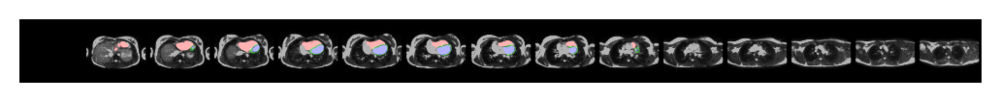

2020-12-01 15:52:01,743 INFO AX --> SAX rotated by the model
2020-12-01 15:52:01,743 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:52:01,765 INFO Target (AX2SAX):
2020-12-01 15:52:01,766 INFO Repeat the transformation on the full resolution
2020-12-01 15:52:04,198 INFO Predicted mask
2020-12-01 15:52:05,721 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:52:05,834 INFO DICE LV: 0.8719024062156677
2020-12-01 15:52:05,908 INFO DICE RV: 0.8322518467903137
2020-12-01 15:52:05,981 INFO DICE MYO: 0.7540979981422424
2020-12-01 15:52:05,986 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:52:05,991 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:52:06,458 INFO Predicted mask rotated to AX on original AX image


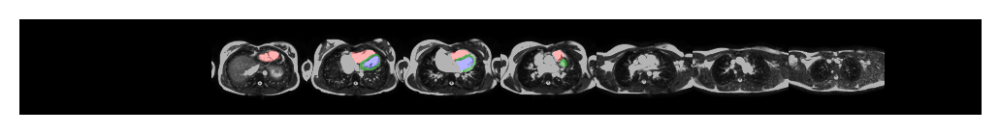

2020-12-01 15:52:06,853 INFO GT on AX


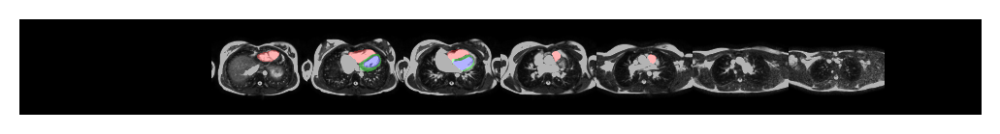

2020-12-01 15:52:07,761 INFO inv mask shape: (30, 256, 256, 4), gt mask shape: (30, 256, 256, 4)
2020-12-01 15:52:07,770 INFO DICE LV: 0.8802034258842468
2020-12-01 15:52:07,779 INFO DICE RV: 0.8204473853111267
2020-12-01 15:52:07,788 INFO DICE MYO: 0.7681049704551697
2020-12-01 15:52:07,837 INFO m: [[ 0.4854  -0.8735   0.03177 -0.991  ]
 [ 0.3604   0.233    0.903   -0.984  ]
 [-0.7964  -0.4268   0.428   10.29   ]]
2020-12-01 15:52:07,838 INFO m_mod: [[ 0.4854  -0.8735   0.03177 -0.271  ]
 [ 0.3604   0.233    0.903    0.7266 ]
 [-0.7964  -0.4268   0.428    0.9224 ]]
2020-12-01 15:52:07,838 INFO m_scaled: [[ 0.4854  -0.8735   0.03177 -0.542  ]
 [ 0.3604   0.233    0.903    1.453  ]
 [-0.7964  -0.4268   0.428    1.845  ]]
2020-12-01 15:52:07,839 INFO 0000-FHQU30DQ_2005-05-10_ED_msk.nrrd
2020-12-01 15:52:07,839 INFO Prediction on AX volume:


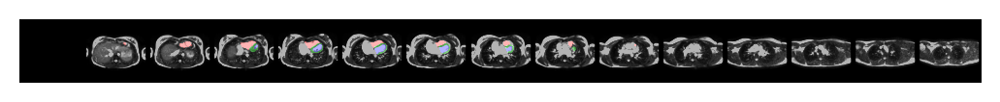

2020-12-01 15:52:08,627 INFO AX --> SAX rotated by the model
2020-12-01 15:52:08,628 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:52:08,660 INFO Target (AX2SAX):
2020-12-01 15:52:08,660 INFO Repeat the transformation on the full resolution
2020-12-01 15:52:11,105 INFO Predicted mask
2020-12-01 15:52:12,634 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:52:12,753 INFO DICE LV: 0.8917722702026367
2020-12-01 15:52:12,833 INFO DICE RV: 0.7672640085220337
2020-12-01 15:52:12,912 INFO DICE MYO: 0.6355351209640503
2020-12-01 15:52:12,918 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:52:12,924 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:52:13,421 INFO Predicted mask rotated to AX on original AX image


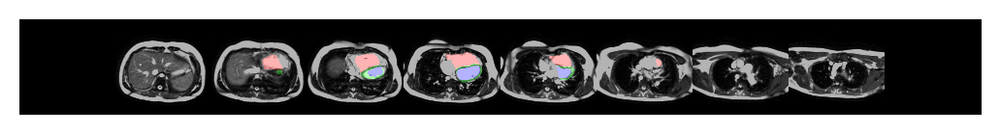

2020-12-01 15:52:13,820 INFO GT on AX


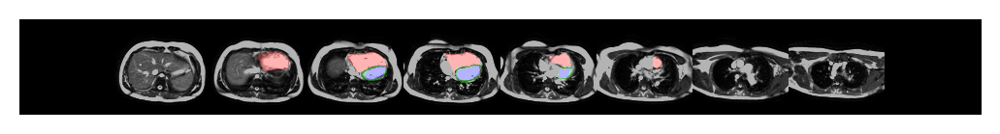

2020-12-01 15:52:14,796 INFO inv mask shape: (30, 256, 256, 4), gt mask shape: (30, 256, 256, 4)
2020-12-01 15:52:14,806 INFO DICE LV: 0.8977251052856445
2020-12-01 15:52:14,814 INFO DICE RV: 0.7726313471794128
2020-12-01 15:52:14,824 INFO DICE MYO: 0.6436760425567627
2020-12-01 15:52:14,879 INFO m: [[ 0.4985  -0.8643   0.07587 -0.989  ]
 [ 0.3567   0.2844   0.89    -0.9805 ]
 [-0.79    -0.4165   0.4497   9.8    ]]
2020-12-01 15:52:14,880 INFO m_mod: [[ 0.4985  -0.8643   0.07587 -0.2598 ]
 [ 0.3567   0.2844   0.89     0.692  ]
 [-0.79    -0.4165   0.4497   0.8784 ]]
2020-12-01 15:52:14,881 INFO m_scaled: [[ 0.4985  -0.8643   0.07587 -0.5195 ]
 [ 0.3567   0.2844   0.89     1.384  ]
 [-0.79    -0.4165   0.4497   1.757  ]]
2020-12-01 15:52:14,881 INFO 0000-FHQU30DQ_2005-05-10_ES_msk.nrrd
2020-12-01 15:52:14,882 INFO Prediction on AX volume:


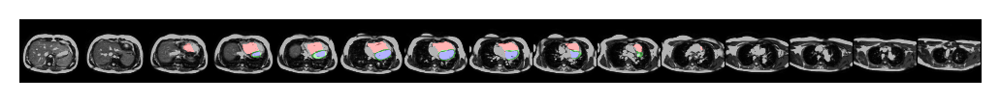

2020-12-01 15:52:15,696 INFO AX --> SAX rotated by the model
2020-12-01 15:52:15,698 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:52:15,742 INFO Target (AX2SAX):
2020-12-01 15:52:15,742 INFO Repeat the transformation on the full resolution
2020-12-01 15:52:18,159 INFO Predicted mask
2020-12-01 15:52:19,662 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:52:19,778 INFO DICE LV: 0.7573718428611755
2020-12-01 15:52:19,858 INFO DICE RV: 0.6789911389350891
2020-12-01 15:52:19,938 INFO DICE MYO: 0.6875011920928955
2020-12-01 15:52:19,943 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:52:19,948 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:52:20,440 INFO Predicted mask rotated to AX on original AX image


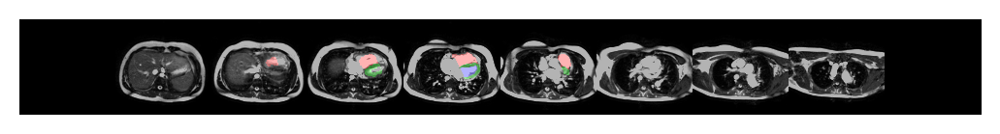

2020-12-01 15:52:20,851 INFO GT on AX


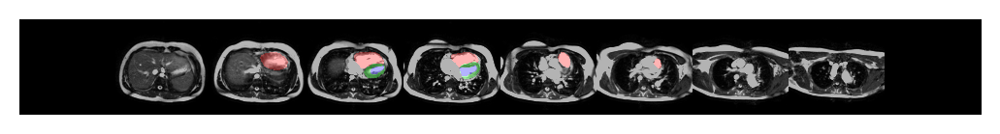

2020-12-01 15:52:21,818 INFO inv mask shape: (30, 256, 256, 4), gt mask shape: (30, 256, 256, 4)
2020-12-01 15:52:21,828 INFO DICE LV: 0.7149849534034729
2020-12-01 15:52:21,837 INFO DICE RV: 0.6878160834312439
2020-12-01 15:52:21,846 INFO DICE MYO: 0.7007824778556824
2020-12-01 15:52:21,900 INFO m: [[ 0.4976  -0.864    0.07336 -0.9893 ]
 [ 0.3567   0.281    0.8906  -0.981  ]
 [-0.7905  -0.417    0.4482   9.83   ]]
2020-12-01 15:52:21,901 INFO m_mod: [[ 0.4976  -0.864    0.07336 -0.2603 ]
 [ 0.3567   0.281    0.8906   0.6934 ]
 [-0.7905  -0.417    0.4482   0.881  ]]
2020-12-01 15:52:21,901 INFO m_scaled: [[ 0.4976  -0.864    0.07336 -0.5205 ]
 [ 0.3567   0.281    0.8906   1.387  ]
 [-0.7905  -0.417    0.4482   1.762  ]]
2020-12-01 15:52:21,902 INFO 0000-G8XJ03CH_2007-10-31_ED_msk.nrrd
2020-12-01 15:52:21,902 INFO Prediction on AX volume:


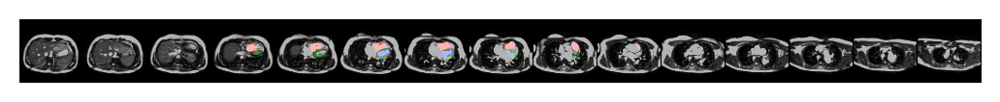

2020-12-01 15:52:22,702 INFO AX --> SAX rotated by the model
2020-12-01 15:52:22,703 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:52:22,734 INFO Target (AX2SAX):
2020-12-01 15:52:22,734 INFO Repeat the transformation on the full resolution
2020-12-01 15:52:25,160 INFO Predicted mask
2020-12-01 15:52:26,673 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:52:26,790 INFO DICE LV: 0.9214266538619995
2020-12-01 15:52:26,875 INFO DICE RV: 0.8959068059921265
2020-12-01 15:52:26,953 INFO DICE MYO: 0.6938781142234802
2020-12-01 15:52:26,959 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:52:26,964 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:52:27,445 INFO Predicted mask rotated to AX on original AX image


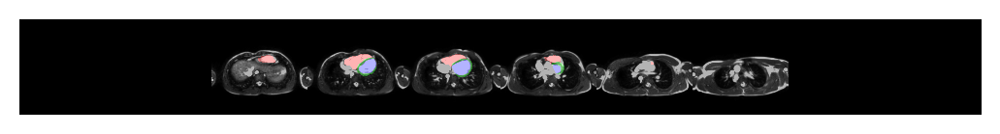

2020-12-01 15:52:27,844 INFO GT on AX


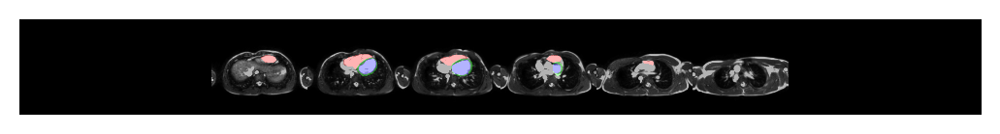

2020-12-01 15:52:28,703 INFO inv mask shape: (25, 256, 256, 4), gt mask shape: (25, 256, 256, 4)
2020-12-01 15:52:28,711 INFO DICE LV: 0.9265189170837402
2020-12-01 15:52:28,719 INFO DICE RV: 0.9026451110839844
2020-12-01 15:52:28,727 INFO DICE MYO: 0.6823559999465942
2020-12-01 15:52:28,781 INFO m: [[ 0.4985 -0.864   0.0762 -0.989 ]
 [ 0.3567  0.2847  0.8896 -0.9805]
 [-0.79   -0.4163  0.4497  9.79  ]]
2020-12-01 15:52:28,782 INFO m_mod: [[ 0.4985 -0.864   0.0762 -0.2598]
 [ 0.3567  0.2847  0.8896  0.6914]
 [-0.79   -0.4163  0.4497  0.8774]]
2020-12-01 15:52:28,782 INFO m_scaled: [[ 0.4985 -0.864   0.0762 -0.5195]
 [ 0.3567  0.2847  0.8896  1.383 ]
 [-0.79   -0.4163  0.4497  1.755 ]]
2020-12-01 15:52:28,783 INFO 0000-G8XJ03CH_2007-10-31_ES_msk.nrrd
2020-12-01 15:52:28,783 INFO Prediction on AX volume:


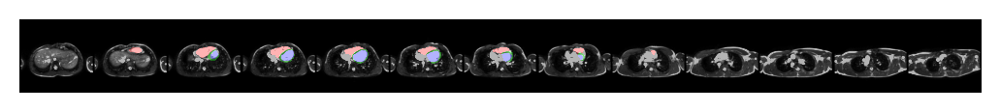

2020-12-01 15:52:29,550 INFO AX --> SAX rotated by the model
2020-12-01 15:52:29,550 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:52:29,570 INFO Target (AX2SAX):
2020-12-01 15:52:29,570 INFO Repeat the transformation on the full resolution
2020-12-01 15:52:31,993 INFO Predicted mask
2020-12-01 15:52:33,524 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:52:33,642 INFO DICE LV: 0.8260827660560608
2020-12-01 15:52:33,722 INFO DICE RV: 0.7940852046012878
2020-12-01 15:52:33,801 INFO DICE MYO: 0.7329129576683044
2020-12-01 15:52:33,807 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:52:33,813 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:52:34,298 INFO Predicted mask rotated to AX on original AX image


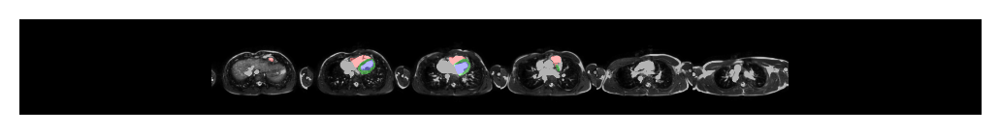

2020-12-01 15:52:34,686 INFO GT on AX


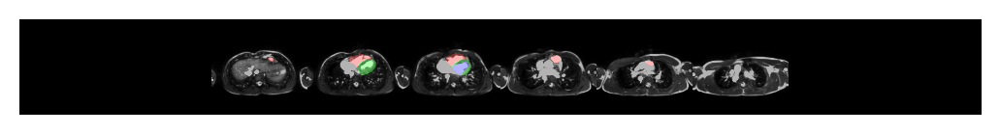

2020-12-01 15:52:35,552 INFO inv mask shape: (25, 256, 256, 4), gt mask shape: (25, 256, 256, 4)
2020-12-01 15:52:35,560 INFO DICE LV: 0.8206363320350647
2020-12-01 15:52:35,568 INFO DICE RV: 0.8021048903465271
2020-12-01 15:52:35,576 INFO DICE MYO: 0.7340661287307739
2020-12-01 15:52:35,631 INFO m: [[ 0.4976  -0.864    0.07336 -0.9893 ]
 [ 0.3567   0.281    0.8906  -0.981  ]
 [-0.7905  -0.417    0.4482   9.83   ]]
2020-12-01 15:52:35,632 INFO m_mod: [[ 0.4976  -0.864    0.07336 -0.2603 ]
 [ 0.3567   0.281    0.8906   0.6934 ]
 [-0.7905  -0.417    0.4482   0.8804 ]]
2020-12-01 15:52:35,633 INFO m_scaled: [[ 0.4976  -0.864    0.07336 -0.5205 ]
 [ 0.3567   0.281    0.8906   1.387  ]
 [-0.7905  -0.417    0.4482   1.761  ]]
2020-12-01 15:52:35,634 INFO 0000-GYMP57R6_2006-12-18_ED_msk.nrrd
2020-12-01 15:52:35,634 INFO Prediction on AX volume:


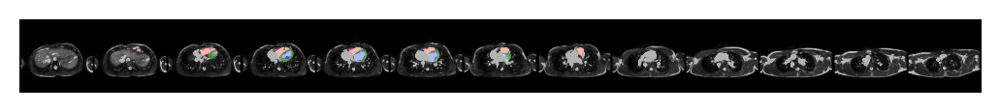

2020-12-01 15:52:36,403 INFO AX --> SAX rotated by the model
2020-12-01 15:52:36,404 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:52:36,430 INFO Target (AX2SAX):
2020-12-01 15:52:36,431 INFO Repeat the transformation on the full resolution
2020-12-01 15:52:38,871 INFO Predicted mask
2020-12-01 15:52:40,408 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:52:40,528 INFO DICE LV: 0.9071342349052429
2020-12-01 15:52:40,614 INFO DICE RV: 0.7936882972717285
2020-12-01 15:52:40,695 INFO DICE MYO: 0.7148427367210388
2020-12-01 15:52:40,700 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:52:40,705 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:52:41,193 INFO Predicted mask rotated to AX on original AX image


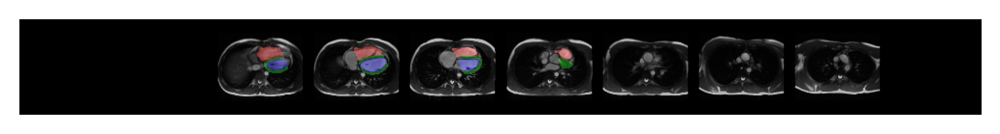

2020-12-01 15:52:41,592 INFO GT on AX


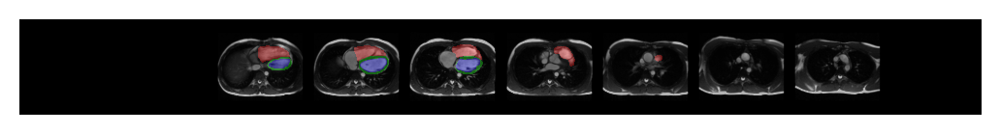

2020-12-01 15:52:42,381 INFO inv mask shape: (26, 156, 192, 4), gt mask shape: (26, 156, 192, 4)
2020-12-01 15:52:42,385 INFO DICE LV: 0.9144273996353149
2020-12-01 15:52:42,389 INFO DICE RV: 0.7981342077255249
2020-12-01 15:52:42,393 INFO DICE MYO: 0.72700035572052
2020-12-01 15:52:42,448 INFO m: [[ 0.4854  -0.8735   0.03075 -0.991  ]
 [ 0.3606   0.2323   0.9033  -0.984  ]
 [-0.7964  -0.427    0.4277  10.3    ]]
2020-12-01 15:52:42,449 INFO m_mod: [[ 0.4854  -0.8735   0.03075 -0.271  ]
 [ 0.3606   0.2323   0.9033   0.7266 ]
 [-0.7964  -0.427    0.4277   0.9224 ]]
2020-12-01 15:52:42,449 INFO m_scaled: [[ 0.4854  -0.8735   0.03075 -0.542  ]
 [ 0.3606   0.2323   0.9033   1.453  ]
 [-0.7964  -0.427    0.4277   1.845  ]]
2020-12-01 15:52:42,450 INFO 0000-GYMP57R6_2006-12-18_ES_msk.nrrd
2020-12-01 15:52:42,450 INFO Prediction on AX volume:


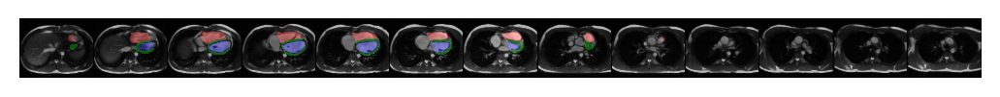

2020-12-01 15:52:43,211 INFO AX --> SAX rotated by the model
2020-12-01 15:52:43,212 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:52:43,232 INFO Target (AX2SAX):
2020-12-01 15:52:43,232 INFO Repeat the transformation on the full resolution
2020-12-01 15:52:45,687 INFO Predicted mask
2020-12-01 15:52:47,219 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:52:47,338 INFO DICE LV: 0.880609929561615
2020-12-01 15:52:47,417 INFO DICE RV: 0.7185564041137695
2020-12-01 15:52:47,497 INFO DICE MYO: 0.74785977602005
2020-12-01 15:52:47,502 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:52:47,508 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:52:48,003 INFO Predicted mask rotated to AX on original AX image


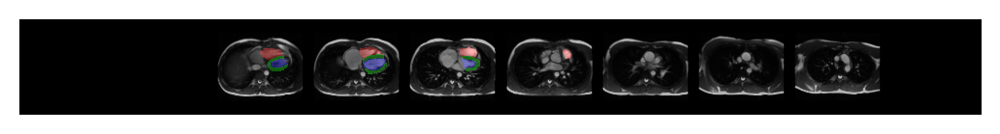

2020-12-01 15:52:48,400 INFO GT on AX


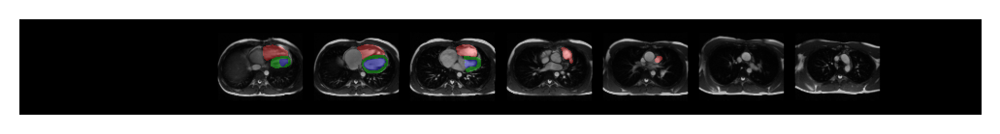

2020-12-01 15:52:49,178 INFO inv mask shape: (26, 156, 192, 4), gt mask shape: (26, 156, 192, 4)
2020-12-01 15:52:49,183 INFO DICE LV: 0.8839542269706726
2020-12-01 15:52:49,186 INFO DICE RV: 0.73382967710495
2020-12-01 15:52:49,190 INFO DICE MYO: 0.7514138221740723
2020-12-01 15:52:49,246 INFO m: [[ 0.4844  -0.8745   0.02687 -0.991  ]
 [ 0.361    0.2277   0.9043  -0.9844 ]
 [-0.797   -0.4282   0.4258  10.34   ]]
2020-12-01 15:52:49,246 INFO m_mod: [[ 0.4844  -0.8745   0.02687 -0.272  ]
 [ 0.361    0.2277   0.9043   0.73   ]
 [-0.797   -0.4282   0.4258   0.927  ]]
2020-12-01 15:52:49,247 INFO m_scaled: [[ 0.4844  -0.8745   0.02687 -0.544  ]
 [ 0.361    0.2277   0.9043   1.46   ]
 [-0.797   -0.4282   0.4258   1.854  ]]
2020-12-01 15:52:49,248 INFO 0000-GYRF6ZAA_2004-08-01_ED_msk.nrrd
2020-12-01 15:52:49,248 INFO Prediction on AX volume:


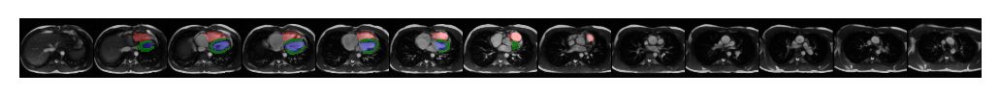

2020-12-01 15:52:50,006 INFO AX --> SAX rotated by the model
2020-12-01 15:52:50,007 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:52:50,027 INFO Target (AX2SAX):
2020-12-01 15:52:50,027 INFO Repeat the transformation on the full resolution
2020-12-01 15:52:52,472 INFO Predicted mask
2020-12-01 15:52:54,017 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:52:54,135 INFO DICE LV: 0.8574939966201782
2020-12-01 15:52:54,215 INFO DICE RV: 0.789597749710083
2020-12-01 15:52:54,294 INFO DICE MYO: 0.6408153772354126
2020-12-01 15:52:54,300 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:52:54,305 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:52:54,792 INFO Predicted mask rotated to AX on original AX image


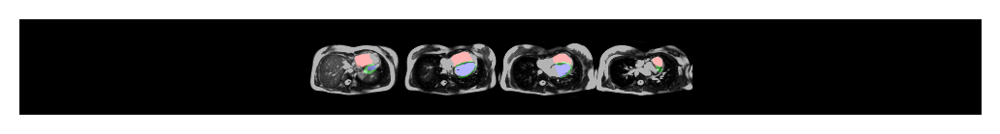

2020-12-01 15:52:55,182 INFO GT on AX


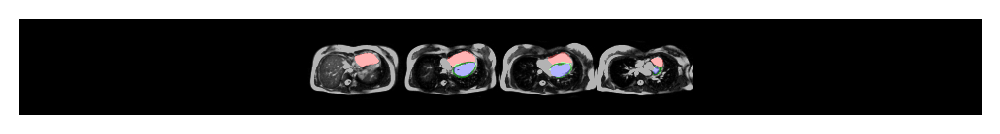

2020-12-01 15:52:55,964 INFO inv mask shape: (12, 256, 256, 4), gt mask shape: (12, 256, 256, 4)
2020-12-01 15:52:55,971 INFO DICE LV: 0.8720264434814453
2020-12-01 15:52:55,976 INFO DICE RV: 0.7948023080825806
2020-12-01 15:52:55,981 INFO DICE MYO: 0.6514679789543152
2020-12-01 15:52:56,039 INFO m: [[ 0.4883  -0.871    0.04248 -0.9907 ]
 [ 0.3594   0.2455   0.9     -0.9834 ]
 [-0.795   -0.4243   0.433   10.17   ]]
2020-12-01 15:52:56,040 INFO m_mod: [[ 0.4883  -0.871    0.04248 -0.2686 ]
 [ 0.3594   0.2455   0.9      0.7183 ]
 [-0.795   -0.4243   0.433    0.912  ]]
2020-12-01 15:52:56,041 INFO m_scaled: [[ 0.4883  -0.871    0.04248 -0.537  ]
 [ 0.3594   0.2455   0.9      1.437  ]
 [-0.795   -0.4243   0.433    1.824  ]]
2020-12-01 15:52:56,042 INFO 0000-GYRF6ZAA_2004-08-01_ES_msk.nrrd
2020-12-01 15:52:56,042 INFO Prediction on AX volume:


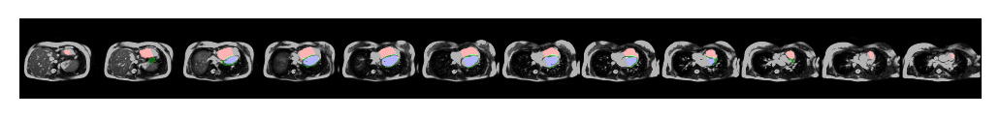

2020-12-01 15:52:56,804 INFO AX --> SAX rotated by the model
2020-12-01 15:52:56,805 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:52:56,844 INFO Target (AX2SAX):
2020-12-01 15:52:56,844 INFO Repeat the transformation on the full resolution
2020-12-01 15:52:59,400 INFO Predicted mask
2020-12-01 15:53:00,921 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:53:01,038 INFO DICE LV: 0.8018403053283691
2020-12-01 15:53:01,122 INFO DICE RV: 0.7667790651321411
2020-12-01 15:53:01,201 INFO DICE MYO: 0.7209012508392334
2020-12-01 15:53:01,206 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:53:01,211 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:53:01,693 INFO Predicted mask rotated to AX on original AX image


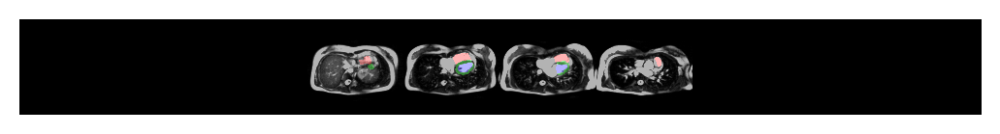

2020-12-01 15:53:02,084 INFO GT on AX


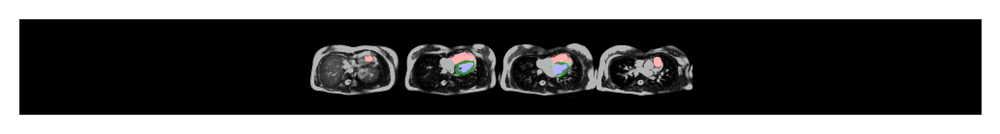

2020-12-01 15:53:02,864 INFO inv mask shape: (12, 256, 256, 4), gt mask shape: (12, 256, 256, 4)
2020-12-01 15:53:02,869 INFO DICE LV: 0.8405330777168274
2020-12-01 15:53:02,873 INFO DICE RV: 0.7745861411094666
2020-12-01 15:53:02,877 INFO DICE MYO: 0.7458454370498657
2020-12-01 15:53:02,932 INFO m: [[ 0.4883  -0.871    0.04315 -0.9907 ]
 [ 0.3594   0.2462   0.9     -0.9834 ]
 [-0.795   -0.424    0.4336  10.17   ]]
2020-12-01 15:53:02,932 INFO m_mod: [[ 0.4883  -0.871    0.04315 -0.2686 ]
 [ 0.3594   0.2462   0.9      0.7183 ]
 [-0.795   -0.424    0.4336   0.912  ]]
2020-12-01 15:53:02,933 INFO m_scaled: [[ 0.4883  -0.871    0.04315 -0.537  ]
 [ 0.3594   0.2462   0.9      1.437  ]
 [-0.795   -0.424    0.4336   1.824  ]]
2020-12-01 15:53:02,934 INFO 0000-JDRPF7F4_2006-02-28_ED_msk.nrrd
2020-12-01 15:53:02,934 INFO Prediction on AX volume:


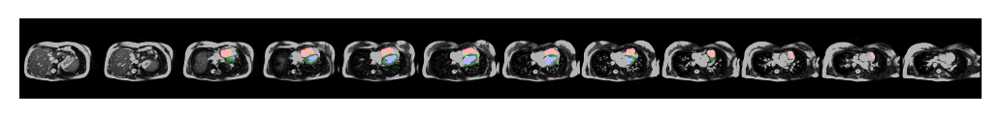

2020-12-01 15:53:03,736 INFO AX --> SAX rotated by the model
2020-12-01 15:53:03,737 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:53:03,768 INFO Target (AX2SAX):
2020-12-01 15:53:03,768 INFO Repeat the transformation on the full resolution
2020-12-01 15:53:06,210 INFO Predicted mask
2020-12-01 15:53:07,759 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:53:07,876 INFO DICE LV: 0.7307470440864563
2020-12-01 15:53:07,956 INFO DICE RV: 0.4071168303489685
2020-12-01 15:53:08,035 INFO DICE MYO: 0.5785914063453674
2020-12-01 15:53:08,040 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:53:08,046 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:53:08,532 INFO Predicted mask rotated to AX on original AX image


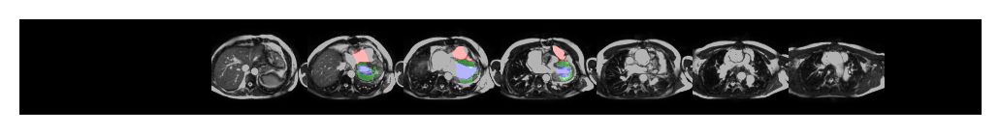

2020-12-01 15:53:08,946 INFO GT on AX


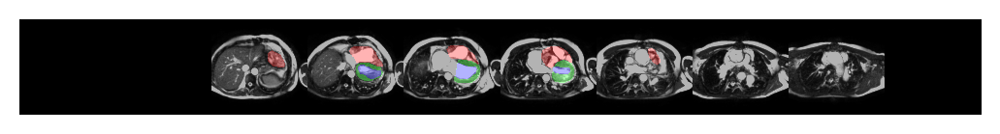

2020-12-01 15:53:12,441 INFO inv mask shape: (25, 256, 256, 4), gt mask shape: (25, 256, 256, 4)
2020-12-01 15:53:12,449 INFO DICE LV: 0.799379289150238
2020-12-01 15:53:12,457 INFO DICE RV: 0.4058898687362671
2020-12-01 15:53:12,464 INFO DICE MYO: 0.6302357912063599
2020-12-01 15:53:12,505 INFO m: [[ 0.4844  -0.874    0.02716 -0.991  ]
 [ 0.361    0.2284   0.904   -0.9844 ]
 [-0.797   -0.428    0.4263  10.336  ]]
2020-12-01 15:53:12,505 INFO m_mod: [[ 0.4844  -0.874    0.02716 -0.272  ]
 [ 0.361    0.2284   0.904    0.73   ]
 [-0.797   -0.428    0.4263   0.927  ]]
2020-12-01 15:53:12,506 INFO m_scaled: [[ 0.4844  -0.874    0.02716 -0.544  ]
 [ 0.361    0.2284   0.904    1.46   ]
 [-0.797   -0.428    0.4263   1.854  ]]
2020-12-01 15:53:12,507 INFO 0000-JDRPF7F4_2006-02-28_ES_msk.nrrd
2020-12-01 15:53:12,507 INFO Prediction on AX volume:


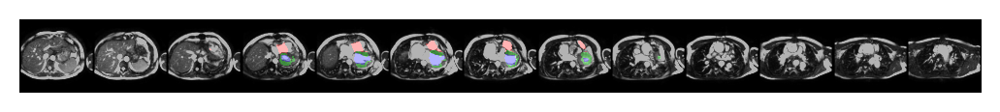

2020-12-01 15:53:13,306 INFO AX --> SAX rotated by the model
2020-12-01 15:53:13,307 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:53:13,344 INFO Target (AX2SAX):
2020-12-01 15:53:13,345 INFO Repeat the transformation on the full resolution
2020-12-01 15:53:15,906 INFO Predicted mask
2020-12-01 15:53:17,541 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:53:17,648 INFO DICE LV: 0.8063679337501526
2020-12-01 15:53:17,716 INFO DICE RV: 0.4652881920337677
2020-12-01 15:53:17,784 INFO DICE MYO: 0.5971229672431946
2020-12-01 15:53:17,790 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:53:17,796 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:53:18,262 INFO Predicted mask rotated to AX on original AX image


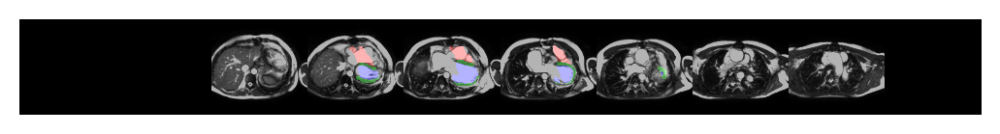

2020-12-01 15:53:18,665 INFO GT on AX


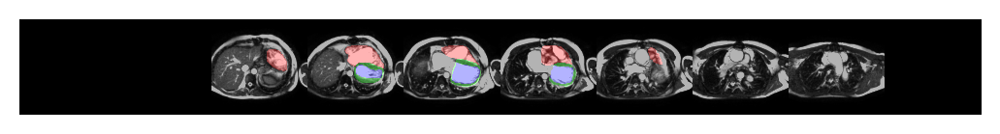

2020-12-01 15:53:19,497 INFO inv mask shape: (25, 256, 256, 4), gt mask shape: (25, 256, 256, 4)
2020-12-01 15:53:19,504 INFO DICE LV: 0.816921591758728
2020-12-01 15:53:19,511 INFO DICE RV: 0.47493791580200195
2020-12-01 15:53:19,517 INFO DICE MYO: 0.6157351136207581
2020-12-01 15:53:19,560 INFO m: [[ 0.482   -0.876    0.01906 -0.9917 ]
 [ 0.3616   0.2188   0.9062  -0.985  ]
 [-0.798   -0.43     0.422   10.43   ]]
2020-12-01 15:53:19,560 INFO m_mod: [[ 0.482   -0.876    0.01906 -0.274  ]
 [ 0.3616   0.2188   0.9062   0.736  ]
 [-0.798   -0.43     0.422    0.9346 ]]
2020-12-01 15:53:19,561 INFO m_scaled: [[ 0.482   -0.876    0.01906 -0.548  ]
 [ 0.3616   0.2188   0.9062   1.472  ]
 [-0.798   -0.43     0.422    1.869  ]]
2020-12-01 15:53:19,561 INFO 0000-JP6XAZWH_2007-03-02_ED_msk.nrrd
2020-12-01 15:53:19,562 INFO Prediction on AX volume:


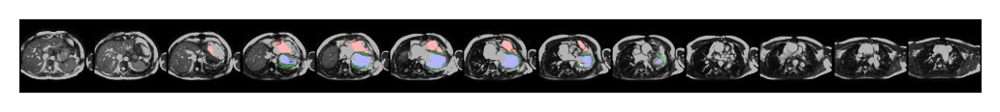

2020-12-01 15:53:20,354 INFO AX --> SAX rotated by the model
2020-12-01 15:53:20,355 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:53:20,387 INFO Target (AX2SAX):
2020-12-01 15:53:20,387 INFO Repeat the transformation on the full resolution
2020-12-01 15:53:22,919 INFO Predicted mask
2020-12-01 15:53:24,501 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:53:24,605 INFO DICE LV: 0.8891841173171997
2020-12-01 15:53:24,672 INFO DICE RV: 0.764316976070404
2020-12-01 15:53:24,739 INFO DICE MYO: 0.6594034433364868
2020-12-01 15:53:24,744 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:53:24,750 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:53:25,223 INFO Predicted mask rotated to AX on original AX image


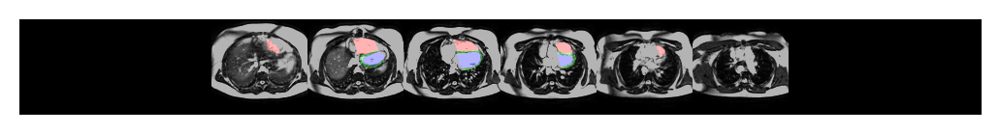

2020-12-01 15:53:25,621 INFO GT on AX


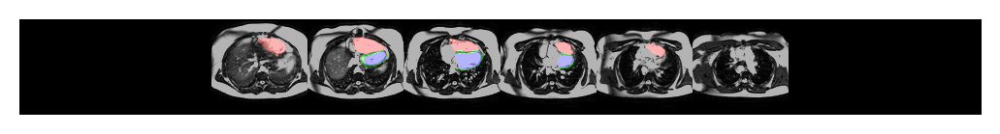

2020-12-01 15:53:26,408 INFO inv mask shape: (24, 256, 256, 4), gt mask shape: (24, 256, 256, 4)
2020-12-01 15:53:26,416 INFO DICE LV: 0.9007989168167114
2020-12-01 15:53:26,424 INFO DICE RV: 0.7762788534164429
2020-12-01 15:53:26,431 INFO DICE MYO: 0.6629151105880737
2020-12-01 15:53:26,472 INFO m: [[ 0.4695  -0.883   -0.02812 -0.9937 ]
 [ 0.366    0.165    0.916   -0.988  ]
 [-0.8037  -0.4404   0.4004  10.95   ]]
2020-12-01 15:53:26,472 INFO m_mod: [[ 0.4695  -0.883   -0.02812 -0.2856 ]
 [ 0.366    0.165    0.916    0.7734 ]
 [-0.8037  -0.4404   0.4004   0.982  ]]
2020-12-01 15:53:26,473 INFO m_scaled: [[ 0.4695  -0.883   -0.02812 -0.5713 ]
 [ 0.366    0.165    0.916    1.547  ]
 [-0.8037  -0.4404   0.4004   1.964  ]]
2020-12-01 15:53:26,474 INFO 0000-JP6XAZWH_2007-03-02_ES_msk.nrrd
2020-12-01 15:53:26,474 INFO Prediction on AX volume:


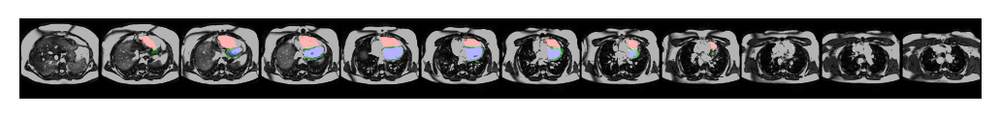

2020-12-01 15:53:27,276 INFO AX --> SAX rotated by the model
2020-12-01 15:53:27,277 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:53:27,309 INFO Target (AX2SAX):
2020-12-01 15:53:27,310 INFO Repeat the transformation on the full resolution
2020-12-01 15:53:29,784 INFO Predicted mask
2020-12-01 15:53:31,300 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:53:31,403 INFO DICE LV: 0.7546131014823914
2020-12-01 15:53:31,469 INFO DICE RV: 0.5989271998405457
2020-12-01 15:53:31,535 INFO DICE MYO: 0.7112651467323303
2020-12-01 15:53:31,540 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:53:31,546 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:53:32,028 INFO Predicted mask rotated to AX on original AX image


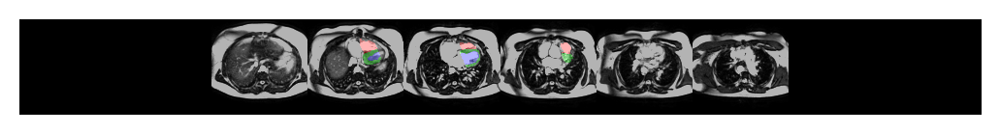

2020-12-01 15:53:32,422 INFO GT on AX


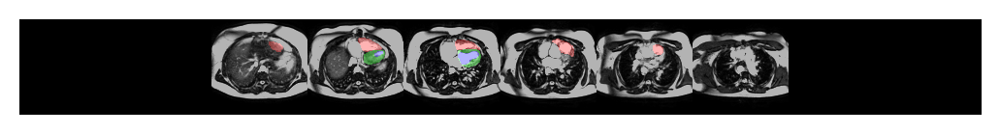

2020-12-01 15:53:33,216 INFO inv mask shape: (24, 256, 256, 4), gt mask shape: (24, 256, 256, 4)
2020-12-01 15:53:33,224 INFO DICE LV: 0.7447474598884583
2020-12-01 15:53:33,231 INFO DICE RV: 0.6066790819168091
2020-12-01 15:53:33,239 INFO DICE MYO: 0.6948330998420715
2020-12-01 15:53:33,281 INFO m: [[ 4.7510e-01 -8.7988e-01 -7.7553e-03 -9.9268e-01]
 [ 3.6426e-01  1.8860e-01  9.1211e-01 -9.8682e-01]
 [-8.0127e-01 -4.3604e-01  4.1016e-01  1.0734e+01]]
2020-12-01 15:53:33,281 INFO m_mod: [[ 0.475    -0.88     -0.007755 -0.2808  ]
 [ 0.3643    0.1886    0.912     0.758   ]
 [-0.8013   -0.436     0.4102    0.9624  ]]
2020-12-01 15:53:33,282 INFO m_scaled: [[ 0.475    -0.88     -0.007755 -0.5615  ]
 [ 0.3643    0.1886    0.912     1.516   ]
 [-0.8013   -0.436     0.4102    1.925   ]]
2020-12-01 15:53:33,283 INFO 0000-K4HCL72E_2007-03-27_ED_msk.nrrd
2020-12-01 15:53:33,283 INFO Prediction on AX volume:


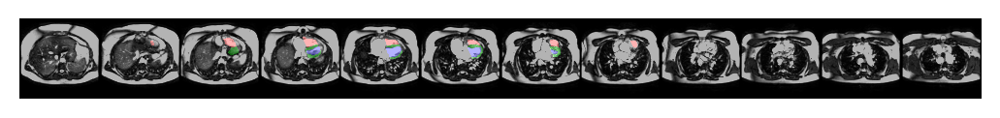

2020-12-01 15:53:34,074 INFO AX --> SAX rotated by the model
2020-12-01 15:53:34,075 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:53:34,105 INFO Target (AX2SAX):
2020-12-01 15:53:34,106 INFO Repeat the transformation on the full resolution
2020-12-01 15:53:36,570 INFO Predicted mask
2020-12-01 15:53:38,098 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:53:38,201 INFO DICE LV: 0.9229810237884521
2020-12-01 15:53:38,268 INFO DICE RV: 0.8250889182090759
2020-12-01 15:53:38,334 INFO DICE MYO: 0.7237505912780762
2020-12-01 15:53:38,340 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:53:38,345 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:53:38,812 INFO Predicted mask rotated to AX on original AX image


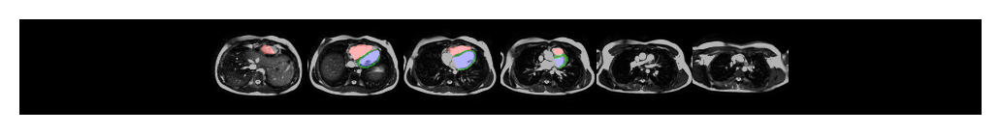

2020-12-01 15:53:39,214 INFO GT on AX


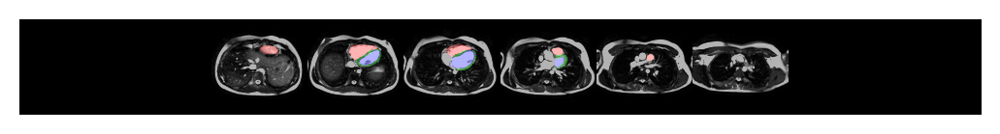

2020-12-01 15:53:40,372 INFO inv mask shape: (23, 256, 256, 4), gt mask shape: (23, 256, 256, 4)
2020-12-01 15:53:40,380 INFO DICE LV: 0.9261730909347534
2020-12-01 15:53:40,386 INFO DICE RV: 0.8307972550392151
2020-12-01 15:53:40,392 INFO DICE MYO: 0.7208276987075806
2020-12-01 15:53:40,434 INFO m: [[ 0.4873  -0.8726   0.03888 -0.9907 ]
 [ 0.3604   0.2417   0.901   -0.9834 ]
 [-0.7954  -0.4248   0.432   10.23   ]]
2020-12-01 15:53:40,435 INFO m_mod: [[ 0.4873  -0.8726   0.03888 -0.2695 ]
 [ 0.3604   0.2417   0.901    0.7227 ]
 [-0.7954  -0.4248   0.432    0.9175 ]]
2020-12-01 15:53:40,435 INFO m_scaled: [[ 0.4873  -0.8726   0.03888 -0.539  ]
 [ 0.3604   0.2417   0.901    1.445  ]
 [-0.7954  -0.4248   0.432    1.835  ]]
2020-12-01 15:53:40,436 INFO 0000-K4HCL72E_2007-03-27_ES_msk.nrrd
2020-12-01 15:53:40,436 INFO Prediction on AX volume:


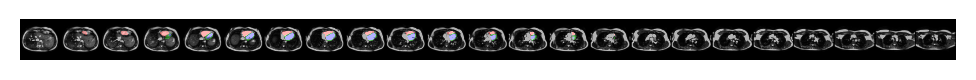

2020-12-01 15:53:41,331 INFO AX --> SAX rotated by the model
2020-12-01 15:53:41,332 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:53:41,352 INFO Target (AX2SAX):
2020-12-01 15:53:41,353 INFO Repeat the transformation on the full resolution
2020-12-01 15:53:43,779 INFO Predicted mask
2020-12-01 15:53:45,302 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:53:45,404 INFO DICE LV: 0.8793158531188965
2020-12-01 15:53:45,469 INFO DICE RV: 0.7550771832466125
2020-12-01 15:53:45,535 INFO DICE MYO: 0.7724303603172302
2020-12-01 15:53:45,541 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:53:45,546 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:53:46,005 INFO Predicted mask rotated to AX on original AX image


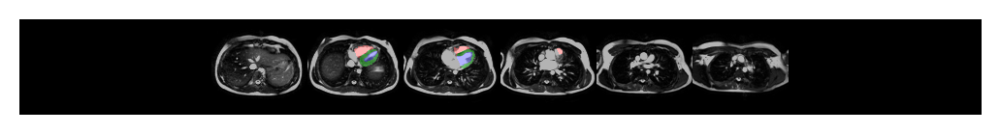

2020-12-01 15:53:46,403 INFO GT on AX


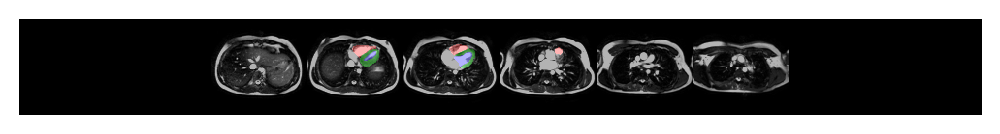

2020-12-01 15:53:47,564 INFO inv mask shape: (23, 256, 256, 4), gt mask shape: (23, 256, 256, 4)
2020-12-01 15:53:47,570 INFO DICE LV: 0.8815263509750366
2020-12-01 15:53:47,578 INFO DICE RV: 0.7608032822608948
2020-12-01 15:53:47,584 INFO DICE MYO: 0.758863627910614
2020-12-01 15:53:47,626 INFO m: [[ 0.4868 -0.873   0.0386 -0.9907]
 [ 0.36    0.2407  0.9014 -0.984 ]
 [-0.796  -0.4248  0.4314 10.234 ]]
2020-12-01 15:53:47,626 INFO m_mod: [[ 0.4868 -0.873   0.0386 -0.27  ]
 [ 0.36    0.2407  0.9014  0.723 ]
 [-0.796  -0.4248  0.4314  0.918 ]]
2020-12-01 15:53:47,627 INFO m_scaled: [[ 0.4868 -0.873   0.0386 -0.54  ]
 [ 0.36    0.2407  0.9014  1.446 ]
 [-0.796  -0.4248  0.4314  1.836 ]]
2020-12-01 15:53:47,627 INFO 0000-K61NJJ2D_2007-05-29_ED_msk.nrrd
2020-12-01 15:53:47,628 INFO Prediction on AX volume:


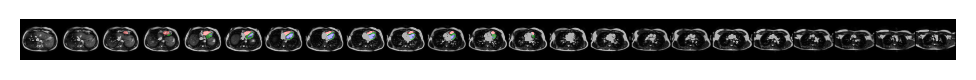

2020-12-01 15:53:48,495 INFO AX --> SAX rotated by the model
2020-12-01 15:53:48,496 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:53:48,534 INFO Target (AX2SAX):
2020-12-01 15:53:48,535 INFO Repeat the transformation on the full resolution
2020-12-01 15:53:50,954 INFO Predicted mask
2020-12-01 15:53:52,463 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:53:52,565 INFO DICE LV: 0.8740035891532898
2020-12-01 15:53:52,630 INFO DICE RV: 0.7682895064353943
2020-12-01 15:53:52,697 INFO DICE MYO: 0.5229904651641846
2020-12-01 15:53:52,702 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:53:52,708 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:53:53,176 INFO Predicted mask rotated to AX on original AX image


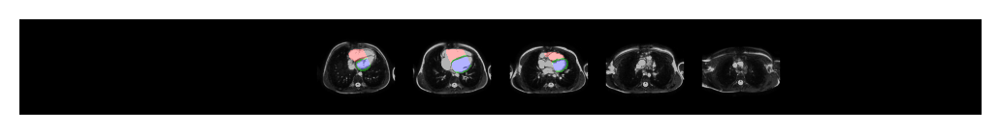

2020-12-01 15:53:53,563 INFO GT on AX


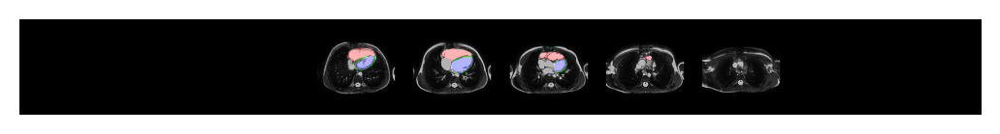

2020-12-01 15:53:54,541 INFO inv mask shape: (19, 288, 288, 4), gt mask shape: (19, 288, 288, 4)
2020-12-01 15:53:54,549 INFO DICE LV: 0.8780712485313416
2020-12-01 15:53:54,557 INFO DICE RV: 0.7674843668937683
2020-12-01 15:53:54,565 INFO DICE MYO: 0.5061910152435303
2020-12-01 15:53:54,606 INFO m: [[ 0.4917  -0.869    0.05444 -0.99   ]
 [ 0.3582   0.259    0.897   -0.9824 ]
 [-0.7935  -0.4216   0.4387  10.05   ]]
2020-12-01 15:53:54,606 INFO m_mod: [[ 0.4917  -0.869    0.05444 -0.2656 ]
 [ 0.3582   0.259    0.897    0.7095 ]
 [-0.7935  -0.4216   0.4387   0.901  ]]
2020-12-01 15:53:54,607 INFO m_scaled: [[ 0.4917  -0.869    0.05444 -0.5312 ]
 [ 0.3582   0.259    0.897    1.419  ]
 [-0.7935  -0.4216   0.4387   1.802  ]]
2020-12-01 15:53:54,608 INFO 0000-K61NJJ2D_2007-05-29_ES_msk.nrrd
2020-12-01 15:53:54,608 INFO Prediction on AX volume:


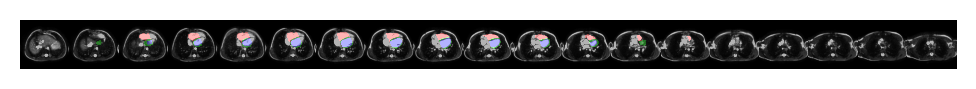

2020-12-01 15:53:55,472 INFO AX --> SAX rotated by the model
2020-12-01 15:53:55,473 INFO AX --> SAX with modified m rotated by the model
2020-12-01 15:53:55,499 INFO Target (AX2SAX):
2020-12-01 15:53:55,499 INFO Repeat the transformation on the full resolution
2020-12-01 15:53:57,924 INFO Predicted mask
2020-12-01 15:53:59,437 INFO Predicted mask rotated to AX on original AX image - before postprocessing
2020-12-01 15:53:59,540 INFO DICE LV: 0.7746484875679016
2020-12-01 15:53:59,606 INFO DICE RV: 0.5182338356971741
2020-12-01 15:53:59,672 INFO DICE MYO: 0.5875461101531982
2020-12-01 15:53:59,677 INFO Predicted mask rotated to AX on original AX image - after closing
2020-12-01 15:53:59,683 INFO Predicted mask rotated to AX on original AX image - after opening
2020-12-01 15:54:00,150 INFO Predicted mask rotated to AX on original AX image


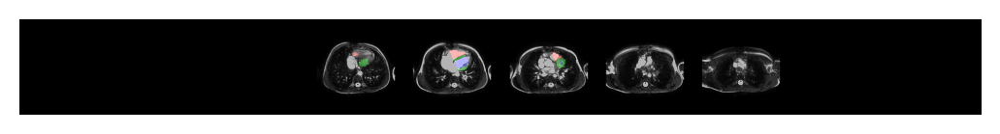

2020-12-01 15:54:00,545 INFO GT on AX


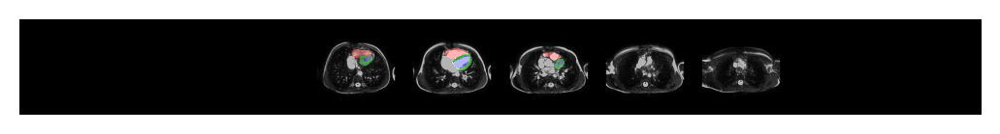

2020-12-01 15:54:01,542 INFO inv mask shape: (19, 288, 288, 4), gt mask shape: (19, 288, 288, 4)
2020-12-01 15:54:01,551 INFO DICE LV: 0.8047822117805481
2020-12-01 15:54:01,557 INFO DICE RV: 0.5078507661819458
2020-12-01 15:54:01,564 INFO DICE MYO: 0.6258761882781982
2020-12-01 15:54:01,607 INFO m: [[ 0.4875  -0.872    0.03986 -0.9907 ]
 [ 0.3599   0.2426   0.901   -0.9834 ]
 [-0.7954  -0.4248   0.432   10.2    ]]
2020-12-01 15:54:01,608 INFO m_mod: [[ 0.4875  -0.872    0.03986 -0.269  ]
 [ 0.3599   0.2426   0.901    0.7207 ]
 [-0.7954  -0.4248   0.432    0.915  ]]
2020-12-01 15:54:01,609 INFO m_scaled: [[ 0.4875  -0.872    0.03986 -0.538  ]
 [ 0.3599   0.2426   0.901    1.441  ]
 [-0.7954  -0.4248   0.432    1.83   ]]


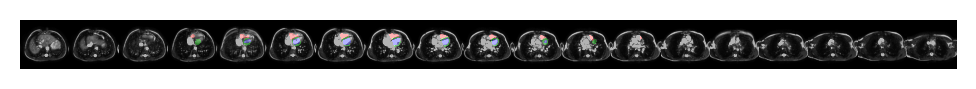

In [18]:
# predict on all test images, once with postprocessing, and once without
use_modified_translation = FOCUS_LOSS # True, if we use the unet extension to learn a second set of translation parameters
combine = False
dual_model = False
experiment_identifier = 'tests_72_112_112_sp3_1ax_1sax_1focus_thres08_inpl_f0_2nd_unet_round_crop'

logging.info('use modified translation to scale: {}'.format(use_modified_translation))
path_1 = 'data/predicted/{}/3D/'.format(experiment_identifier)
path_2 = path_1.replace('_post', '_NoPost')

# make predictions with different parameters in the same flow
for i in range(ax_full.shape[0]):
    select_image_in_batch_(im=i,slice_n=5, debug=False,export_path=path_1, save=True, postprocess=True, use_mod_translation=use_modified_translation, combine=combine, dual_model=dual_model)
    #select_image_in_batch_(im=i,slice_n=5, debug=False,export_path=path_1, save=True, postprocess=False, use_mod_translation=use_modified_translation, combine=combine, dual_model=dual_model)

In [ ]:
# Initial version, please check before execute
assert(False==True)
@interact
def select_image_in_batch(im=(0, x_.shape[0] - 1, 1), 
                          slice_n=(1, 6), 
                          export_path='data/predicted/temp/',
                          shift_z=20,
                          debug=False,
                         save=False):
    """
    Use the spatial transformer to rotate, predict segmentations, reverse the rotation on the masks and save the nrrd files (image, gt and pred)
    :param im: slider to select another image from the generator
    :param slice_n: The show_2D_3D method slices to a maximum of 20 slices in z, this parameter allows to further slice the visualisations
    :param export_path: path to save the img, gt and prediction volumes as nrrd file, the file names will be the same as in x_ax_val...
    :param debug: bool to enable plotting of the intermediate steps
    :return: void
    """
    global m

    full_file_name = y_val_ax[im]
    filename = os.path.basename(full_file_name)
    logging.info(filename)
    temp = x_[im]
    temp_ = y_[im]
    ax_full_ = ax_full[im]
    ax_msk_full_gt = ax_msk_[im]
    
    # define a different logging level to make the generator steps visible
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Prediction on AX volume:')
    if debug: show_2D_or_3D(temp[::slice_n])
    plt.show()
    
    # Predict rotation of AX and get transformation matrix
    logging.info('AX --> SAX rotated by the model')
    pred, m, mask_pred= model.predict(np.expand_dims(temp, axis=0))
    if debug: show_2D_or_3D(pred[0][::slice_n])
    plt.show()
    
    # make copy of m for reusage
    #m_ = m.copy()
    m = np.reshape(m, (3,4))
    # scale translation part of the affine matrix from spacing 5 to 1.5
    m_t = m[:,3]
    m_t = (m_t *5)/1.5
    m[:,3] = m_t
    m_ = m.flatten()
    
    # show the target AXtoSAX volume
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Target (SAX):')
    if debug: show_2D_or_3D(temp_[::slice_n])
    plt.show()
    
    # Repeat the transformation on ax with full resolution
    logging.info('Repeat the transformation on the full resolution')
    logging.getLogger().setLevel(logging.ERROR)
    transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='linear')
    pred, m_ = transformer.predict(x=[np.expand_dims(ax_full_, axis=0), np.expand_dims(m_,axis=0)])
    if debug: show_2D_or_3D(pred[0][::slice_n*3])
    plt.show()
    
    # reshape m to matrix
    m = np.reshape(m, (3, 4))

    # create a square ident matrix slice m into it
    m_matrix = np.identity(4)
    # slice m (3,4) into identity (4,4)
    m_matrix[:3, :] = m
    # calc inverse, flatten the matrix and cut off the last row for the spatial transformer
    m_matrix_inverse = np.linalg.inv(m_matrix)
    m_matrix_inverse_flatten = m_matrix_inverse.flatten()[:-4]

    # apply the inverse to our AXtoSAX volume
    logging.getLogger().setLevel(logging.INFO)
    logging.info('Apply the invers rotation to our AXtoSAX')
    logging.getLogger().setLevel(logging.ERROR)
    inv, _ = transformer.predict(x=[pred, np.expand_dims(m_matrix_inverse_flatten, axis=0)])
    if debug: show_2D_or_3D(inv[0][::slice_n*3])
    plt.show()

    # load a 3D wrapper model for segmenting the new SAX
    if 'unet' in globals():
        msk = unet.predict(x=pred)
        msk = clean_3d_prediction_3d_cc(from_channel_to_flat(msk[0] >= 0.5))
        msk = transform_to_binary_mask(msk)
        logging.getLogger().setLevel(logging.INFO)
        logging.info('Predicted mask')
        if debug: show_2D_or_3D(pred[0][::slice_n*3], msk[::slice_n*3])
        plt.show()

        # apply inverse to our msk and plot it together with the inverse AXtoSAX
        logging.getLogger().setLevel(logging.ERROR)
        m_transformer = create_affine_transformer_fixed(config=msk_cfg, interp_method='nearest')
        inv_msk = list()
        for c in range(msk.shape[-1]):
            inv_m, _ = m_transformer.predict(
                x=[np.expand_dims(msk[..., c], axis=0), np.expand_dims(m_matrix_inverse_flatten, axis=0)])
            inv_msk.append(inv_m[..., 0] >= 0.5)
        inv_msk = np.stack(inv_msk, axis=-1)
        
        # postprocessing
        logging.getLogger().setLevel(logging.INFO)
        logging.info('Predicted mask rotated to AX on original AX image - before postprocessing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[0][::slice_n*3])
        plt.show()
        
        inv_msk = from_channel_to_flat(inv_msk[0])
        kernel = np.ones((5,5),np.uint8)
        kernel_small = np.ones((3,3),np.uint8)
        
        inv_msk = clean_3d_prediction_3d_cc(inv_msk)
        logging.info('Predicted mask rotated to AX on original AX image - after connected component filtering')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel_small) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after closing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel, iterations=2) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after opening')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        inv_msk = np.stack([cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel) for img in inv_msk],axis=0)
        logging.info('Predicted mask rotated to AX on original AX image - after closing')
        if debug: show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        inv_msk = clean_3d_prediction_3d_cc(inv_msk)
        logging.info('Predicted mask rotated to AX on original AX image - after connected component filtering')
        if debug: show_2D_or_3D(ax_full_, inv_msk)
        plt.show()

        logging.getLogger().setLevel(logging.INFO)
        logging.info('Predicted mask rotated to AX on inverse AXtoSAX')
        if debug: show_2D_or_3D(inv[0][::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        logging.info('Predicted mask rotated to AX on original AX image')
        show_2D_or_3D(ax_full_[::slice_n*3], inv_msk[::slice_n*3])
        plt.show()
        
        # get the AX target segmentation, processed by the generator to have it in the same shape
        #msk_flatten = clean_3d_prediction_3d_cc(from_channel_to_flat(inv_msk[0]))
        msk_gt_flatten = from_channel_to_flat(ax_msk_full_gt)
        logging.info('GT on AX')
        show_2D_or_3D(ax_full_[::slice_n*3], msk_gt_flatten[::slice_n*3])
        plt.show()
        
        # create a nrrd file for the gt, pred and image volume
        sitk_pred = sitk.GetImageFromArray(inv_msk)
        sitk_ax_img = sitk.GetImageFromArray(ax_full_)
        sitk_ax_msk = sitk.GetImageFromArray(msk_gt_flatten)

        ensure_dir(os.path.join(export_path, 'pred'))
        ensure_dir(os.path.join(export_path, 'image'))
        ensure_dir(os.path.join(export_path, 'gt'))
        
        # load a reference nrrd file, copy all metadata and save the volumes
        reference_sitk = sitk.ReadImage(full_file_name)
        if save:
            copy_meta_and_save(sitk_pred, reference_sitk, os.path.join(export_path, 'pred', filename))
            copy_meta_and_save(sitk_ax_img, reference_sitk,os.path.join(export_path, 'image', filename.replace('msk', 'img')))
            copy_meta_and_save(sitk_ax_msk, reference_sitk, os.path.join(export_path, 'gt', filename))
        # shutil.copyfile(full_file_name, os.path.join(export_path, 'gt', filename))
    else:
        logging.info('no unet in global namespace, segmentation is not possible')

    logging.info('MSE: {}'.format(mse(pred[0], ax_full_).numpy().mean()))
    #logging.info('MSE center cube: {}'.format(metr.cubic_center_loss_wrapper(pred[0], temp_).numpy().mean()))
    try:
        print(np.reshape(m[0], (3, 4)))
    except Exception as e:
        pass


# Further tests, where do our model fail, do we over- or under-segment

In [21]:
gt.shape

(144, 224, 224, 3)

In [22]:
zero = np.zeros_like(gt[...,0:1])
temp = np.concatenate((zero,gt),axis=-1)
temp.shape

(144, 224, 224, 4)

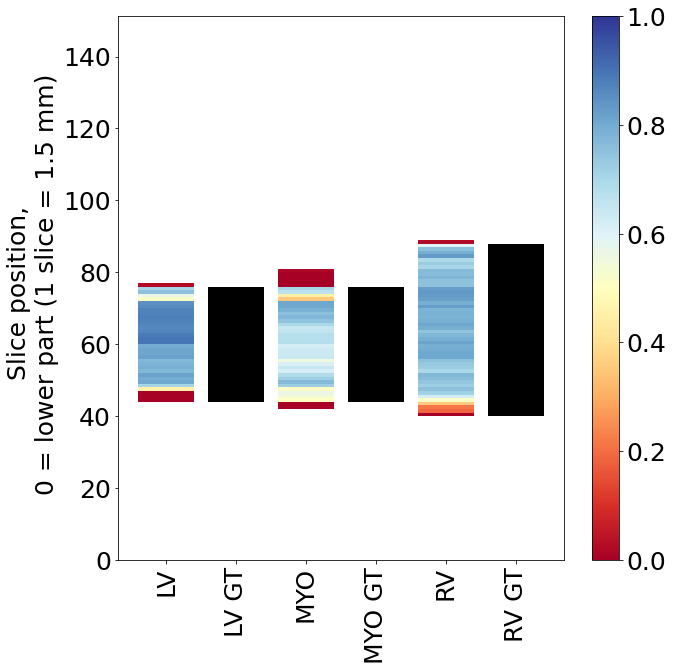

In [23]:
from src.visualization.Visualize import plot_dice_per_slice_bar, plot_dice_per_slice_line
plot_dice_per_slice_bar(gt,pred)

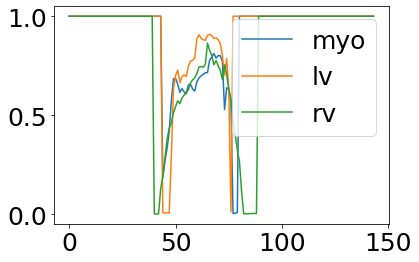

In [31]:
# Create a lineplot for the errors within the volume
plot_dice_per_slice_line(gt,pred)

# Temp tests

In [ ]:
cmap(1)

In [ ]:
# check the memory usage
import sys

# These are the usual ipython objects, including this one you are creating
ipython_vars = ['In', 'Out', 'exit', 'quit', 'get_ipython', 'ipython_vars']

# Get a sorted list of the objects and their sizes
sorted([(x, sys.getsizeof(globals().get(x))) for x in dir() if not x.startswith('_') and x not in sys.modules and x not in ipython_vars], key=lambda x: x[1], reverse=True)
